# Exploring the UTx000 Extension Beacon Data
(See [GH repo](https://github.com/intelligent-environments-lab/utx000))

# Outliers
This notebook helps look at potential outliers in the dataset

In [1]:
import warnings
warnings.filterwarnings('ignore')

# Package Import

In [35]:
import sys
sys.path.append('../')

from src.features import build_features, feature_engineering

import pandas as pd
import numpy as np
pd.set_option('display.max_columns', 200)
import scipy

from datetime import datetime, timedelta

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

import seaborn as sns

# Data Import

In [32]:
beacon_fitbit = pd.read_csv('../data/processed/beacon-fb_and_gps_filtered-ux_s20.csv',parse_dates=["timestamp"],infer_datetime_format=True)
data = feature_engineering.limit_dataset(beacon_fitbit,id_list=[1, 5, 6, 7, 10, 11, 15, 16, 17, 19, 21, 24, 25, 26, 28, 29, 34, 36, 38, 44])
data.head()

,timestamp,lat,long,altitude,accuracy,tvoc,lux,no2,co,co2,pm1_number,pm2p5_number,pm10_number,pm1_mass,pm2p5_mass,pm10_mass,temperature_c,rh,beacon,beiwe,fitbit,redcap,start_time,end_time
0,2020-08-10 05:10:00,30.58838,-97.42591,113.98145,5.29684,184.700000,2.04,1.576607,10.742600,1816.486399,0.145358,0.542964,0.690180,0.117692,1.831140,1.901793,24.0,33.183333,21,lkkjddam,25.0,12,2020-08-10 04:42:30,2020-08-10 12:35:30
1,2020-08-10 05:15:00,NaN,NaN,NaN,NaN,164.000000,2.04,1.593896,10.678200,1795.248137,0.178794,0.127553,0.239086,0.105759,1.878851,1.919541,24.0,33.000000,21,lkkjddam,25.0,12,2020-08-10 04:42:30,2020-08-10 12:35:30
2,2020-08-10 05:20:00,NaN,NaN,NaN,NaN,152.433333,2.04,1.590097,10.676133,1763.231375,0.186363,0.331404,0.427092,0.092665,1.652677,1.861326,24.0,33.000000,21,lkkjddam,25.0,12,2020-08-10 04:42:30,2020-08-10 12:35:30
3,2020-08-10 05:25:00,NaN,NaN,NaN,NaN,159.150000,2.04,1.585059,10.703900,1724.723961,NaN,NaN,NaN,0.050219,1.497815,1.833923,24.0,33.050000,21,lkkjddam,25.0,12,2020-08-10 04:42:30,2020-08-10 12:35:30
4,2020-08-10 05:30:00,NaN,NaN,NaN,NaN,143.933333,2.04,1.598890,10.667433,1772.028385,1.646941,2.084155,1.143728,0.117024,2.056448,1.964887,24.0,32.983333,21,lkkjddam,25.0,12,2020-08-10 04:42:30,2020-08-10 12:35:30


# Detecting Outliers
We go through the various methods presented [here](https://towardsdatascience.com/5-ways-to-detect-outliers-that-every-data-scientist-should-know-python-code-70a54335a623) and develop functions to help detect outliers.

In [29]:
def std_outliers(d,n_stds=3):
    """gets list of outliers based on number of stds from the mean"""
    # define a list to accumlate anomalies
    anomalies = []
    labels = []
    
    # Set upper and lower limit to 3 standard deviation
    std = np.nanstd(d)
    avg = np.nanmean(d)
    cut_off = std * n_stds
    
    lower_limit  = avg - cut_off 
    upper_limit = avg + cut_off
    
    # Generate outliers
    for outlier in d:
        if outlier > upper_limit or outlier < lower_limit:
            anomalies.append(outlier)
            labels.append("bad")
        else:
            labels.append("good")
    return anomalies, labels

In [30]:
def iqr_outliers(d,factor=1.5):
    """gets list of outliers based on IQR multiplied by a factor"""
    # define a list to accumlate anomalies
    anomalies = []
    labels = []
    
    # get IQR
    q1 = d.quantile(0.25)
    q3 = d.quantile(0.75)
    iqr = q3 - q1
    
    # Generate outliers
    for outlier in d:
        if outlier > q3 + iqr * factor or outlier < q1 - iqr * factor:
            anomalies.append(outlier)
            labels.append("bad")
        else:
            labels.append("good")
    return anomalies, labels

# Outliers by Individual
We start by looking at outliers based on the beacon/individual.

In [33]:
params = ["tvoc","co","no2","co2","pm2p5_mass","temperature_c"]

## Detection
In the next cell, we output the number of outliers for each parameter based on either the STD or IQR methods defined earlier. In addition, we create a scatter plot of the individual points to visually assess the outlier detection performance.

Beacon 21
	Number of outliers for tvoc: 37
	Number of outliers for co: 0
	Number of outliers for no2: 1
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 16
	Number of outliers for temperature_c: 26


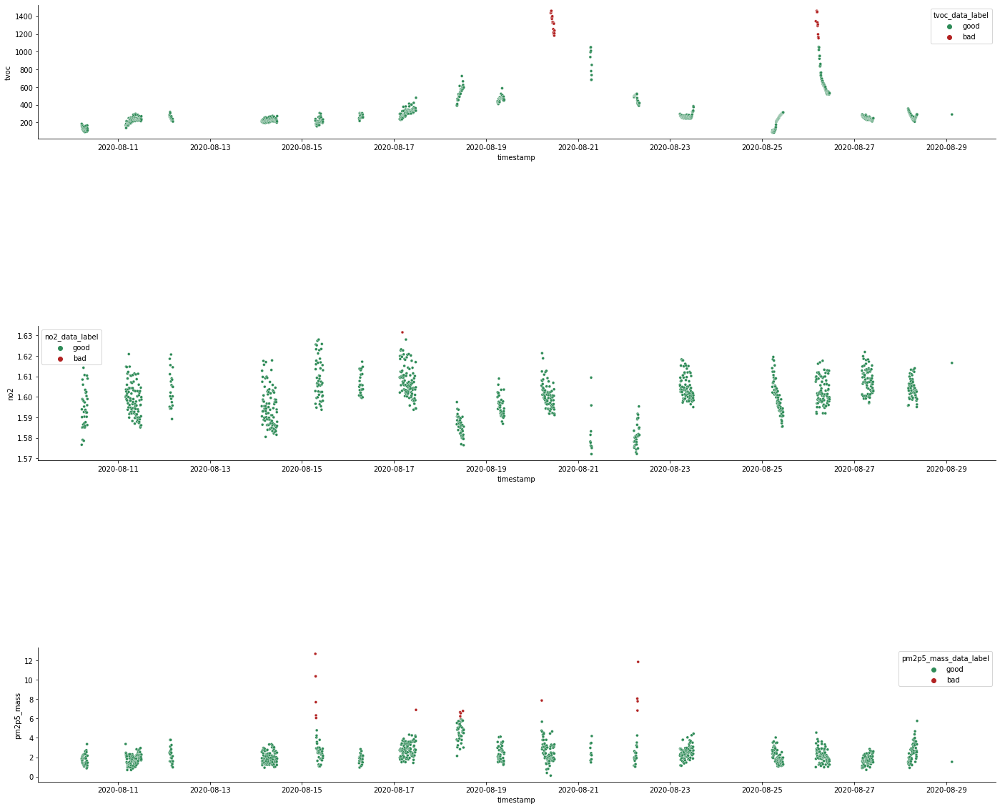

Beacon 6
	Number of outliers for tvoc: 23
	Number of outliers for co: 17
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 18
	Number of outliers for temperature_c: 0


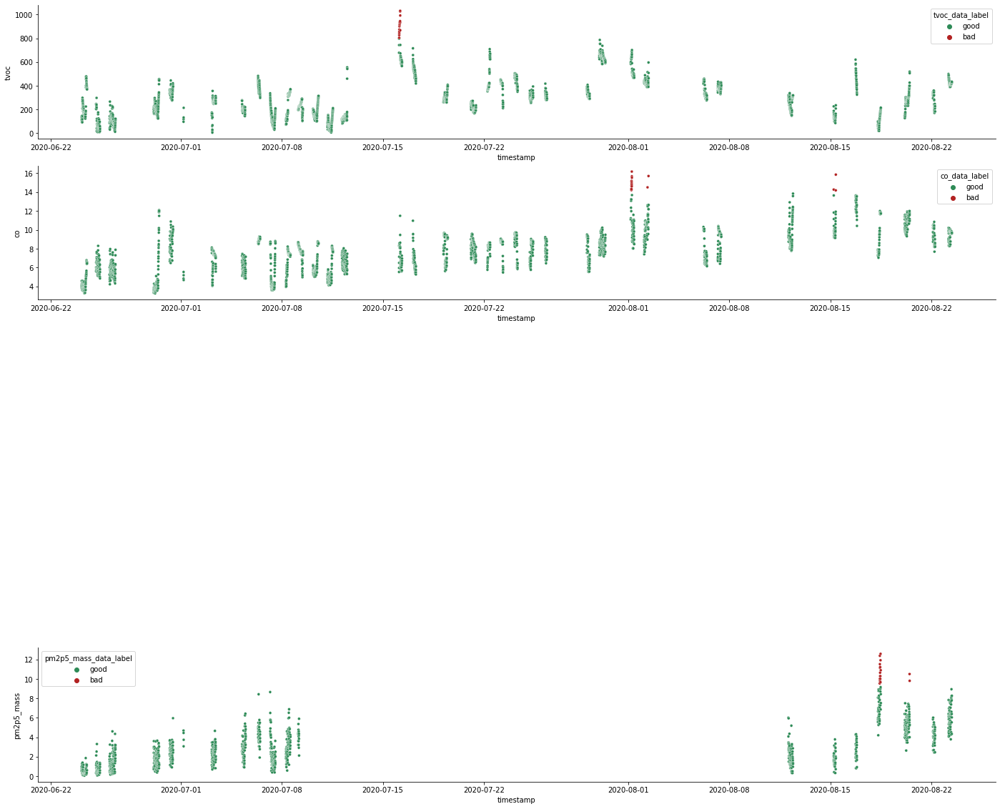

Beacon 7
	Number of outliers for tvoc: 0
	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 2
	Number of outliers for temperature_c: 0


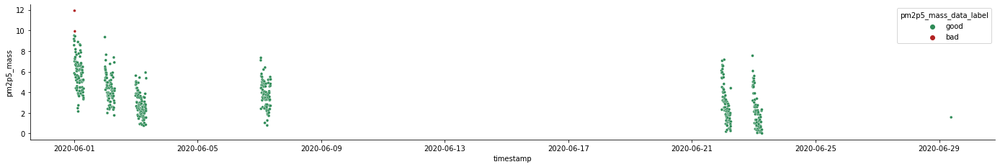

Beacon 19
	Number of outliers for tvoc: 0
	Number of outliers for co: 3
	Number of outliers for no2: 26
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 72
	Number of outliers for temperature_c: 3


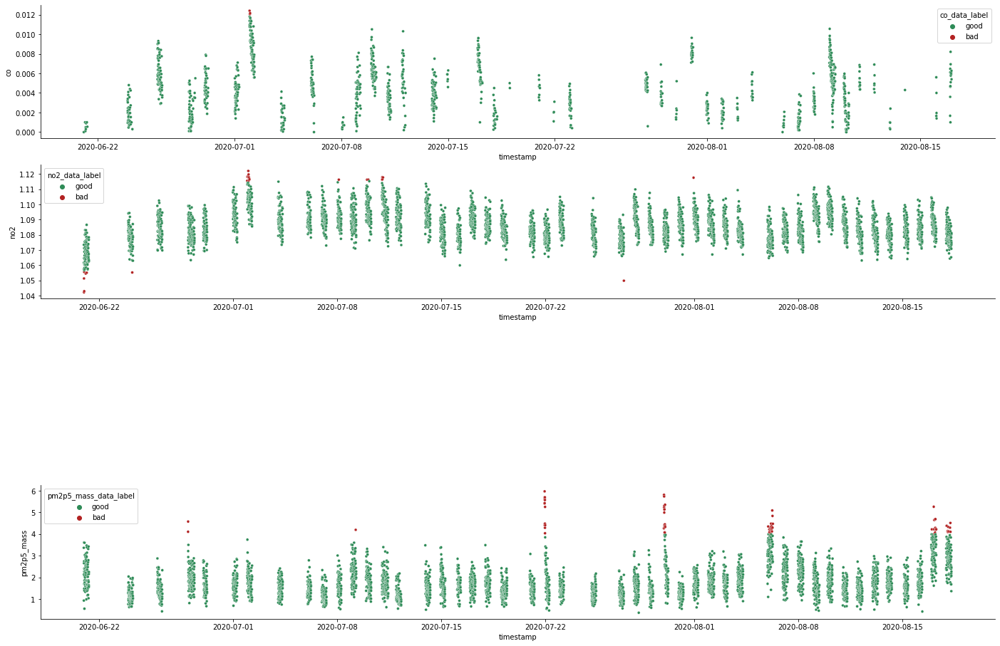

Beacon 29
	Number of outliers for tvoc: 20
	Number of outliers for co: 52
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 32
	Number of outliers for temperature_c: 0


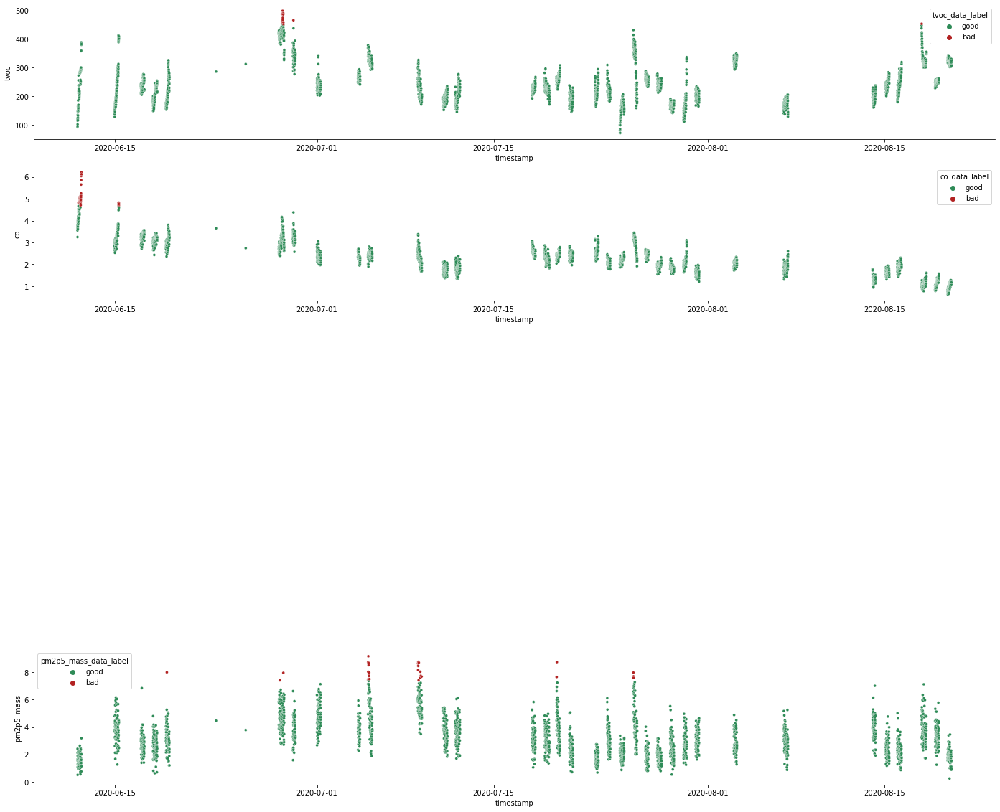

Beacon 10
	Number of outliers for tvoc: 6
	Number of outliers for co: 19
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 14
	Number of outliers for temperature_c: 0


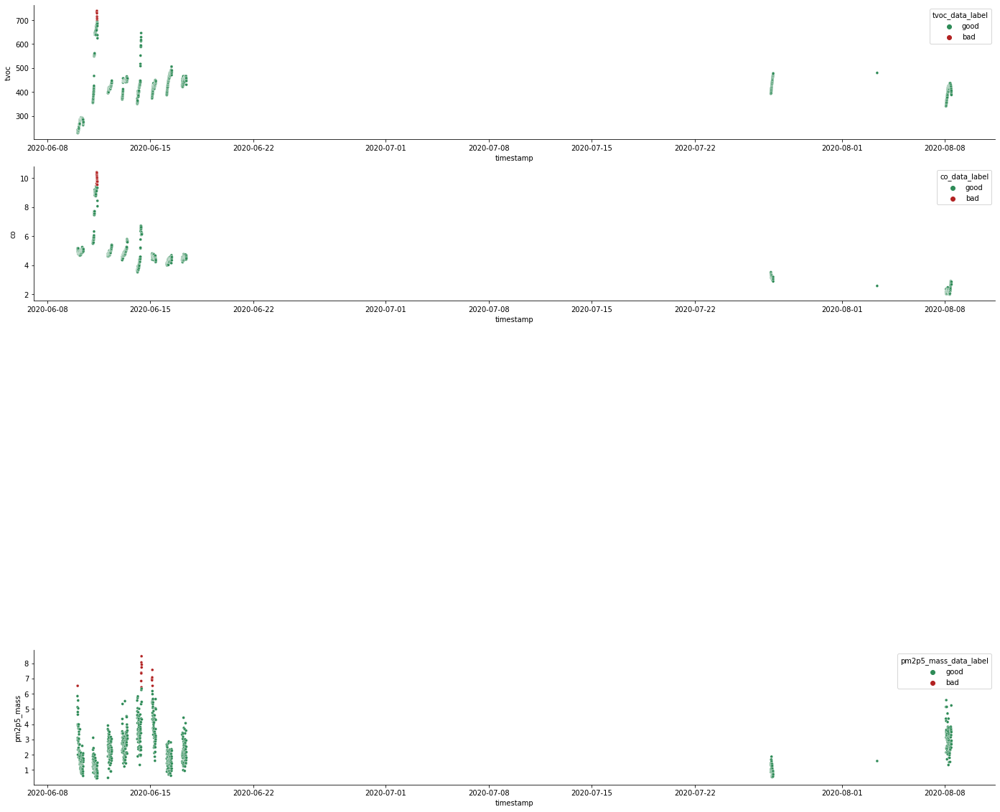

Beacon 1
	Number of outliers for tvoc: 12
	Number of outliers for co: 13
	Number of outliers for no2: 11
	Number of outliers for co2: 27
	Number of outliers for pm2p5_mass: 22
	Number of outliers for temperature_c: 0


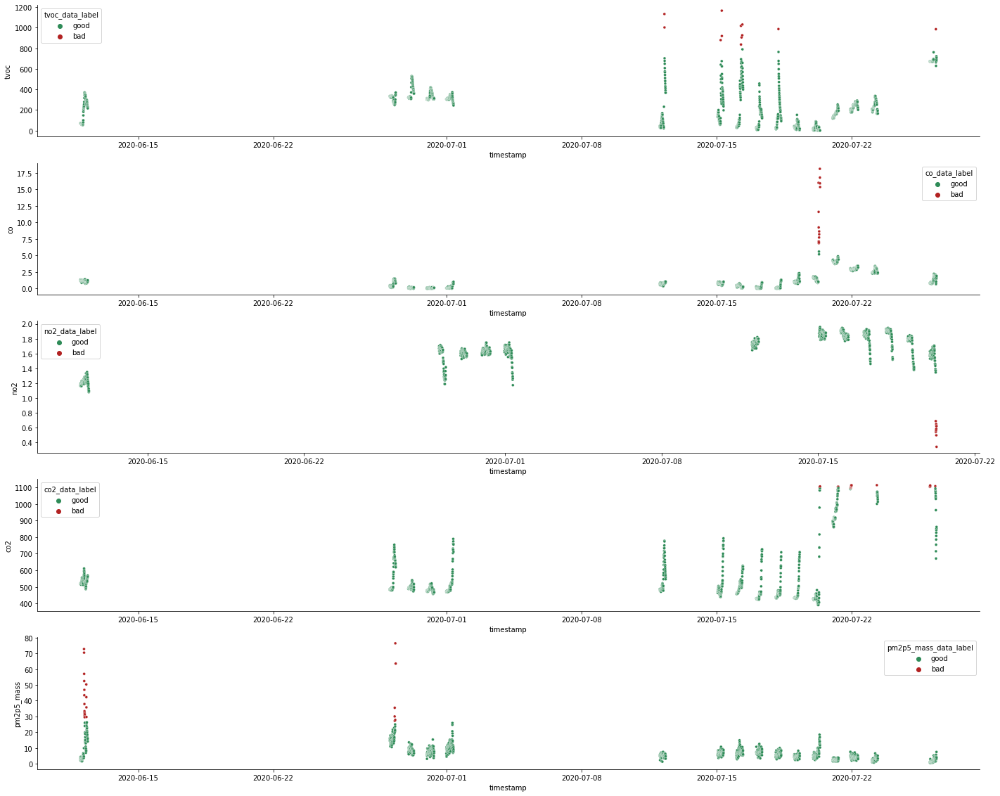

Beacon 16
	Number of outliers for tvoc: 0
	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 1
	Number of outliers for temperature_c: 0


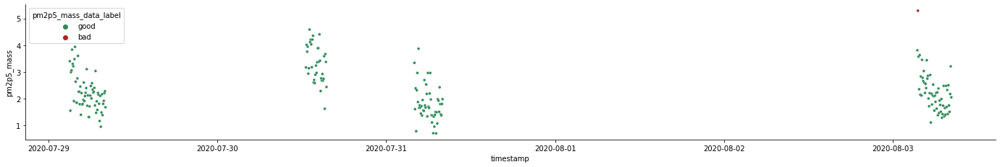

Beacon 5
	Number of outliers for tvoc: 23
	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 18
	Number of outliers for temperature_c: 0


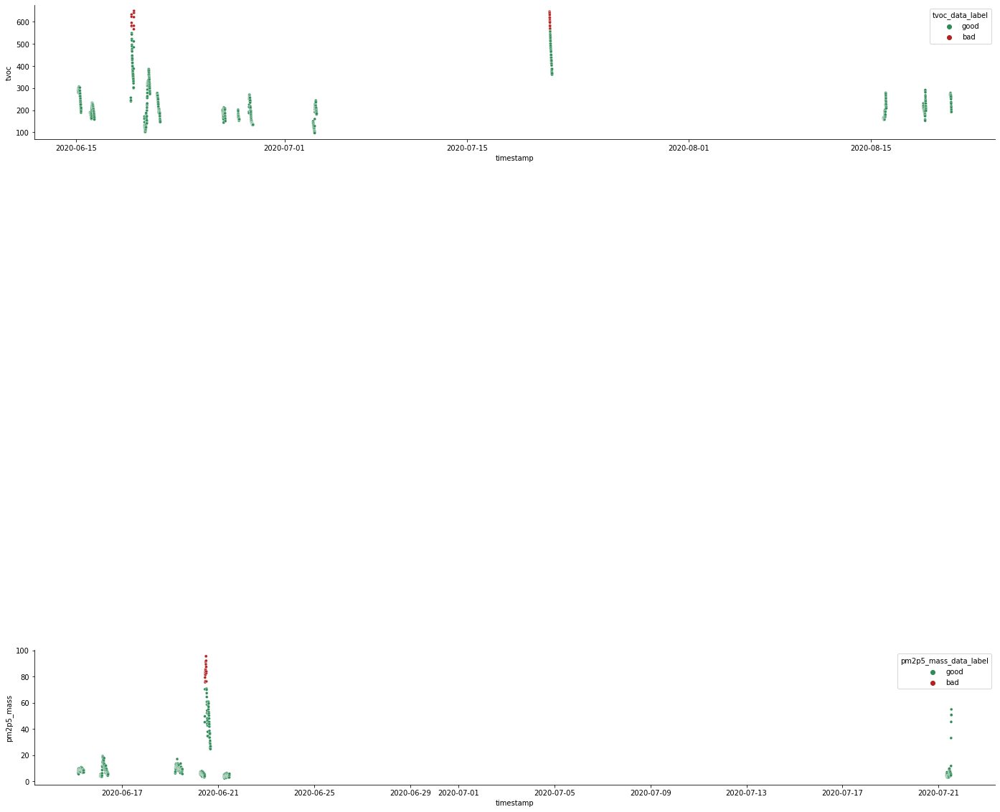

Beacon 26
	Number of outliers for tvoc: 16
	Number of outliers for co: 0
	Number of outliers for no2: 5
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 56
	Number of outliers for temperature_c: 0


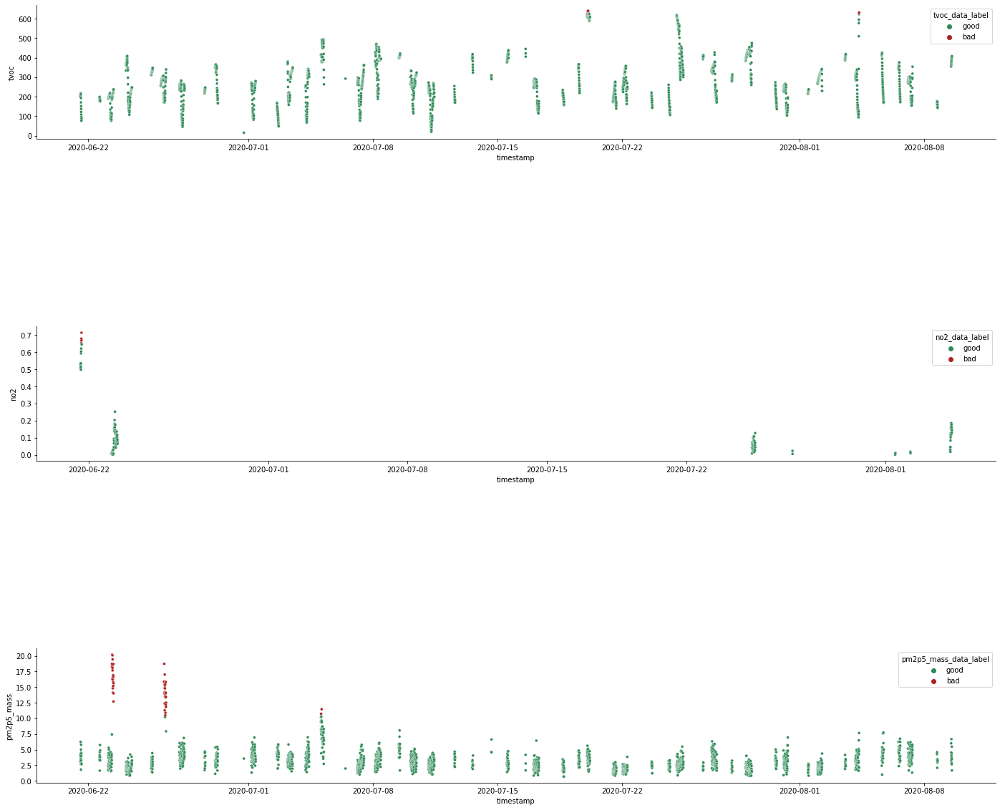

Beacon 25
	Number of outliers for tvoc: 22
	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 7
	Number of outliers for temperature_c: 0


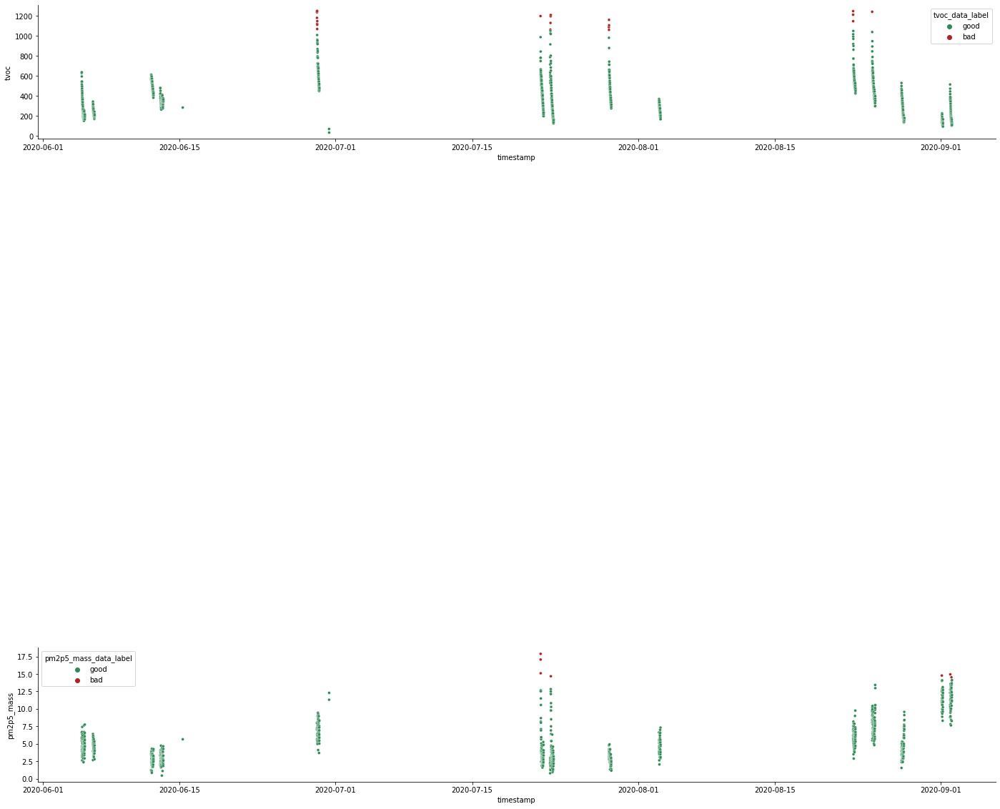

Beacon 38
	Number of outliers for tvoc: 13
	Number of outliers for co: 25
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 23
	Number of outliers for temperature_c: 0


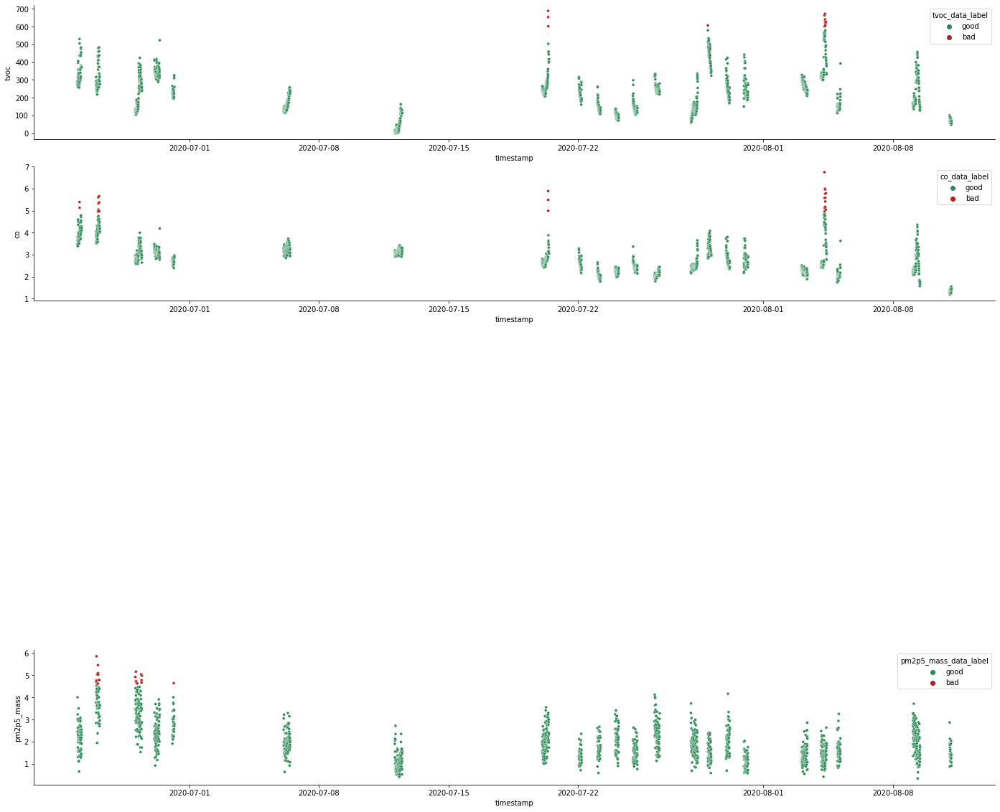

Beacon 34
	Number of outliers for tvoc: 0
	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for temperature_c: 0


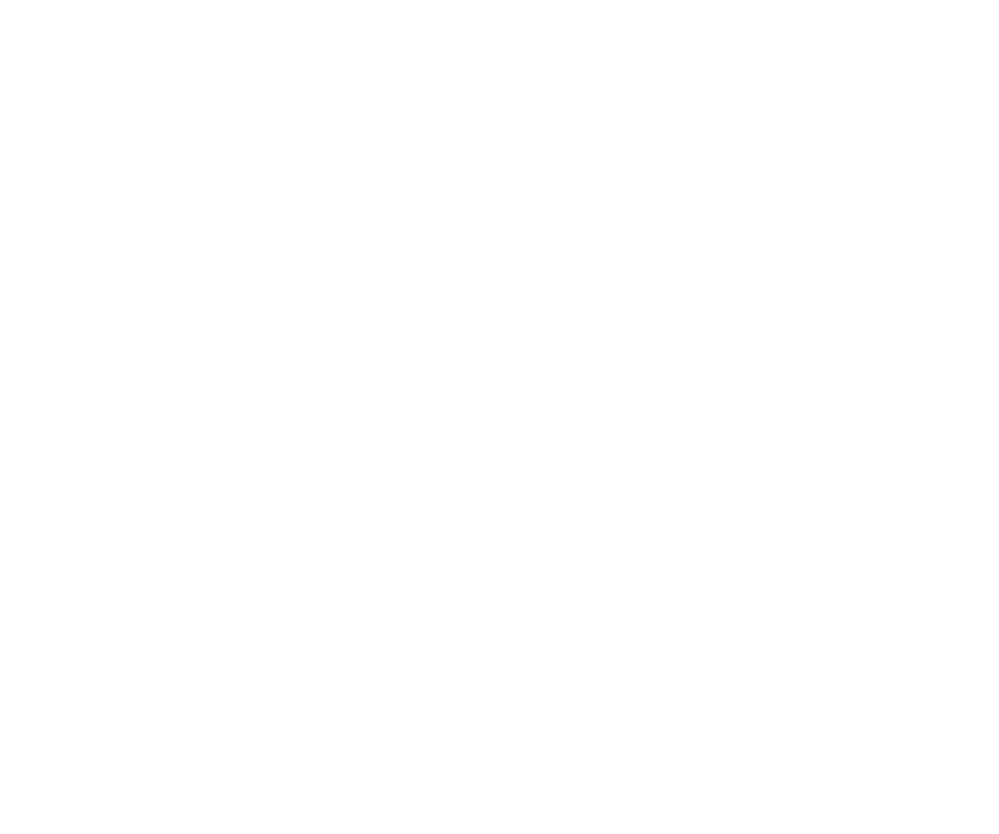

Beacon 44
	Number of outliers for tvoc: 0
	Number of outliers for co: 3
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 1
	Number of outliers for temperature_c: 0


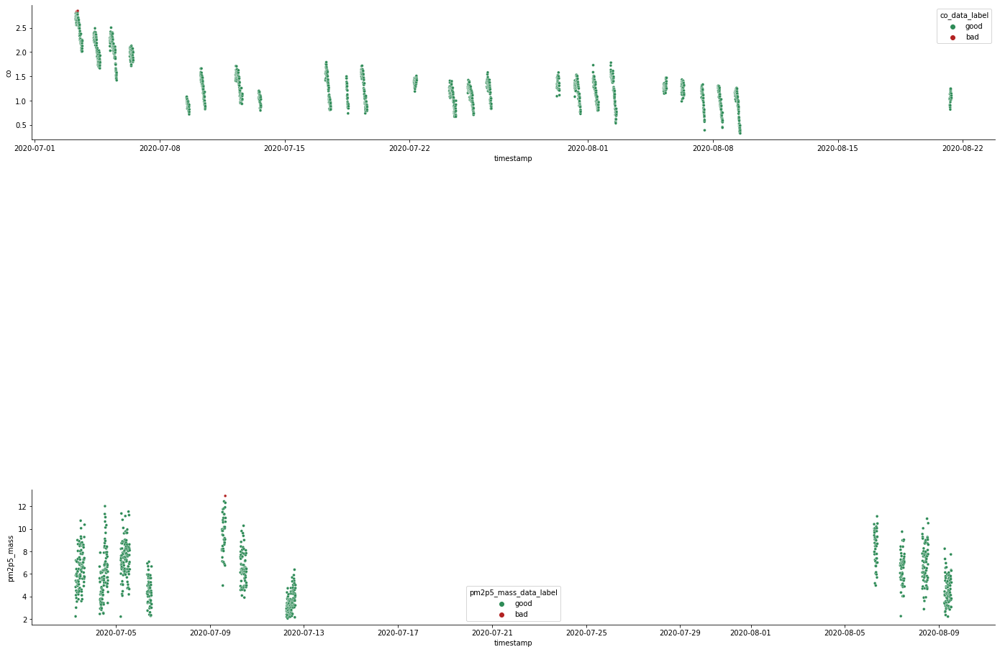

Beacon 15
	Number of outliers for tvoc: 0
	Number of outliers for co: 47
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 43
	Number of outliers for temperature_c: 25


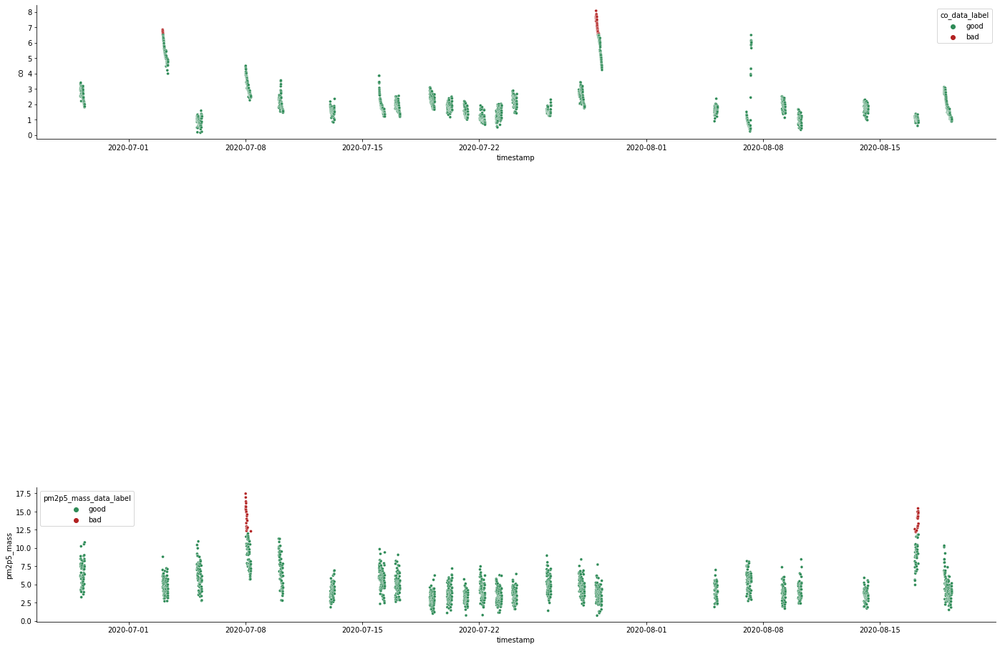

Beacon 24
	Number of outliers for tvoc: 0
	Number of outliers for co: 15
	Number of outliers for no2: 12
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 11
	Number of outliers for temperature_c: 0


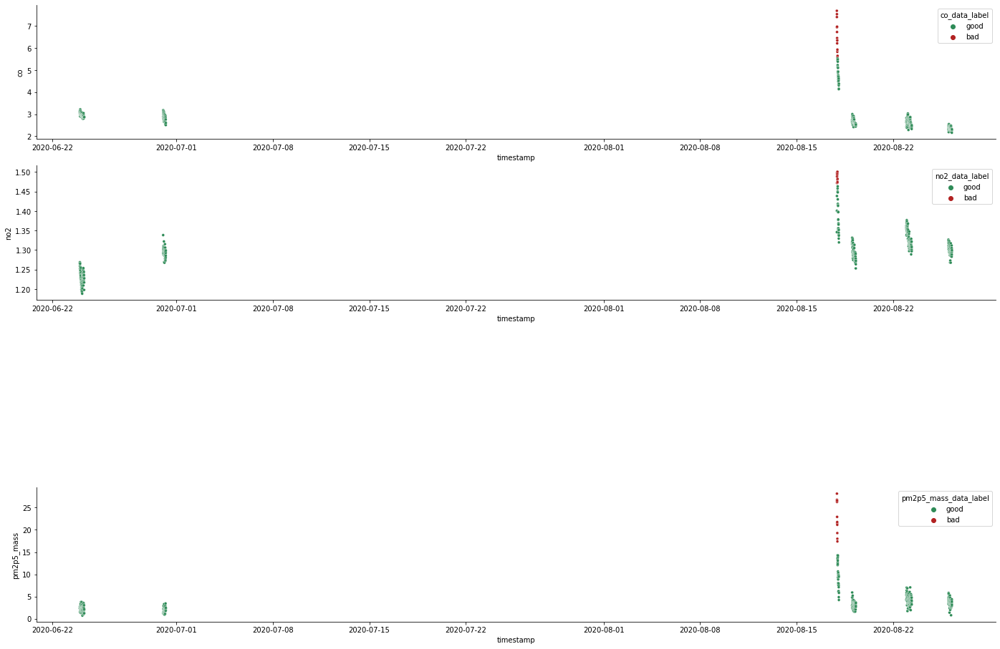

Beacon 11
	Number of outliers for tvoc: 0
	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for temperature_c: 32


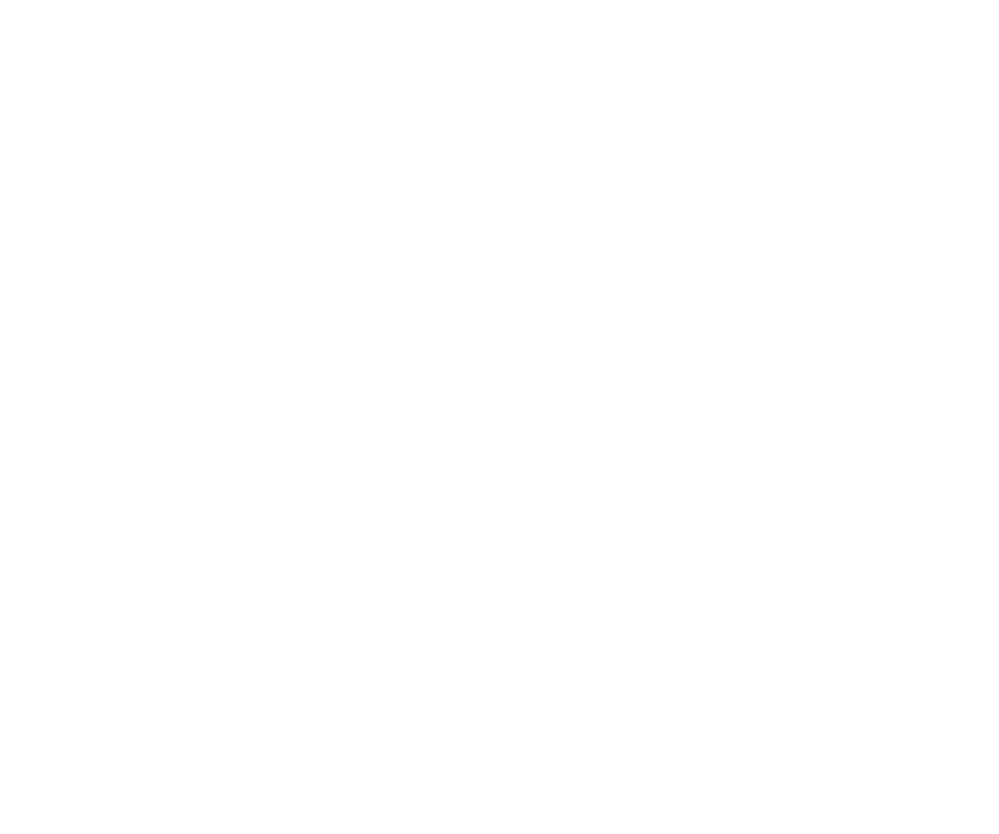

Beacon 28
	Number of outliers for tvoc: 0
	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for temperature_c: 0


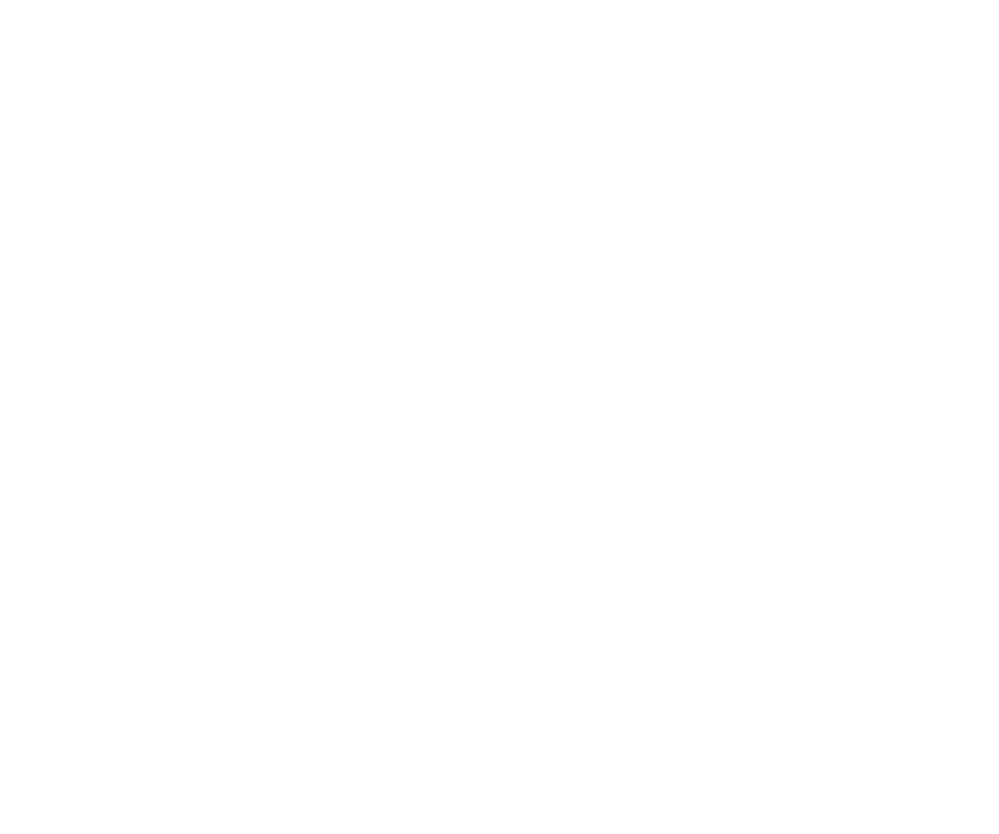

Beacon 36
	Number of outliers for tvoc: 0
	Number of outliers for co: 9
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 40
	Number of outliers for temperature_c: 2


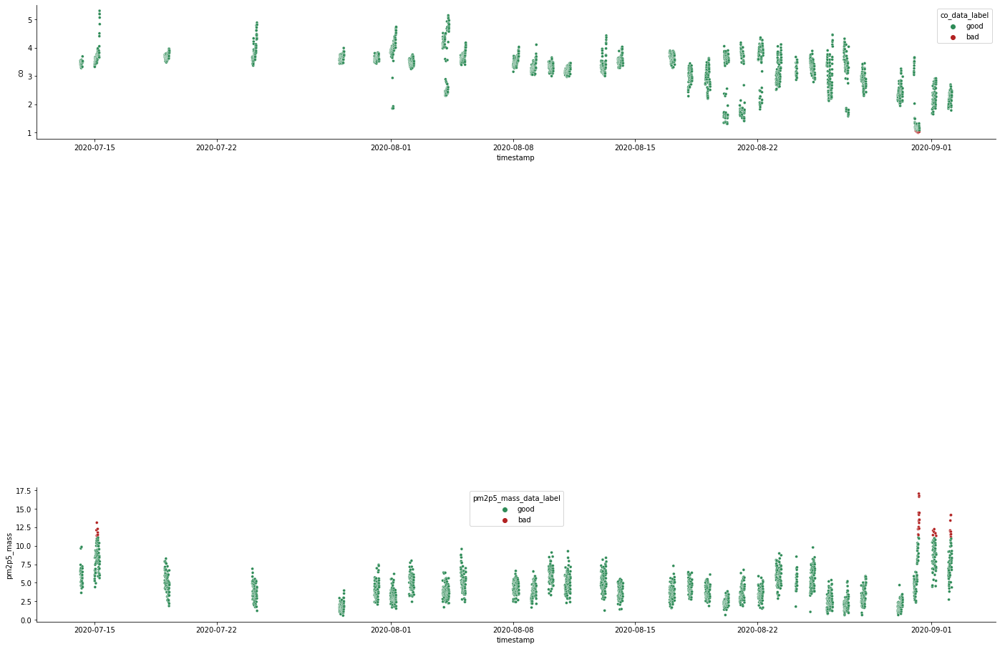

Beacon 17
	Number of outliers for tvoc: 9
	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 5
	Number of outliers for temperature_c: 0


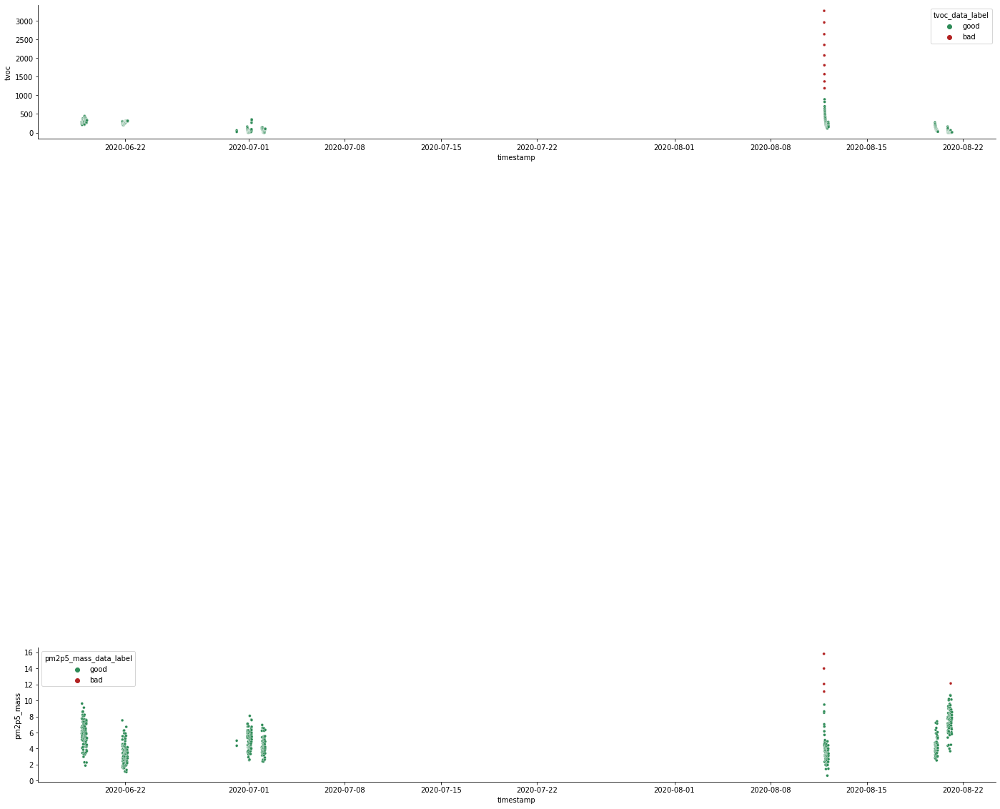

In [45]:
for bb in data["beacon"].unique():
    print("Beacon",bb)
    data_by_bb = data[data["beacon"] == bb]
    for param in params:
        outliers, labels = std_outliers(data_by_bb[param])
        data_by_bb[f"{param}_data_label"] = labels
        print(f"\tNumber of outliers for {param}: {len(outliers)}")
    fig, axes = plt.subplots(5,1,figsize=(24,20))
    for param, ax in zip(params,axes.flat):
        if len(data_by_bb[f"{param}_data_label"].unique()) == 2:
            sns.scatterplot(x="timestamp",y=param,hue=f"{param}_data_label",s=15,palette=["seagreen","firebrick"],data=data_by_bb,ax=ax)
            for loc in ["top","right"]:
                ax.spines[loc].set_visible(False)
        else:
            ax.set_visible(False)

    plt.show()
    plt.close()

# Outliers by Individual by Night
The major issue with just using IQR or STD is that we completely remove nights when the pollution level might be elevated. For this reason, we want to explore outlier detection by individual _by night_ which should help alleviate some of the issues.

Beacon 21
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 1


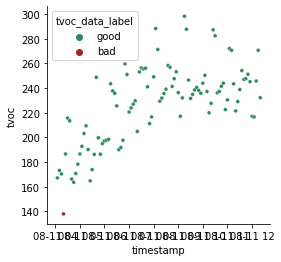

	Number of outliers for tvoc: 1


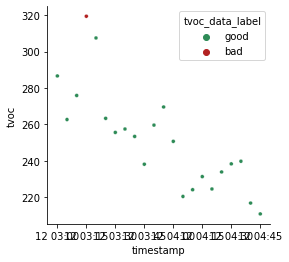

	Number of outliers for tvoc: 2


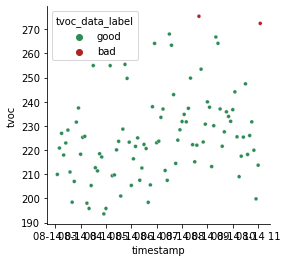

	Number of outliers for tvoc: 2


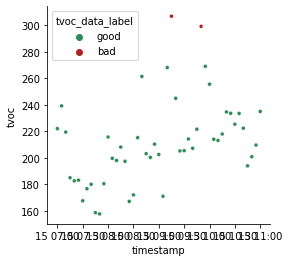

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 1


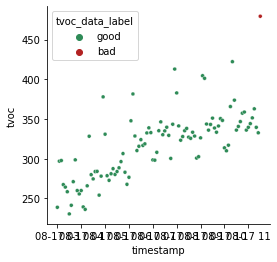

	Number of outliers for tvoc: 1


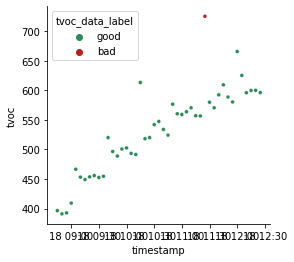

	Number of outliers for tvoc: 1


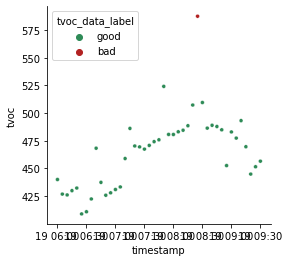

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 9


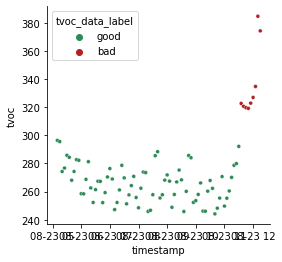

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 4


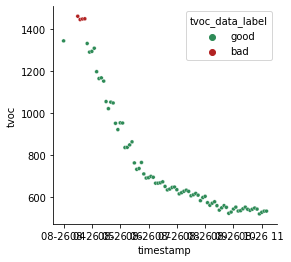

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for co: 0
	Number of outliers for co: 12


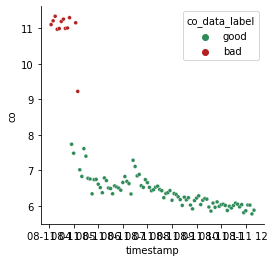

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 2


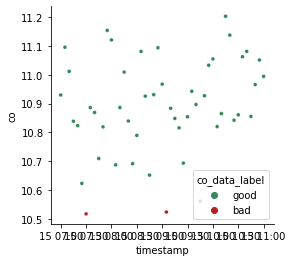

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 14


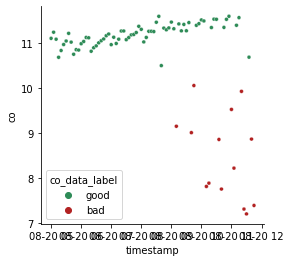

	Number of outliers for co: 1


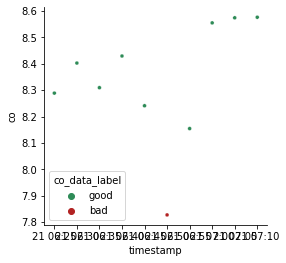

	Number of outliers for co: 1


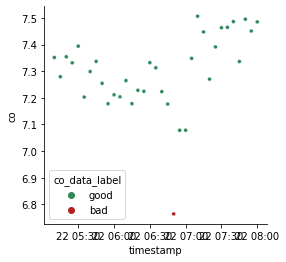

	Number of outliers for co: 7


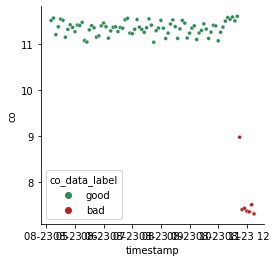

	Number of outliers for co: 0
	Number of outliers for co: 2


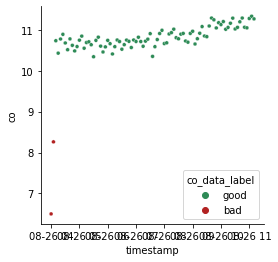

	Number of outliers for co: 2


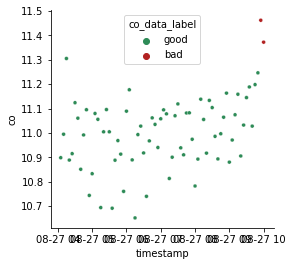

	Number of outliers for co: 4


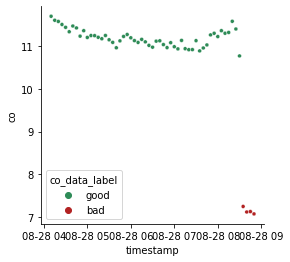

	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 1


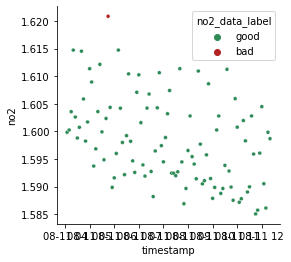

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 2


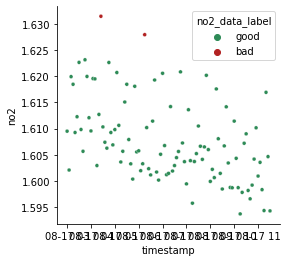

	Number of outliers for no2: 0
	Number of outliers for no2: 1


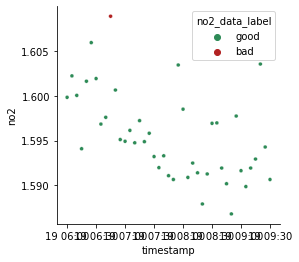

	Number of outliers for no2: 2


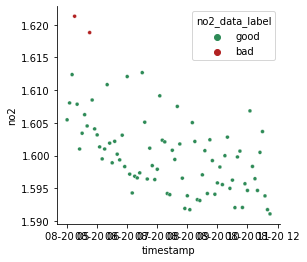

	Number of outliers for no2: 2


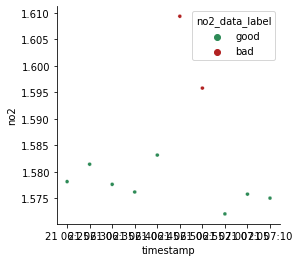

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 1


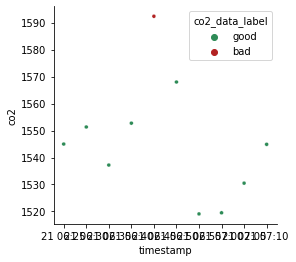

	Number of outliers for co2: 0
	Number of outliers for co2: 4


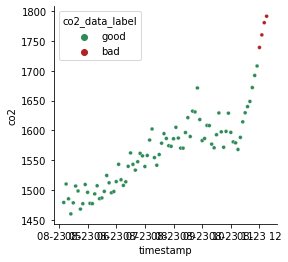

	Number of outliers for co2: 0
	Number of outliers for co2: 3


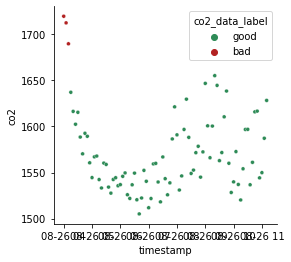

	Number of outliers for co2: 2


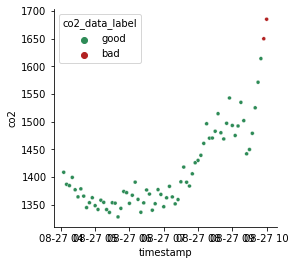

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 1


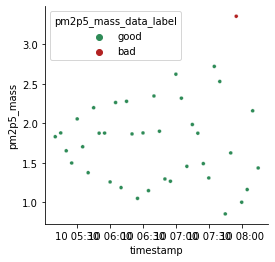

	Number of outliers for pm2p5_mass: 1


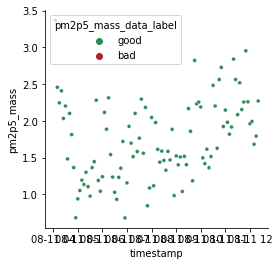

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 6


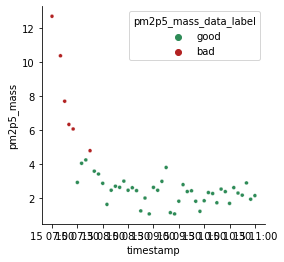

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


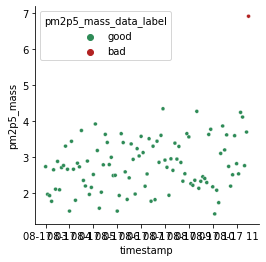

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


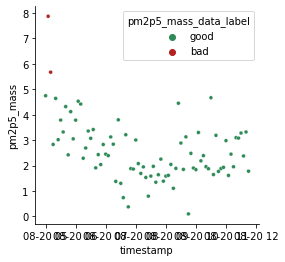

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 4


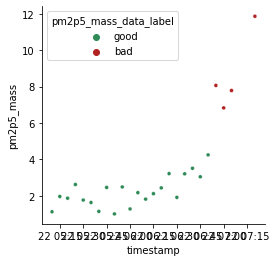

	Number of outliers for pm2p5_mass: 3


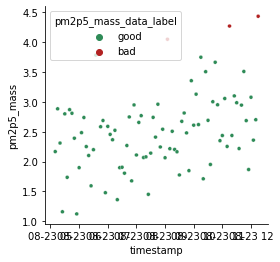

	Number of outliers for pm2p5_mass: 1


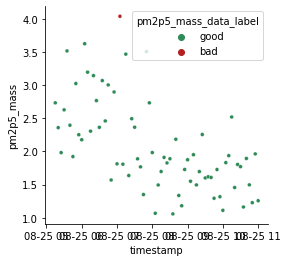

	Number of outliers for pm2p5_mass: 2


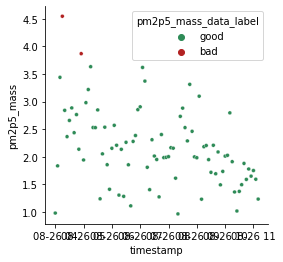

	Number of outliers for pm2p5_mass: 1


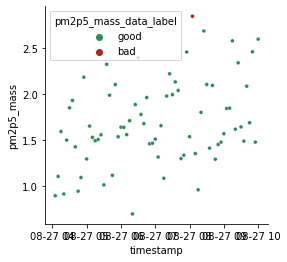

	Number of outliers for pm2p5_mass: 1


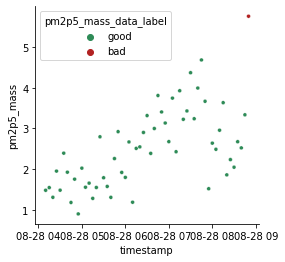

	Number of outliers for pm2p5_mass: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 39


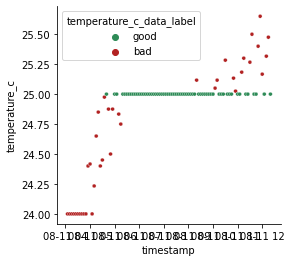

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 5


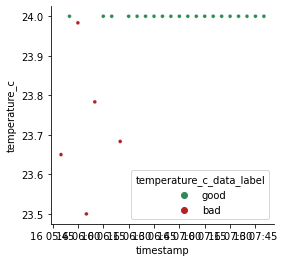

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 21


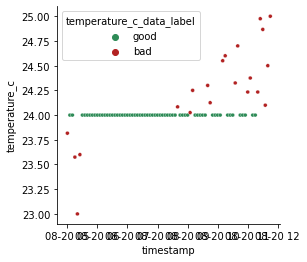

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 19


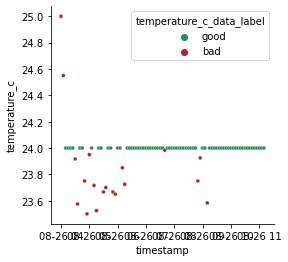

	Number of outliers for temperature_c: 12


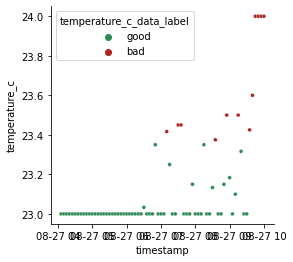

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
Beacon 6
	Number of outliers for tvoc: 9


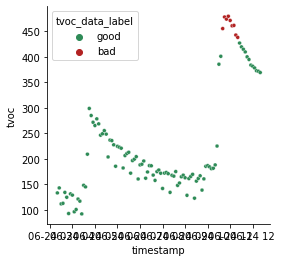

	Number of outliers for tvoc: 11


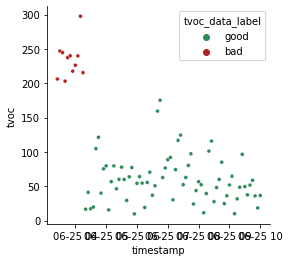

	Number of outliers for tvoc: 6


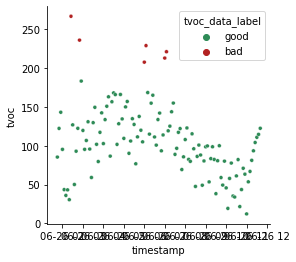

	Number of outliers for tvoc: 8


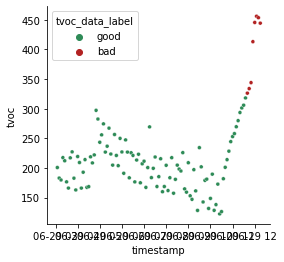

	Number of outliers for tvoc: 1


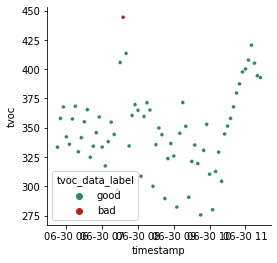

	Number of outliers for tvoc: 1


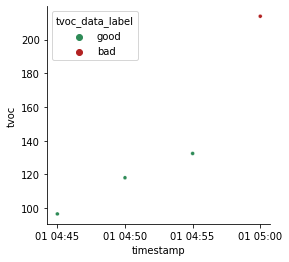

	Number of outliers for tvoc: 17


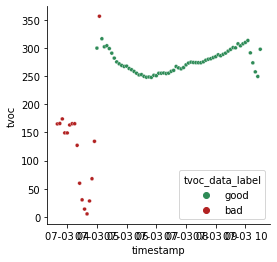

	Number of outliers for tvoc: 4


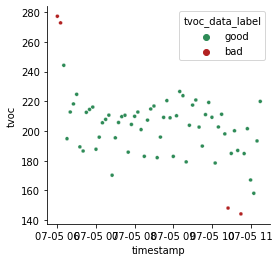

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 1


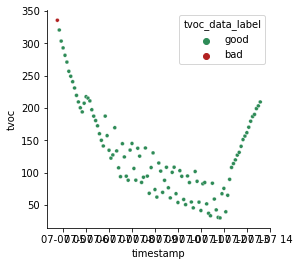

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 5


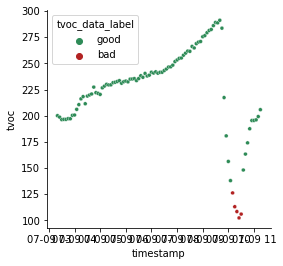

	Number of outliers for tvoc: 8


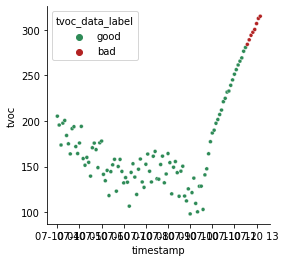

	Number of outliers for tvoc: 1


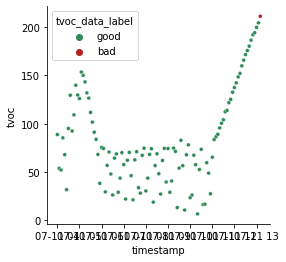

	Number of outliers for tvoc: 4


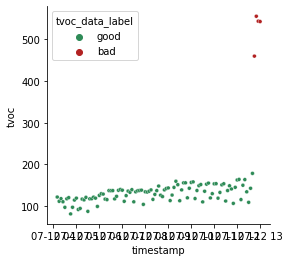

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 1


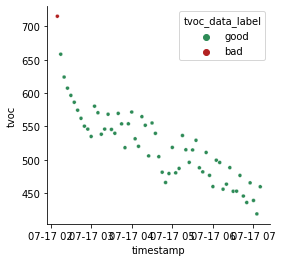

	Number of outliers for tvoc: 6


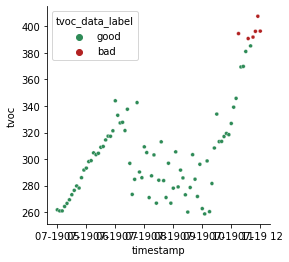

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 9


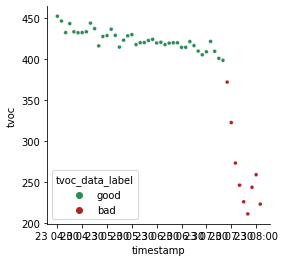

	Number of outliers for tvoc: 7


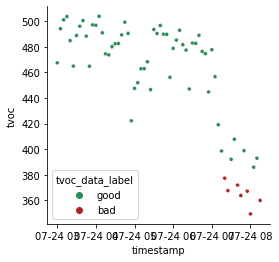

	Number of outliers for tvoc: 1


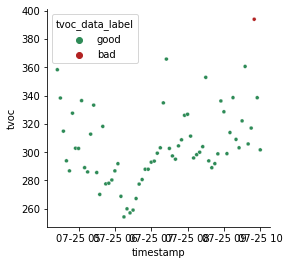

	Number of outliers for tvoc: 1


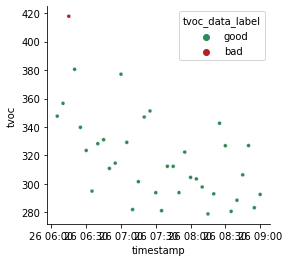

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 4


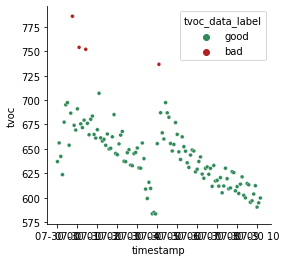

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 4


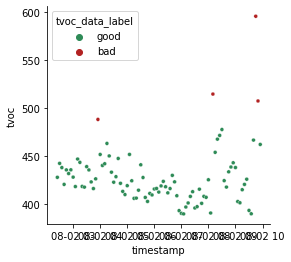

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 9


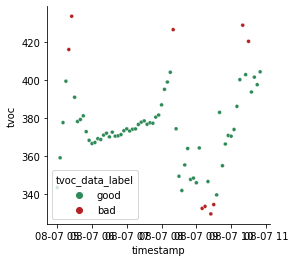

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 3


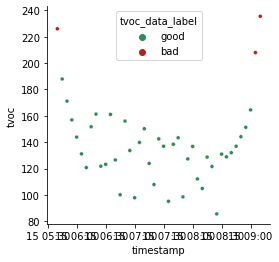

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 20


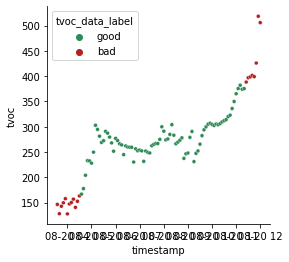

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 6


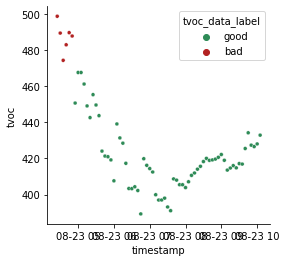

	Number of outliers for co: 12


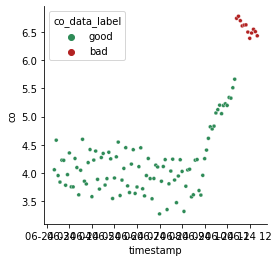

	Number of outliers for co: 1


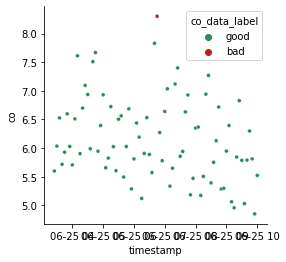

	Number of outliers for co: 3


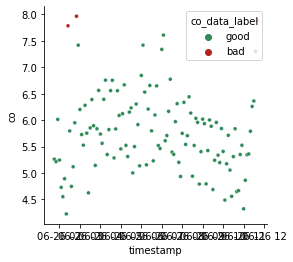

	Number of outliers for co: 19


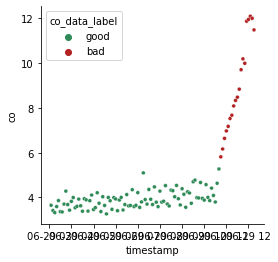

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 5


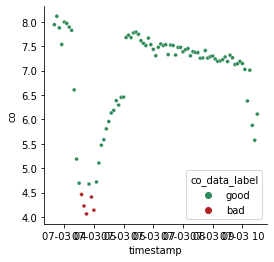

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 9


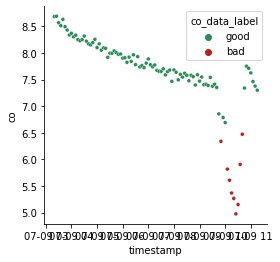

	Number of outliers for co: 21


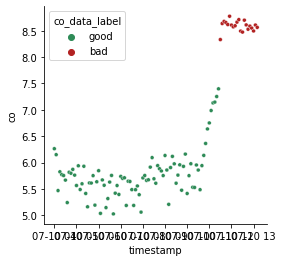

	Number of outliers for co: 21


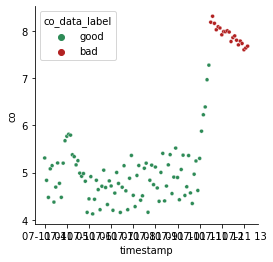

	Number of outliers for co: 0
	Number of outliers for co: 1


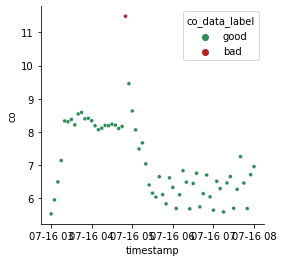

	Number of outliers for co: 3


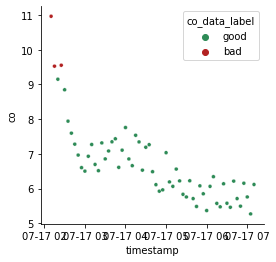

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 11


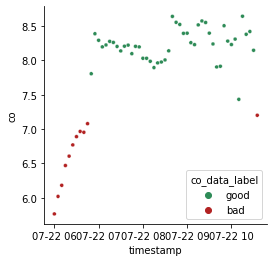

	Number of outliers for co: 9


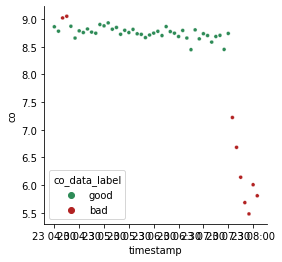

	Number of outliers for co: 6


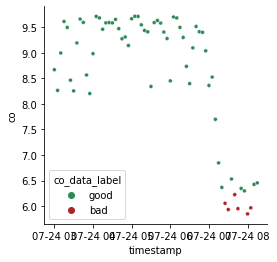

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 2


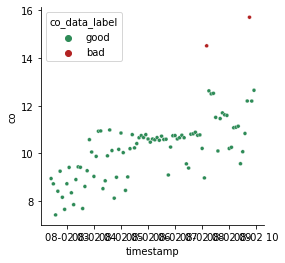

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 3


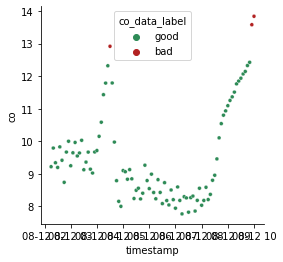

	Number of outliers for co: 4


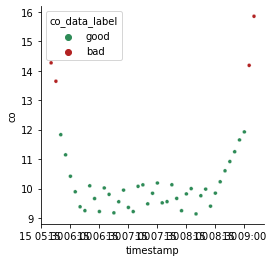

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of ou

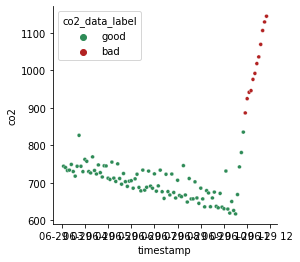

	Number of outliers for co2: 1


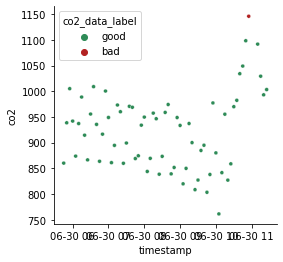

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 1


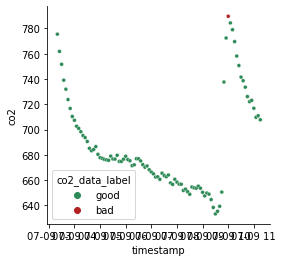

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 5


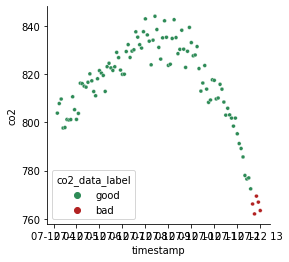

	Number of outliers for co2: 0
	Number of outliers for co2: 2


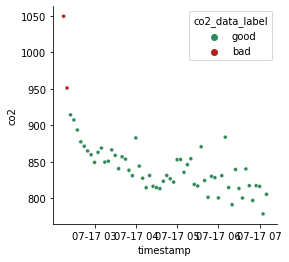

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 7


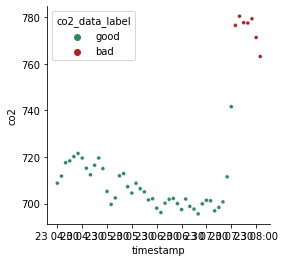

	Number of outliers for co2: 0
	Number of outliers for co2: 5


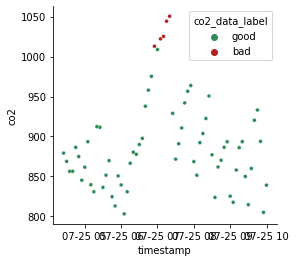

	Number of outliers for co2: 0
	Number of outliers for co2: 1


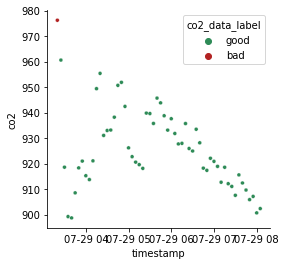

	Number of outliers for co2: 0
	Number of outliers for co2: 8


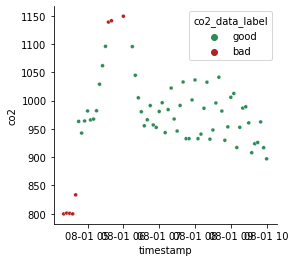

	Number of outliers for co2: 0
	Number of outliers for co2: 6


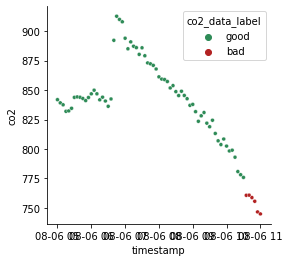

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 4


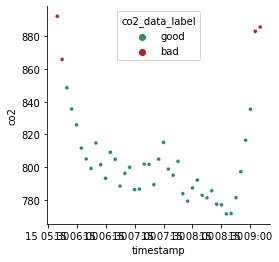

	Number of outliers for co2: 0
	Number of outliers for co2: 2


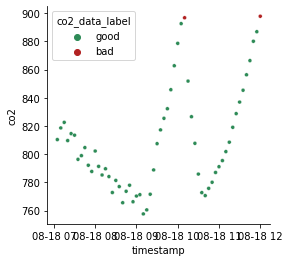

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 1


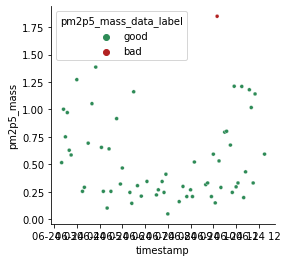

	Number of outliers for pm2p5_mass: 3


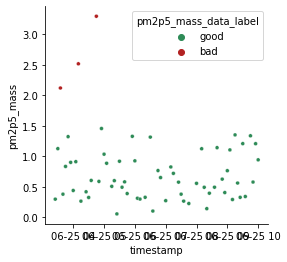

	Number of outliers for pm2p5_mass: 2


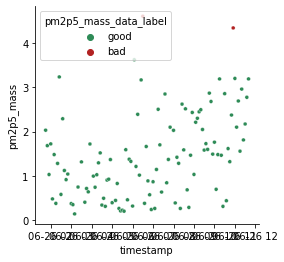

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


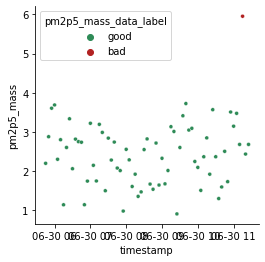

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


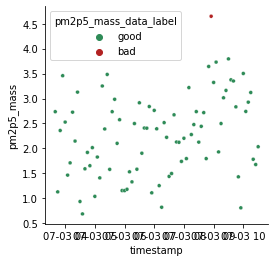

	Number of outliers for pm2p5_mass: 3


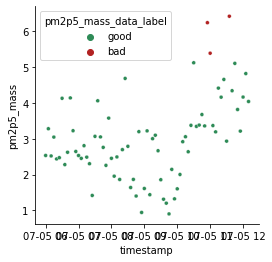

	Number of outliers for pm2p5_mass: 1


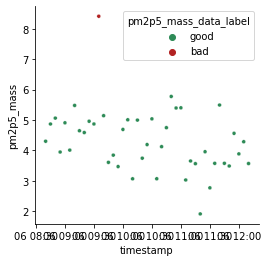

	Number of outliers for pm2p5_mass: 9


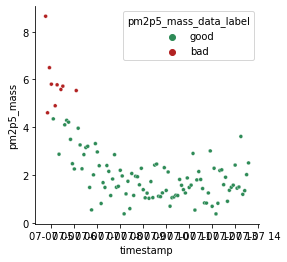

	Number of outliers for pm2p5_mass: 2


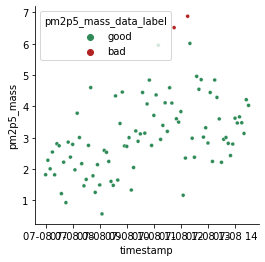

	Number of outliers for pm2p5_mass: 2


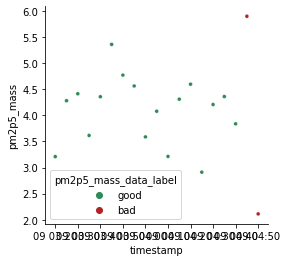

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 3


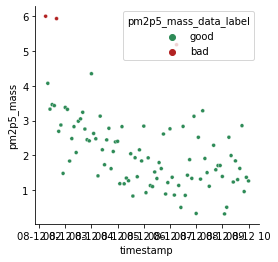

	Number of outliers for pm2p5_mass: 3


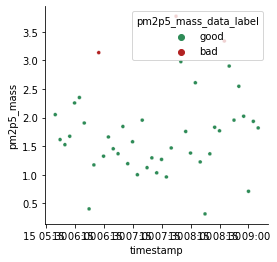

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


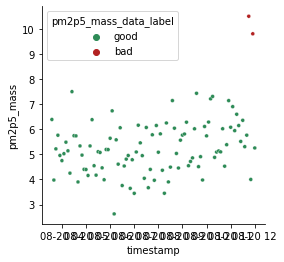

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


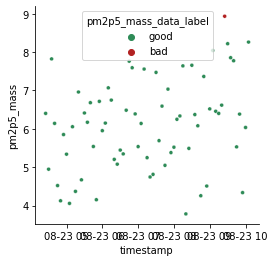

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outli

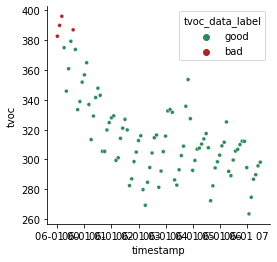

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 1


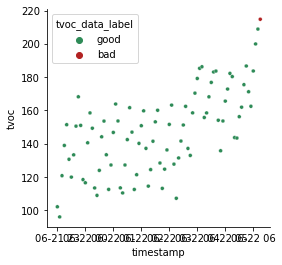

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 2


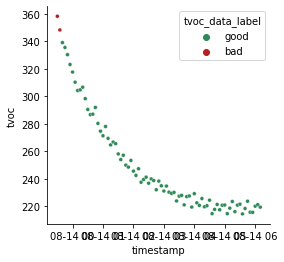

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 3


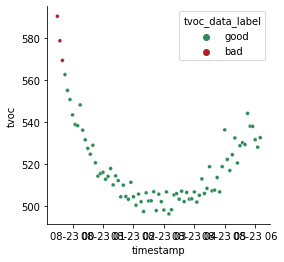

	Number of outliers for tvoc: 4


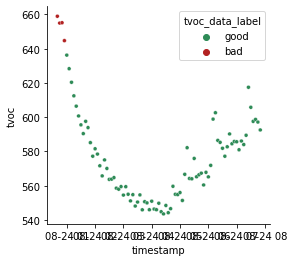

	Number of outliers for tvoc: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 3


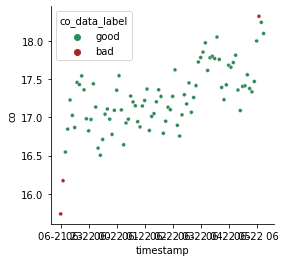

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 1


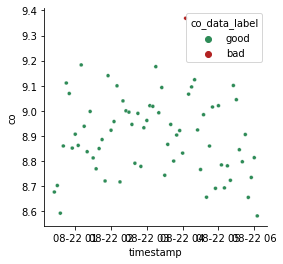

	Number of outliers for co: 1


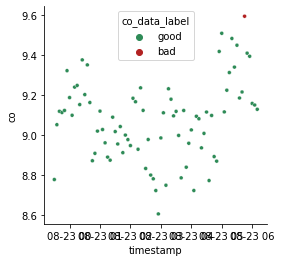

	Number of outliers for co: 1


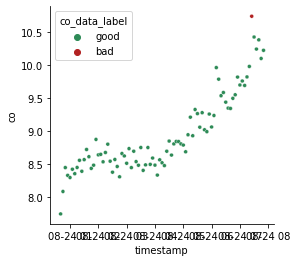

	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 1


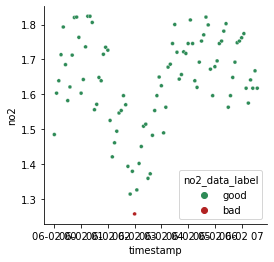

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 1


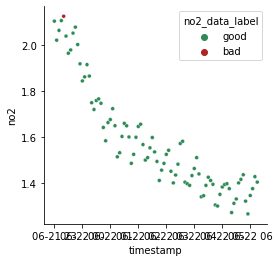

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 1


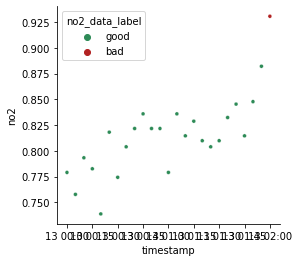

	Number of outliers for no2: 5


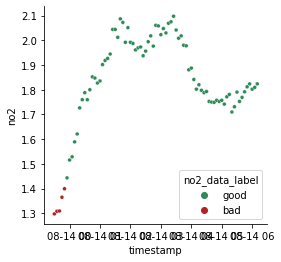

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 2


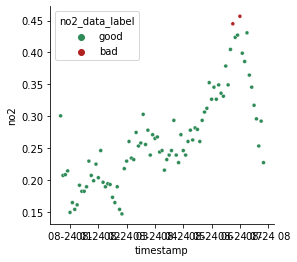

	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 4


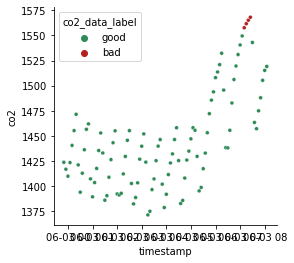

	Number of outliers for co2: 2


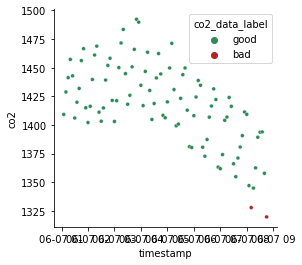

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 3


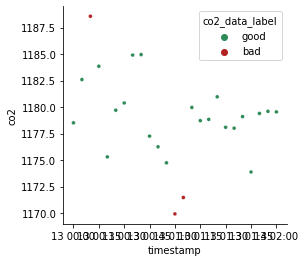

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 1


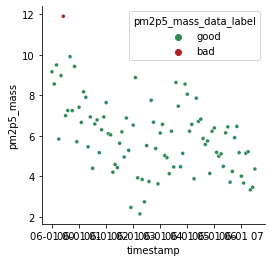

	Number of outliers for pm2p5_mass: 1


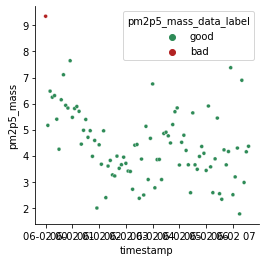

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


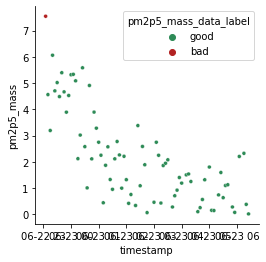

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 8


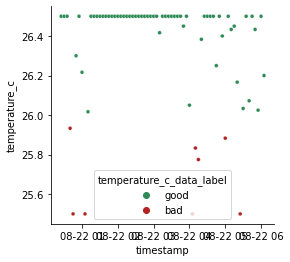

	Number of outliers for temperature_c: 14


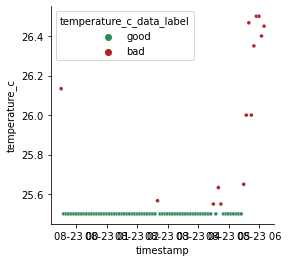

	Number of outliers for temperature_c: 17


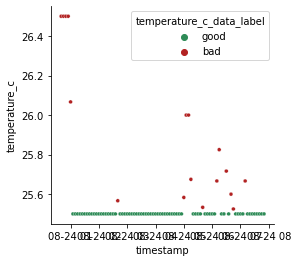

	Number of outliers for temperature_c: 21


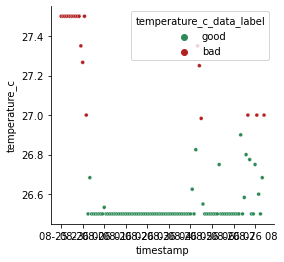

Beacon 19
	Number of outliers for tvoc: 7


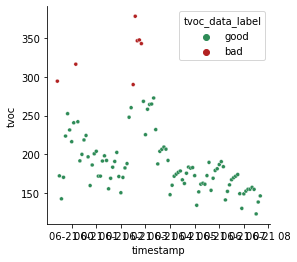

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 2


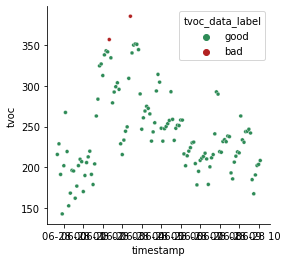

	Number of outliers for tvoc: 5


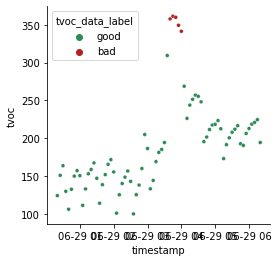

	Number of outliers for tvoc: 1


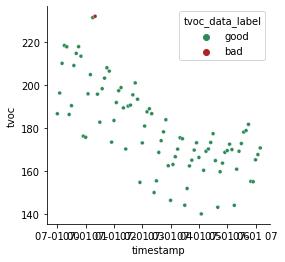

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 2


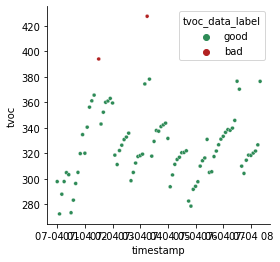

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 6


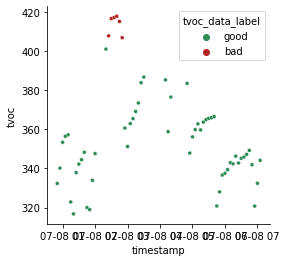

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 2


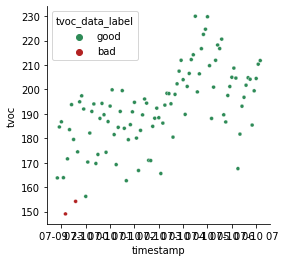

	Number of outliers for tvoc: 2


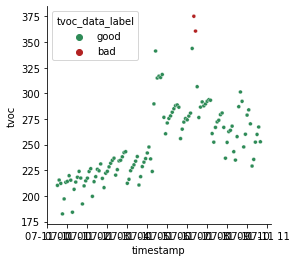

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 2


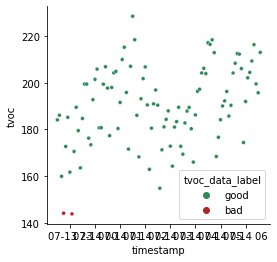

	Number of outliers for tvoc: 5


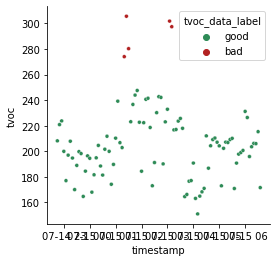

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 1


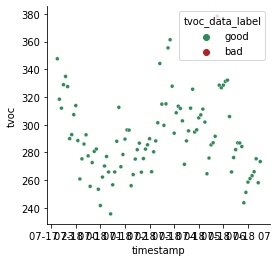

	Number of outliers for tvoc: 4


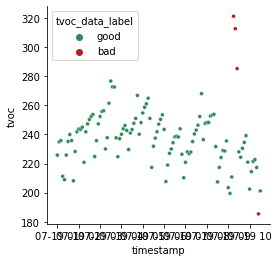

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 1


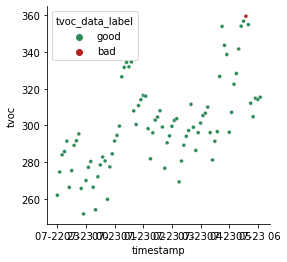

	Number of outliers for tvoc: 1


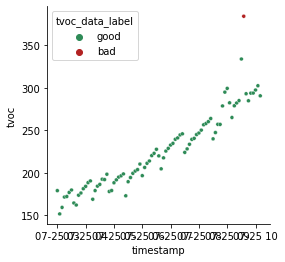

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 3


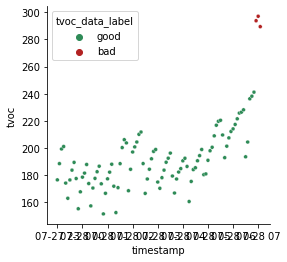

	Number of outliers for tvoc: 3


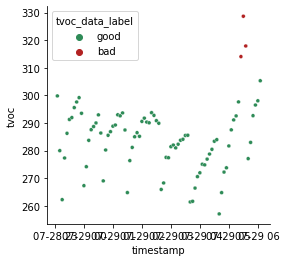

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 3


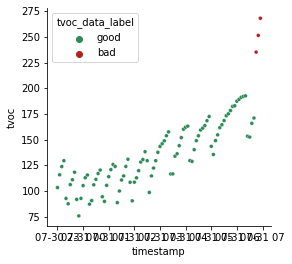

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 1


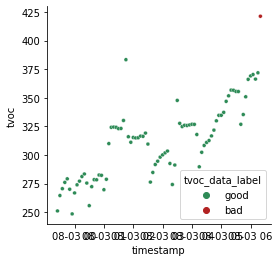

	Number of outliers for tvoc: 4


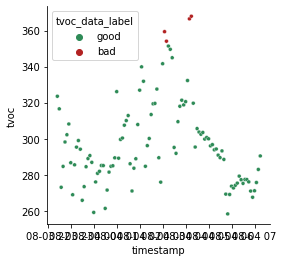

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 7


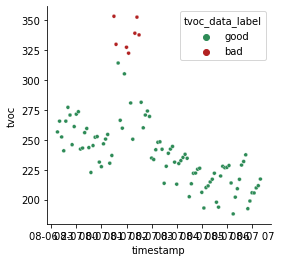

	Number of outliers for tvoc: 1


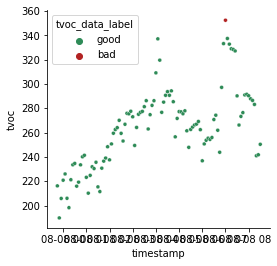

	Number of outliers for tvoc: 3


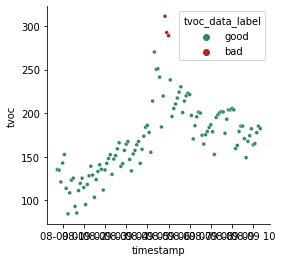

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 2


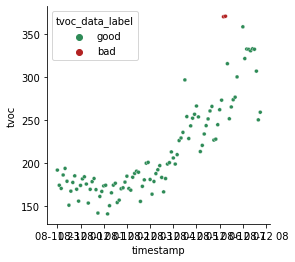

	Number of outliers for tvoc: 5


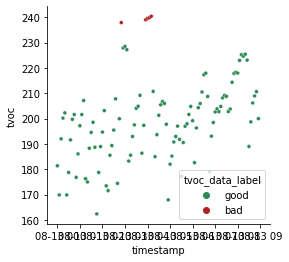

	Number of outliers for tvoc: 5


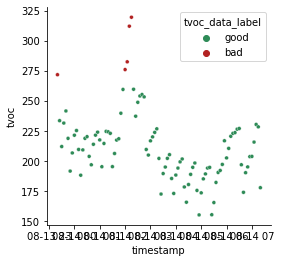

	Number of outliers for tvoc: 1


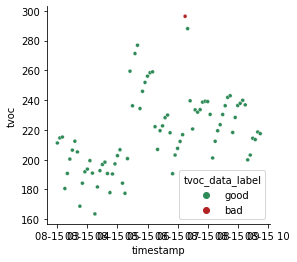

	Number of outliers for tvoc: 10


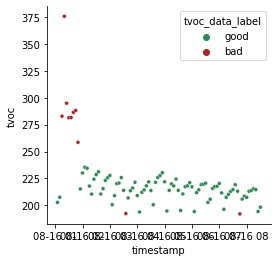

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for co: 0
	Number of outliers for co: 1


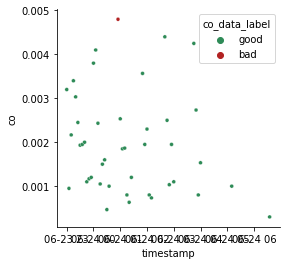

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 1


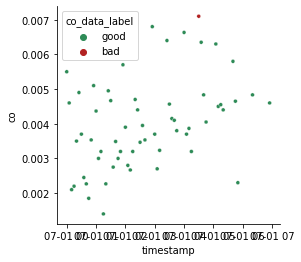

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 2


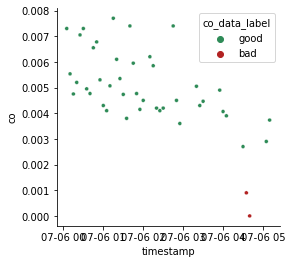

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 2


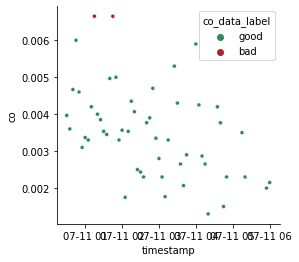

	Number of outliers for co: 3


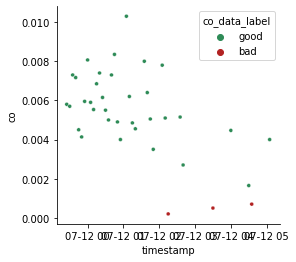

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 1


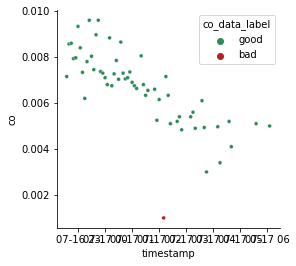

	Number of outliers for co: 1


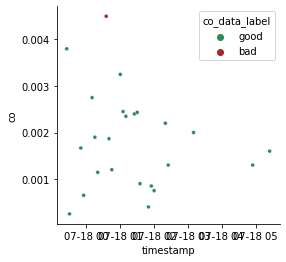

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 5


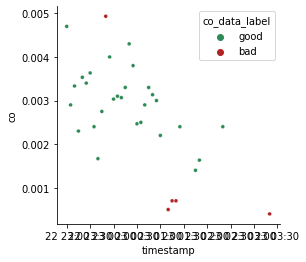

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 1


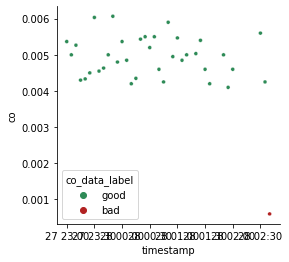

	Number of outliers for co: 1


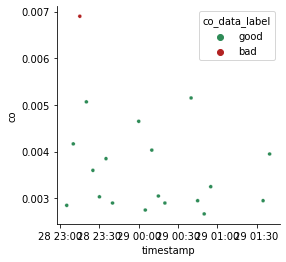

	Number of outliers for co: 1


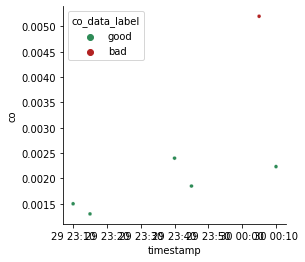

	Number of outliers for co: 0
	Number of outliers for co: 3


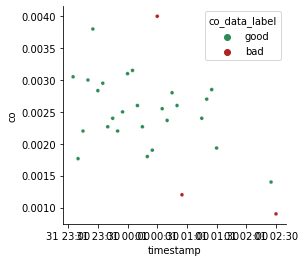

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 2


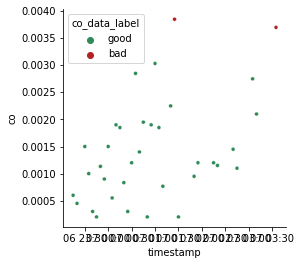

	Number of outliers for co: 1


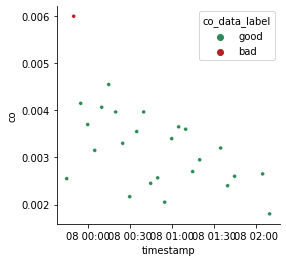

	Number of outliers for co: 3


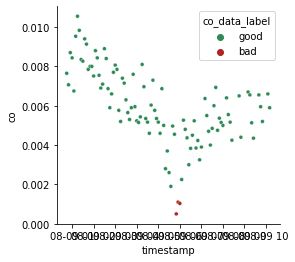

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 1


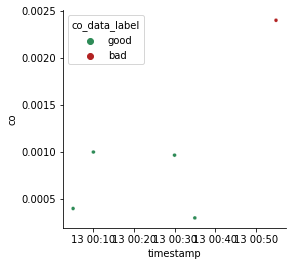

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 2


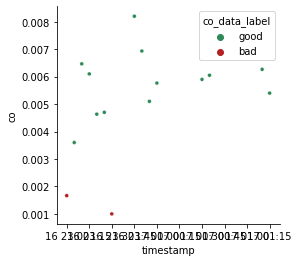

	Number of outliers for co: 0
	Number of outliers for no2: 2


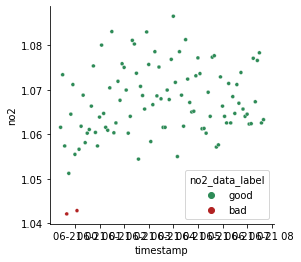

	Number of outliers for no2: 1


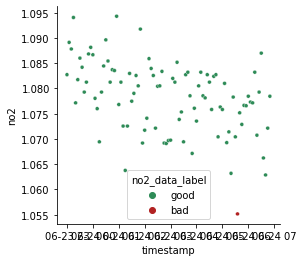

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 1


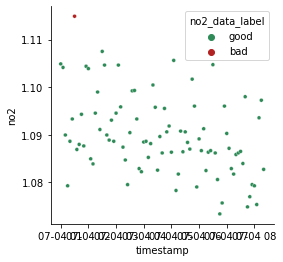

	Number of outliers for no2: 1


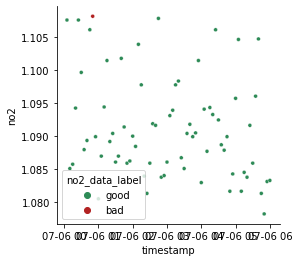

	Number of outliers for no2: 3


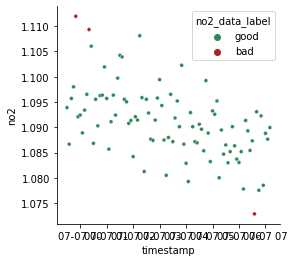

	Number of outliers for no2: 2


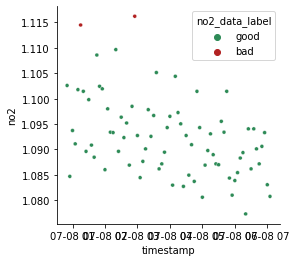

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 2


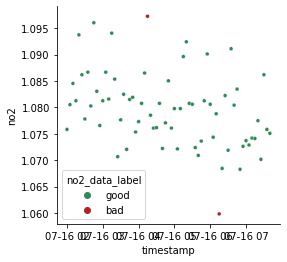

	Number of outliers for no2: 0
	Number of outliers for no2: 2


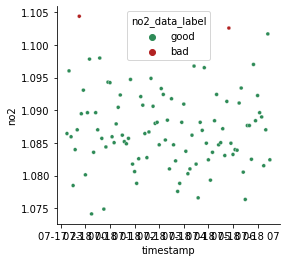

	Number of outliers for no2: 1


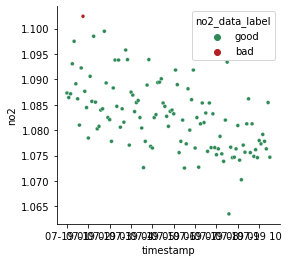

	Number of outliers for no2: 1


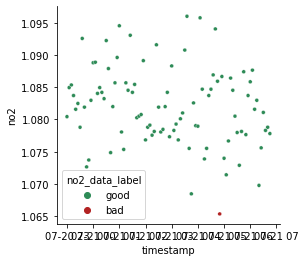

	Number of outliers for no2: 7


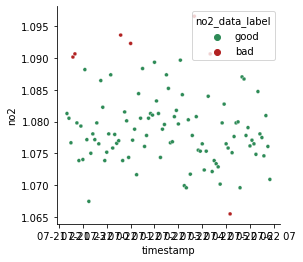

	Number of outliers for no2: 0
	Number of outliers for no2: 1


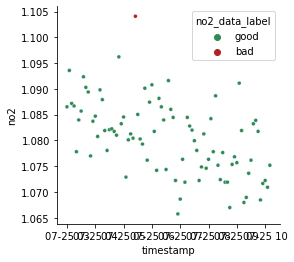

	Number of outliers for no2: 2


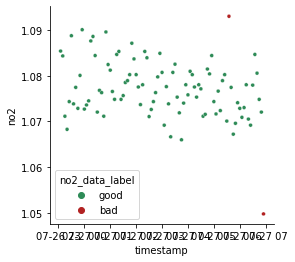

	Number of outliers for no2: 0
	Number of outliers for no2: 1


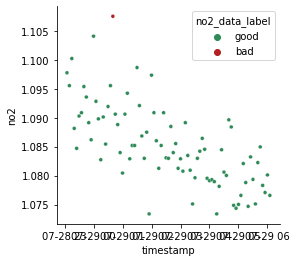

	Number of outliers for no2: 0
	Number of outliers for no2: 1


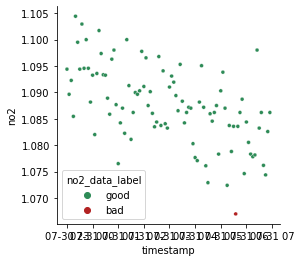

	Number of outliers for no2: 1


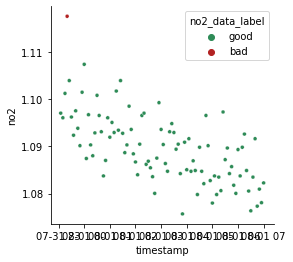

	Number of outliers for no2: 7


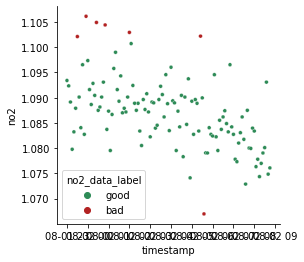

	Number of outliers for no2: 2


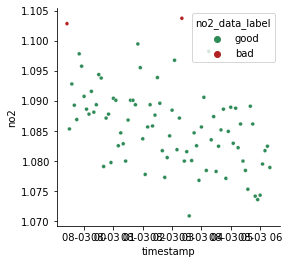

	Number of outliers for no2: 11


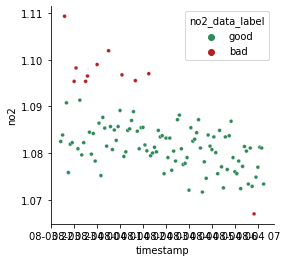

	Number of outliers for no2: 3


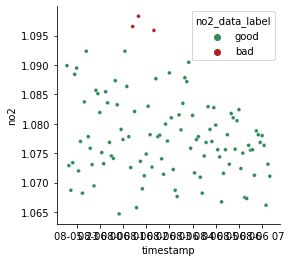

	Number of outliers for no2: 0
	Number of outliers for no2: 2


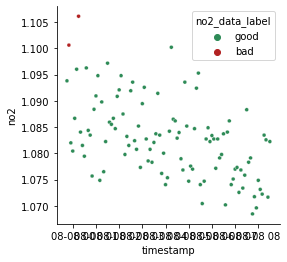

	Number of outliers for no2: 2


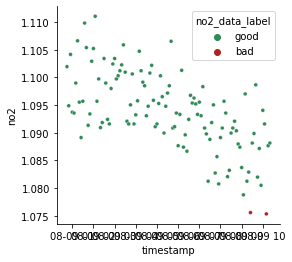

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 3


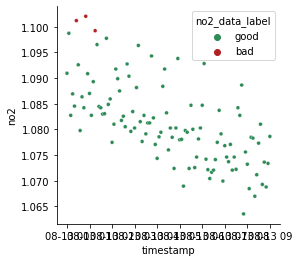

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 2


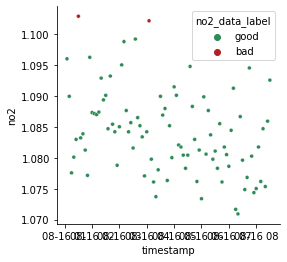

	Number of outliers for no2: 0
	Number of outliers for no2: 2


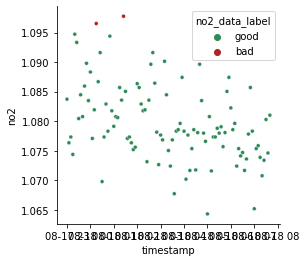

	Number of outliers for co2: 1


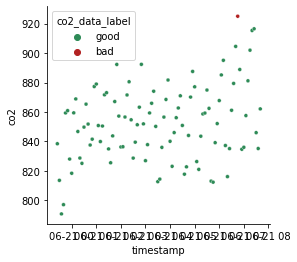

	Number of outliers for co2: 0
	Number of outliers for co2: 2


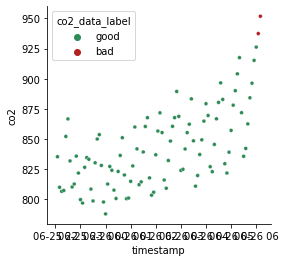

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 3


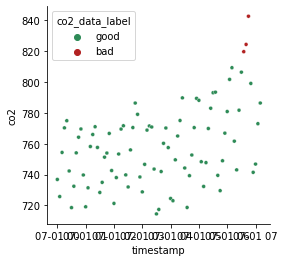

	Number of outliers for co2: 0
	Number of outliers for co2: 3


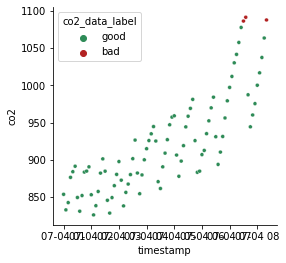

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 2


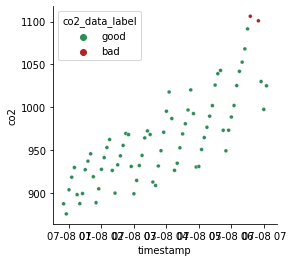

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 1


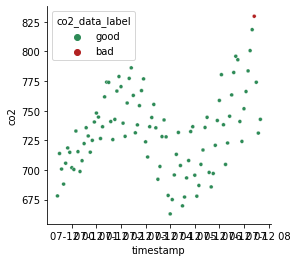

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 1


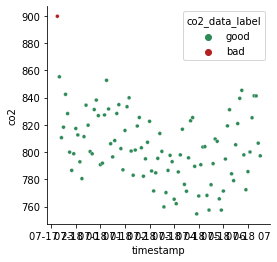

	Number of outliers for co2: 1


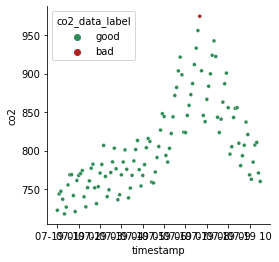

	Number of outliers for co2: 3


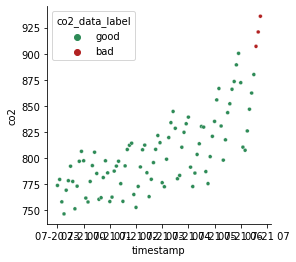

	Number of outliers for co2: 0
	Number of outliers for co2: 1


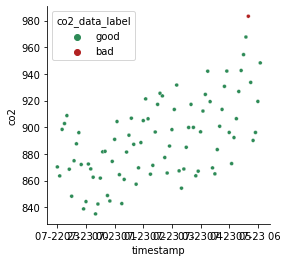

	Number of outliers for co2: 0
	Number of outliers for co2: 4


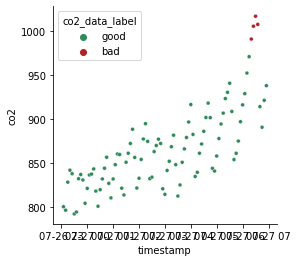

	Number of outliers for co2: 0
	Number of outliers for co2: 2


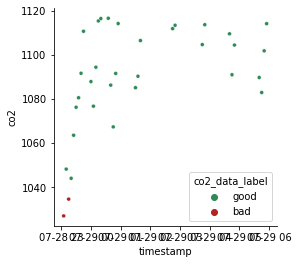

	Number of outliers for co2: 3


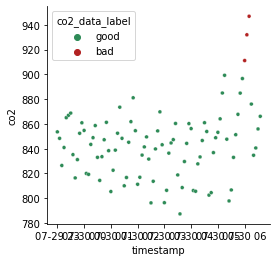

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 6


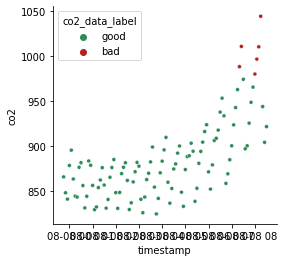

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 2


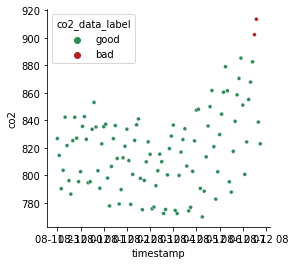

	Number of outliers for co2: 1


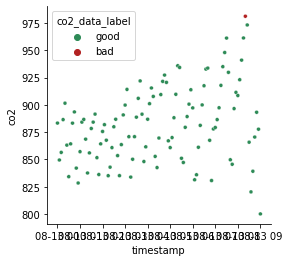

	Number of outliers for co2: 1


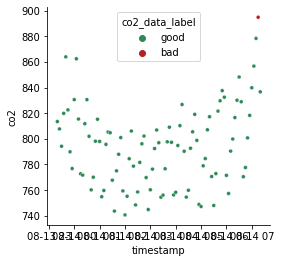

	Number of outliers for co2: 1


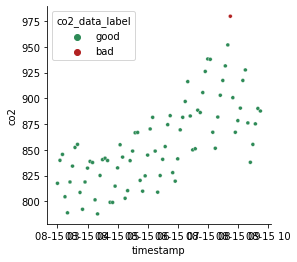

	Number of outliers for co2: 2


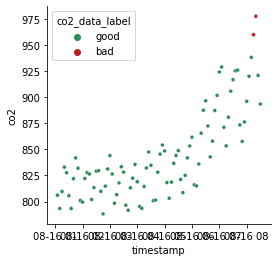

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 4


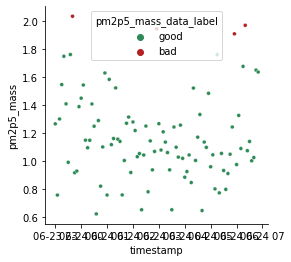

	Number of outliers for pm2p5_mass: 1


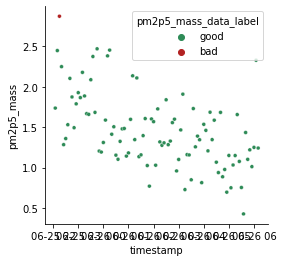

	Number of outliers for pm2p5_mass: 4


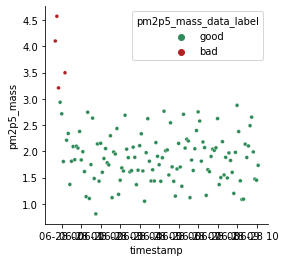

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


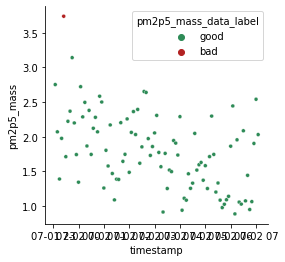

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


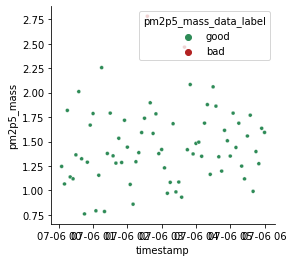

	Number of outliers for pm2p5_mass: 1


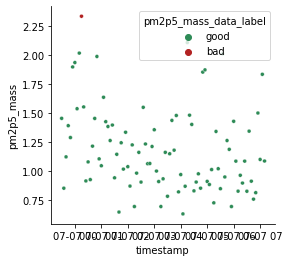

	Number of outliers for pm2p5_mass: 1


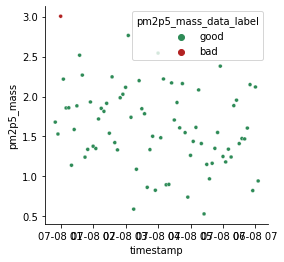

	Number of outliers for pm2p5_mass: 1


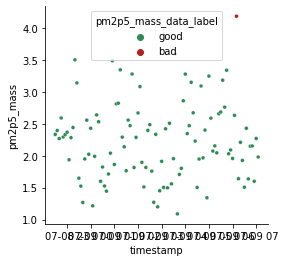

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


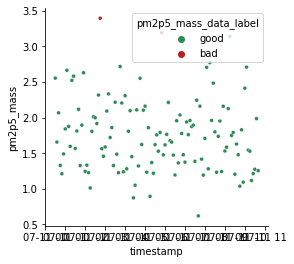

	Number of outliers for pm2p5_mass: 11


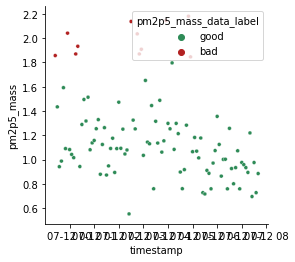

	Number of outliers for pm2p5_mass: 3


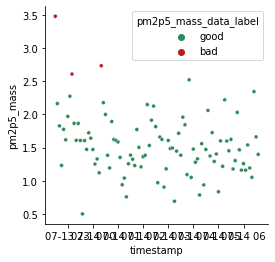

	Number of outliers for pm2p5_mass: 2


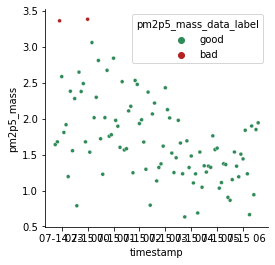

	Number of outliers for pm2p5_mass: 1


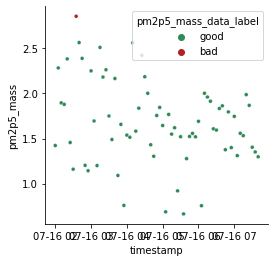

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


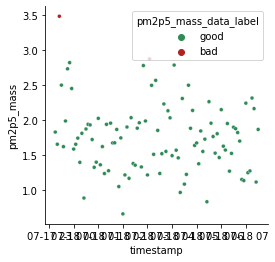

	Number of outliers for pm2p5_mass: 4


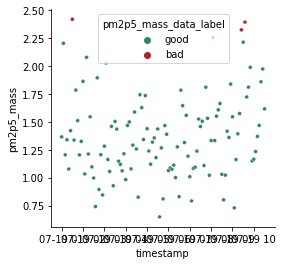

	Number of outliers for pm2p5_mass: 1


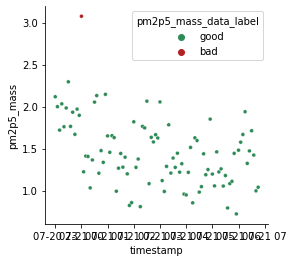

	Number of outliers for pm2p5_mass: 7


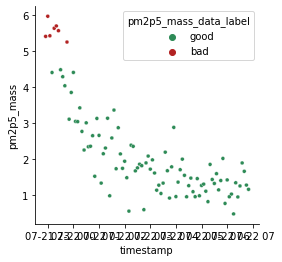

	Number of outliers for pm2p5_mass: 6


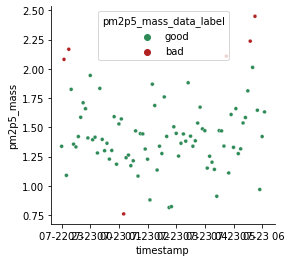

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 4


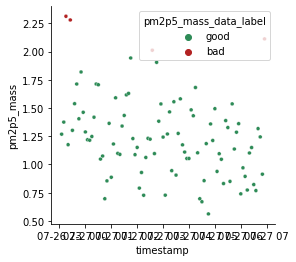

	Number of outliers for pm2p5_mass: 3


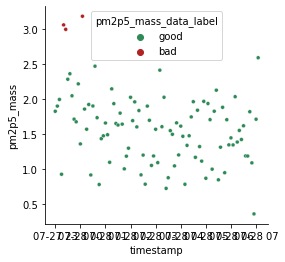

	Number of outliers for pm2p5_mass: 10


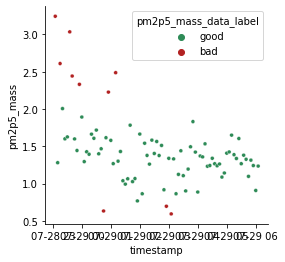

	Number of outliers for pm2p5_mass: 1


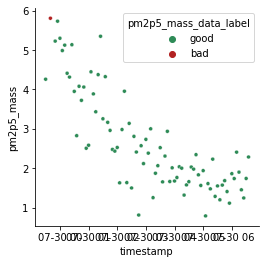

	Number of outliers for pm2p5_mass: 4


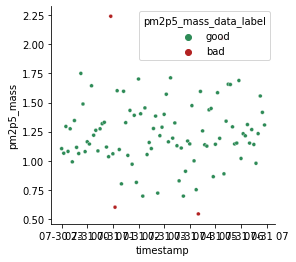

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 5


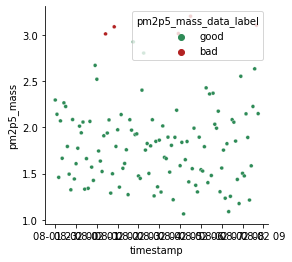

	Number of outliers for pm2p5_mass: 2


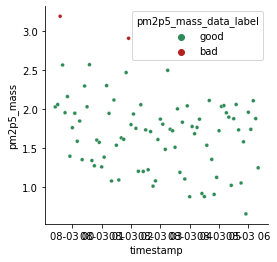

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


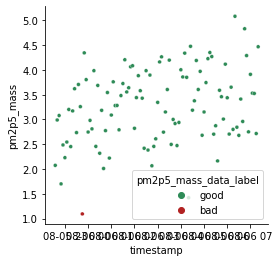

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


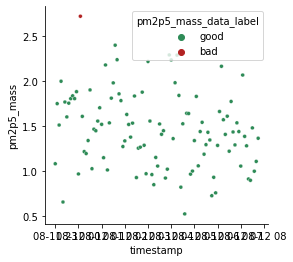

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


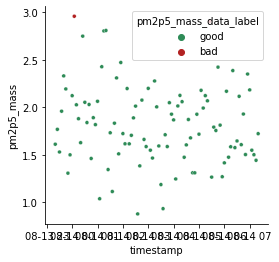

	Number of outliers for pm2p5_mass: 2


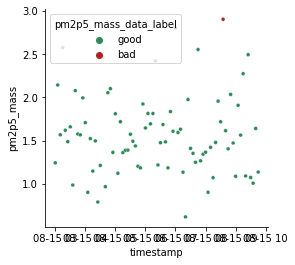

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 30


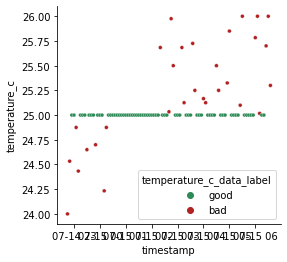

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 12


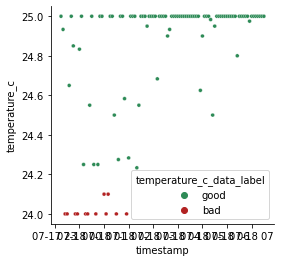

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 27


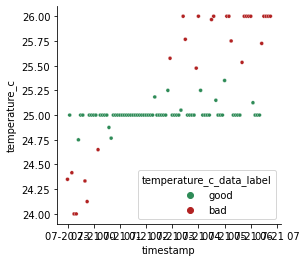

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 31


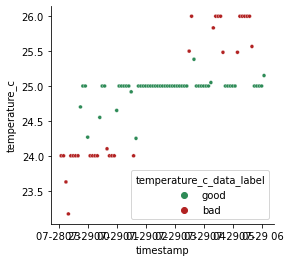

	Number of outliers for temperature_c: 23


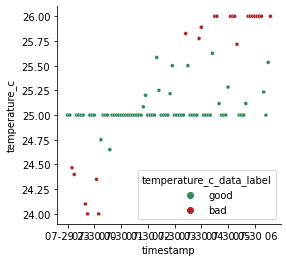

	Number of outliers for temperature_c: 31


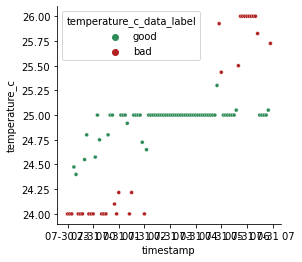

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 5


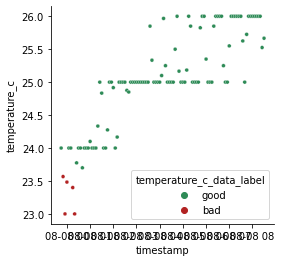

	Number of outliers for temperature_c: 41


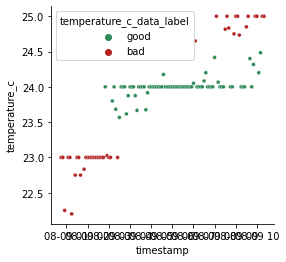

	Number of outliers for temperature_c: 30


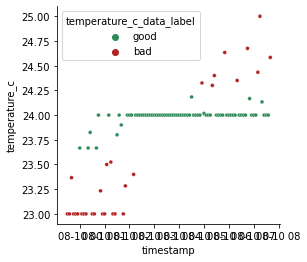

	Number of outliers for temperature_c: 27


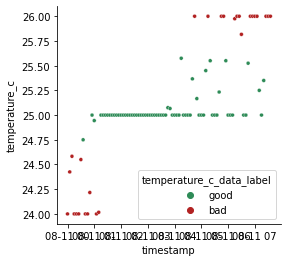

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
Beacon 29
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 12


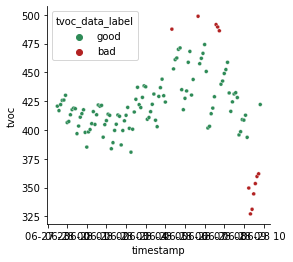

	Number of outliers for tvoc: 2


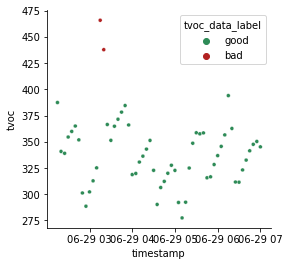

	Number of outliers for tvoc: 3


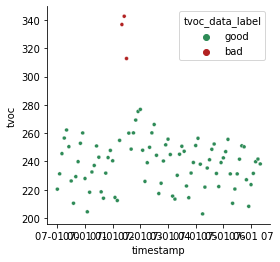

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 1


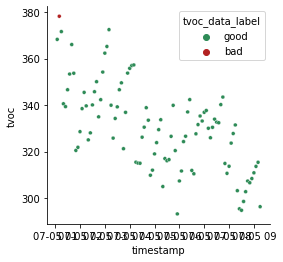

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 5


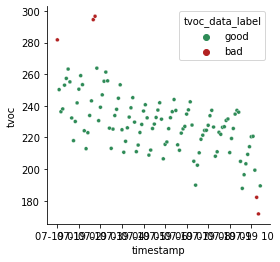

	Number of outliers for tvoc: 1


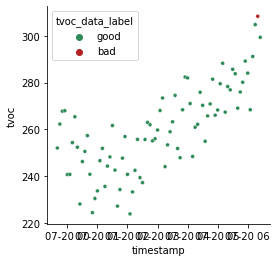

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 2


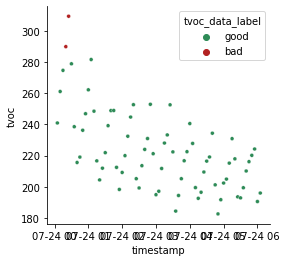

	Number of outliers for tvoc: 6


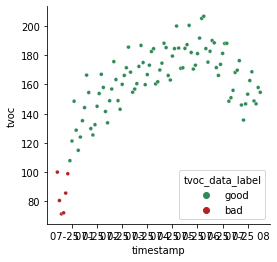

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 7


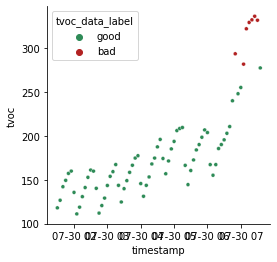

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 13


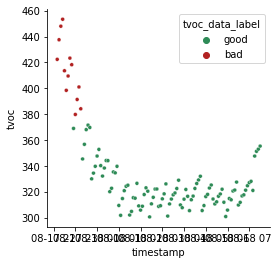

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for co: 3


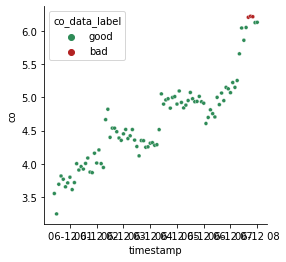

	Number of outliers for co: 9


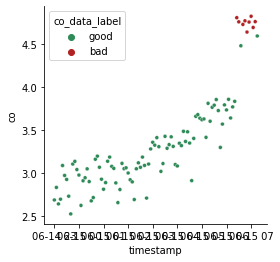

	Number of outliers for co: 1


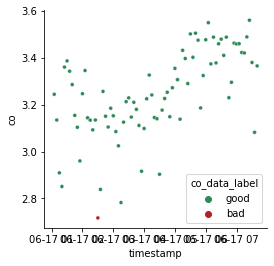

	Number of outliers for co: 3


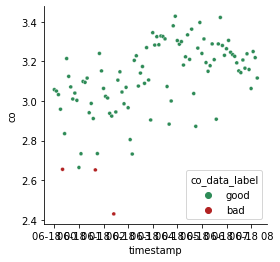

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 3


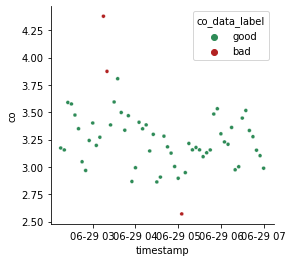

	Number of outliers for co: 1


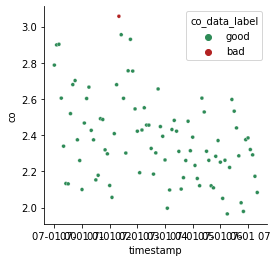

	Number of outliers for co: 0
	Number of outliers for co: 1


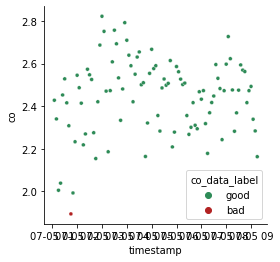

	Number of outliers for co: 2


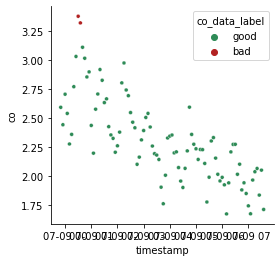

	Number of outliers for co: 0
	Number of outliers for co: 1


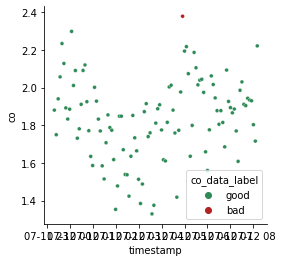

	Number of outliers for co: 2


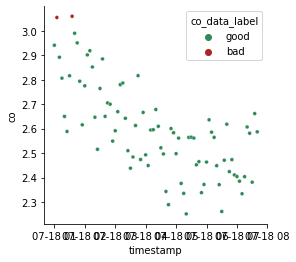

	Number of outliers for co: 2


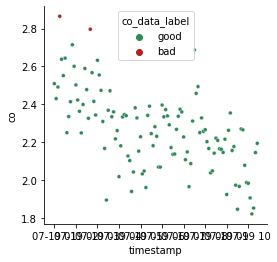

	Number of outliers for co: 1


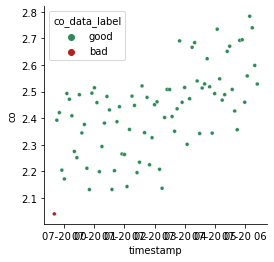

	Number of outliers for co: 0
	Number of outliers for co: 1


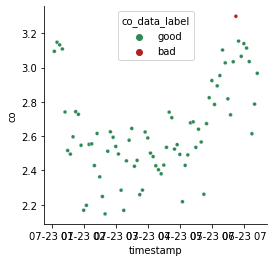

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 1


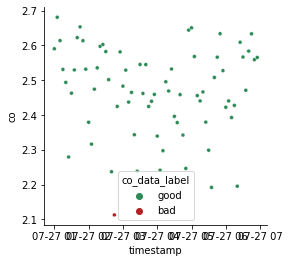

	Number of outliers for co: 4


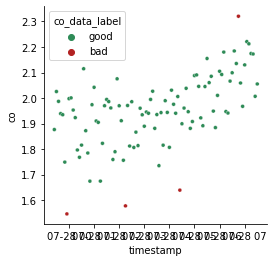

	Number of outliers for co: 2


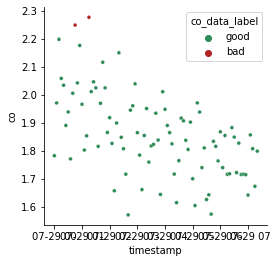

	Number of outliers for co: 5


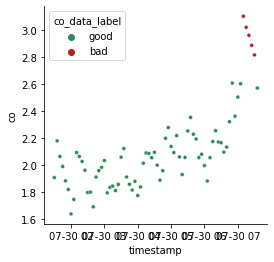

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 1


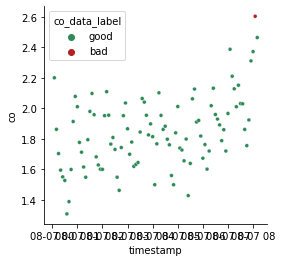

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 1


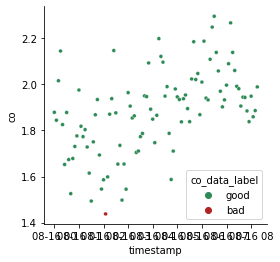

	Number of outliers for co: 4


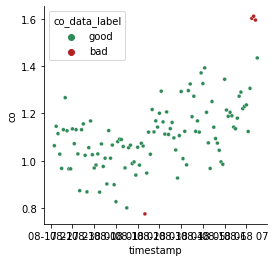

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of

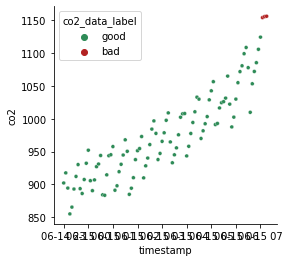

	Number of outliers for co2: 0
	Number of outliers for co2: 3


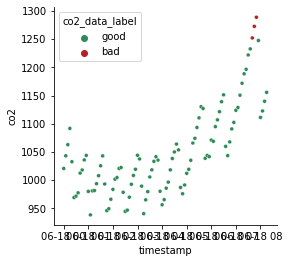

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 2


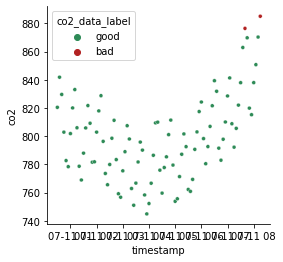

	Number of outliers for co2: 1


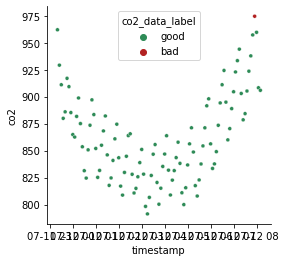

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 1


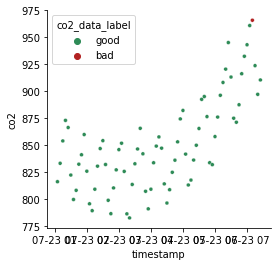

	Number of outliers for co2: 0
	Number of outliers for co2: 5


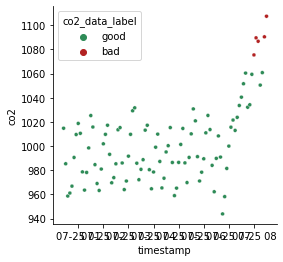

	Number of outliers for co2: 0
	Number of outliers for co2: 1


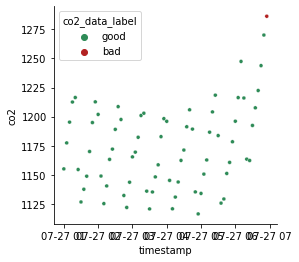

	Number of outliers for co2: 5


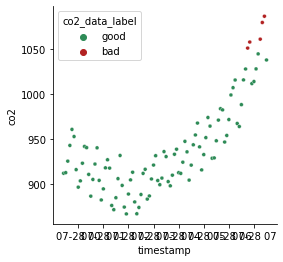

	Number of outliers for co2: 0
	Number of outliers for co2: 3


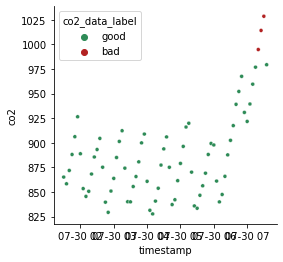

	Number of outliers for co2: 0
	Number of outliers for co2: 1


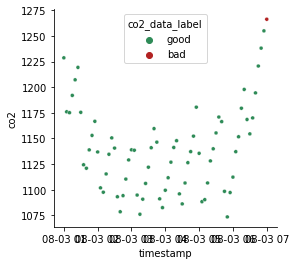

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 4


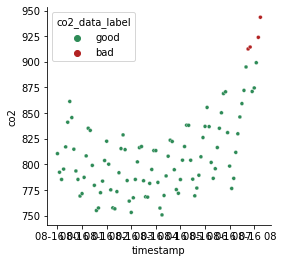

	Number of outliers for co2: 5


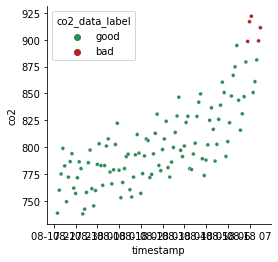

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 1


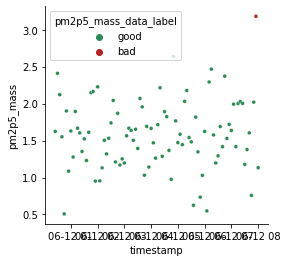

	Number of outliers for pm2p5_mass: 5


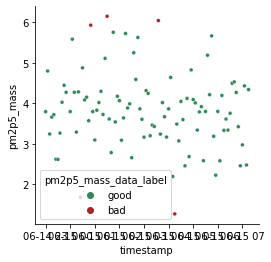

	Number of outliers for pm2p5_mass: 1


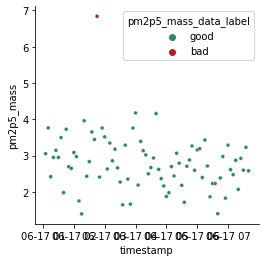

	Number of outliers for pm2p5_mass: 1


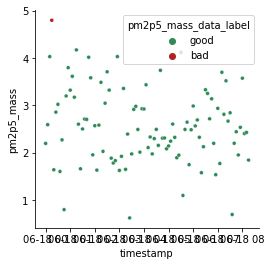

	Number of outliers for pm2p5_mass: 2


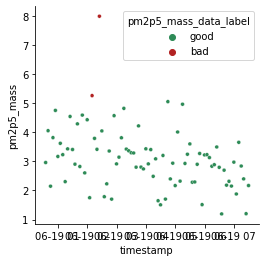

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


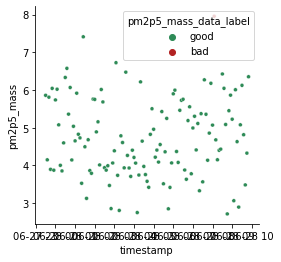

	Number of outliers for pm2p5_mass: 1


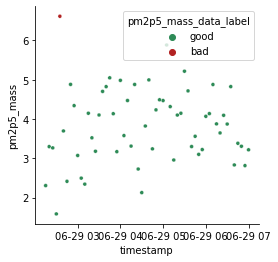

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 5


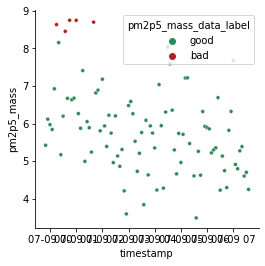

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


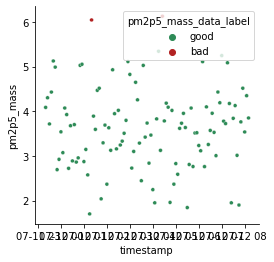

	Number of outliers for pm2p5_mass: 1


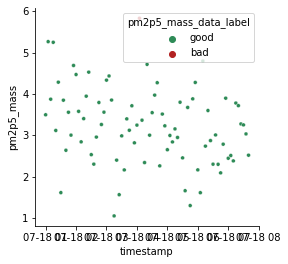

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


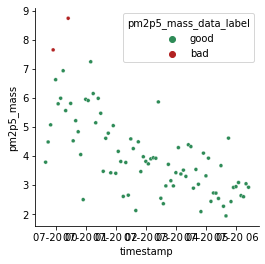

	Number of outliers for pm2p5_mass: 3


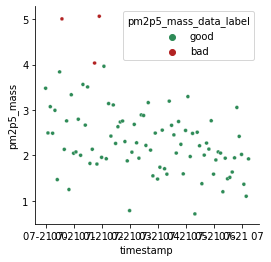

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


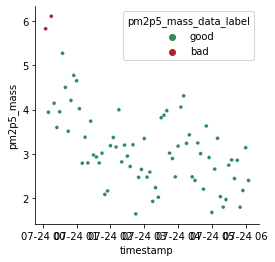

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


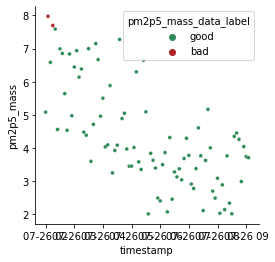

	Number of outliers for pm2p5_mass: 2


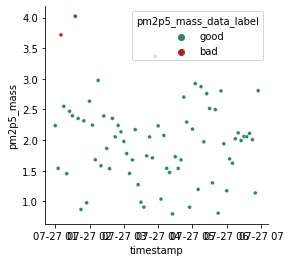

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


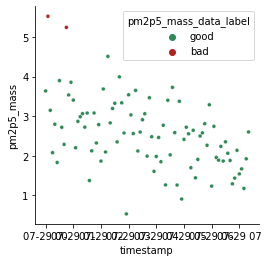

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


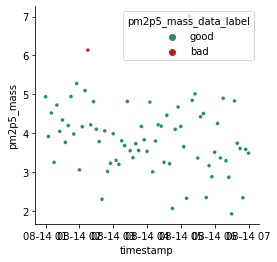

	Number of outliers for pm2p5_mass: 1


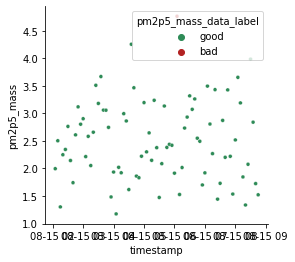

	Number of outliers for pm2p5_mass: 2


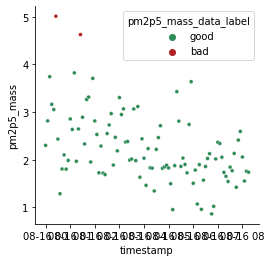

	Number of outliers for pm2p5_mass: 7


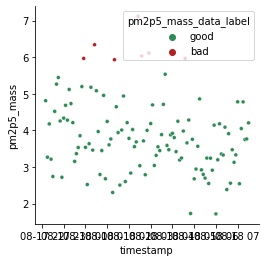

	Number of outliers for pm2p5_mass: 2


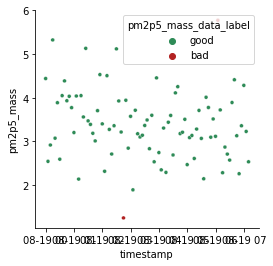

	Number of outliers for pm2p5_mass: 4


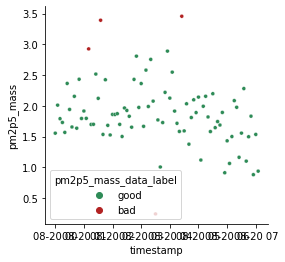

	Number of outliers for temperature_c: 11


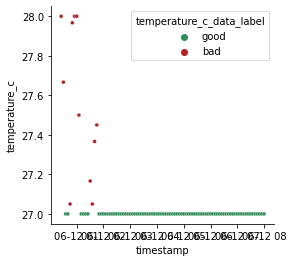

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 3


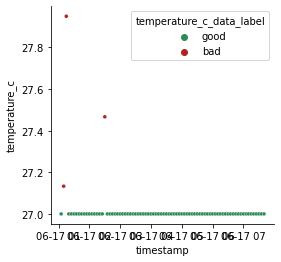

	Number of outliers for temperature_c: 7


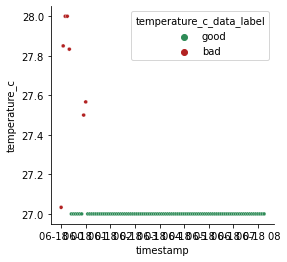

	Number of outliers for temperature_c: 9


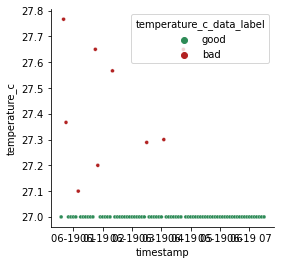

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 26


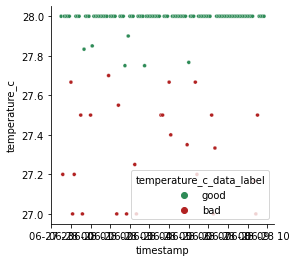

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 22


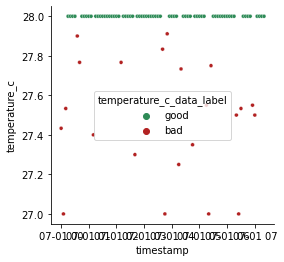

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 5


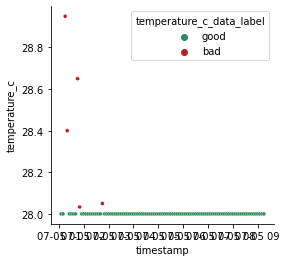

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 6


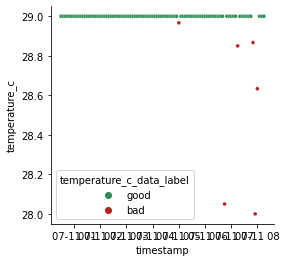

	Number of outliers for temperature_c: 8


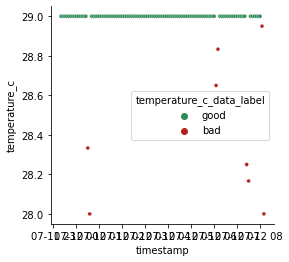

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 3


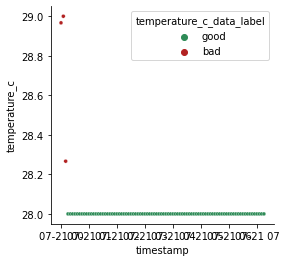

	Number of outliers for temperature_c: 4


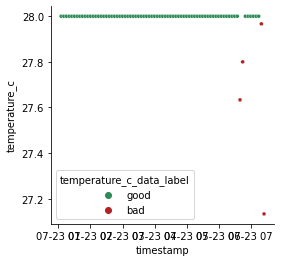

	Number of outliers for temperature_c: 3


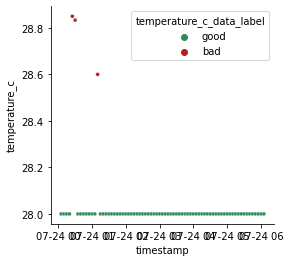

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 8


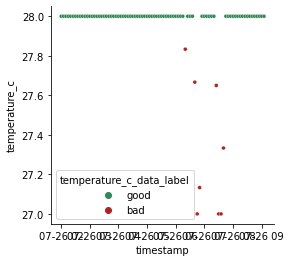

	Number of outliers for temperature_c: 8


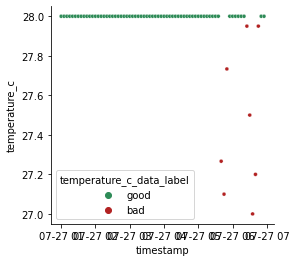

	Number of outliers for temperature_c: 16


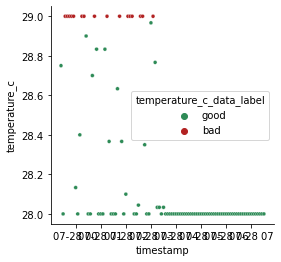

	Number of outliers for temperature_c: 16


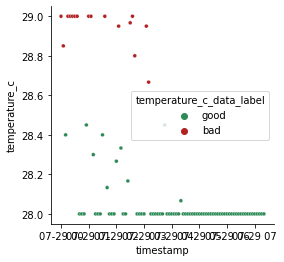

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 7


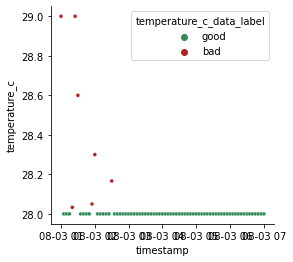

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 20


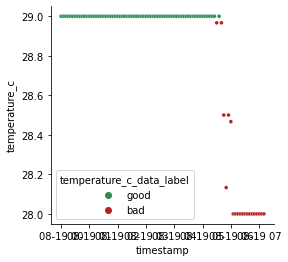

	Number of outliers for temperature_c: 0
Beacon 10
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 2


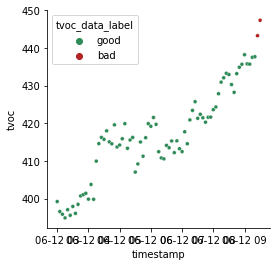

	Number of outliers for tvoc: 24


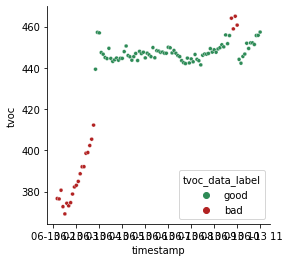

	Number of outliers for tvoc: 14


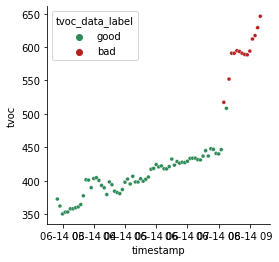

	Number of outliers for tvoc: 2


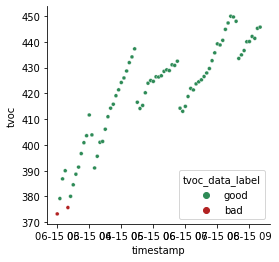

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 1


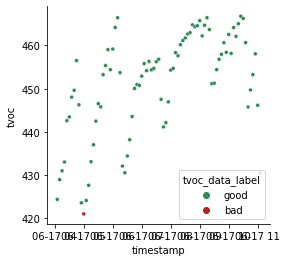

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 3


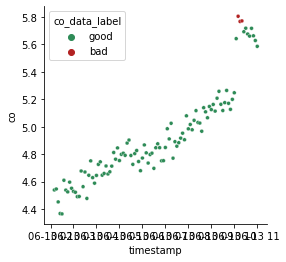

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 2


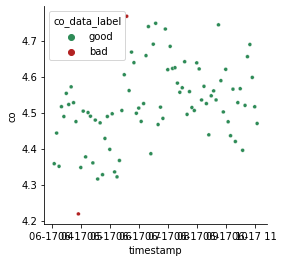

	Number of outliers for co: 2


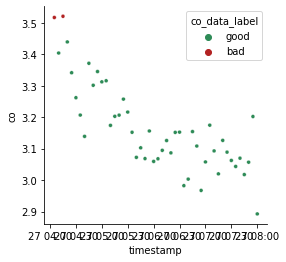

	Number of outliers for co: 0
	Number of outliers for co: 17


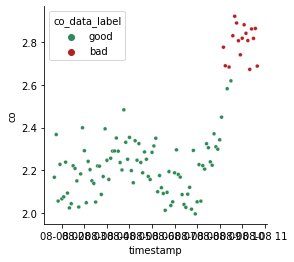

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 4


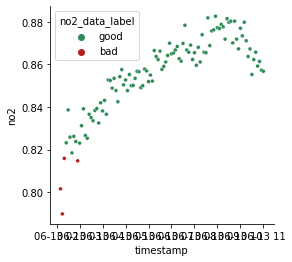

	Number of outliers for no2: 0
	Number of outliers for no2: 4


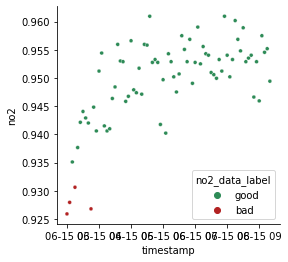

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 2


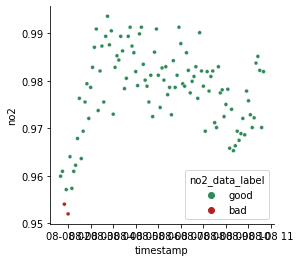

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 7


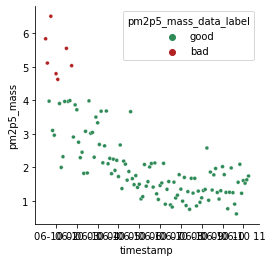

	Number of outliers for pm2p5_mass: 3


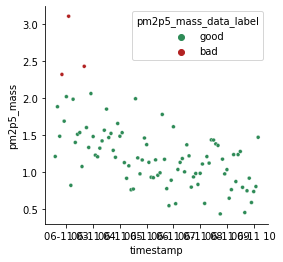

	Number of outliers for pm2p5_mass: 1


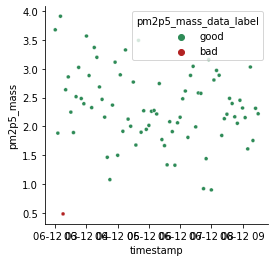

	Number of outliers for pm2p5_mass: 2


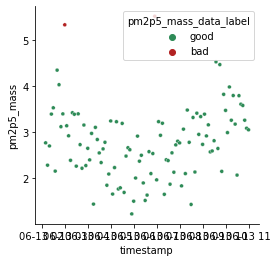

	Number of outliers for pm2p5_mass: 7


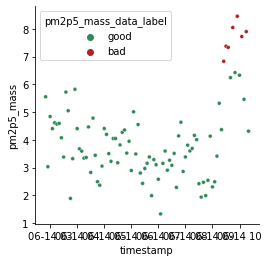

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


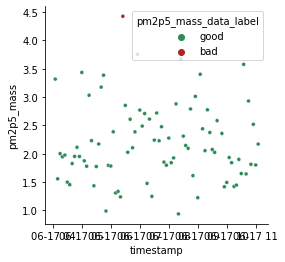

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 4


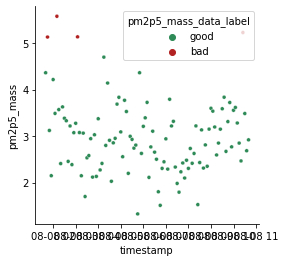

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 13


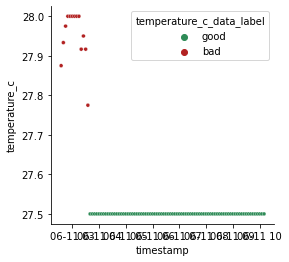

	Number of outliers for temperature_c: 18


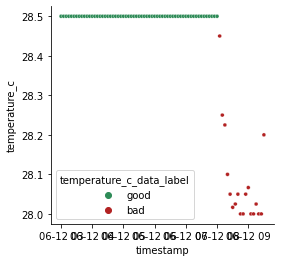

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 19


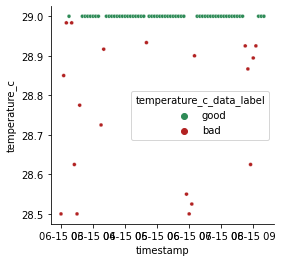

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 11


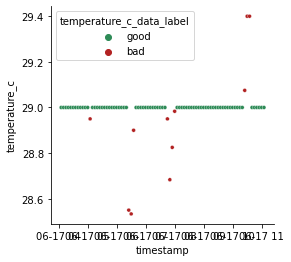

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
Beacon 1
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 2


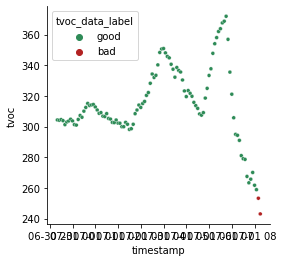

	Number of outliers for tvoc: 19


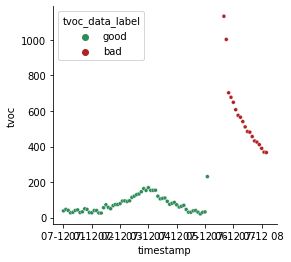

	Number of outliers for tvoc: 3


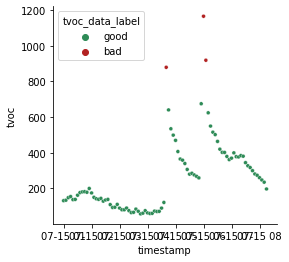

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 2


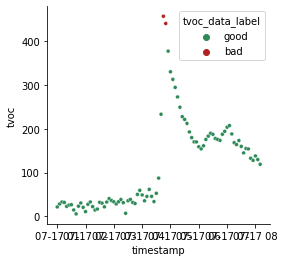

	Number of outliers for tvoc: 4


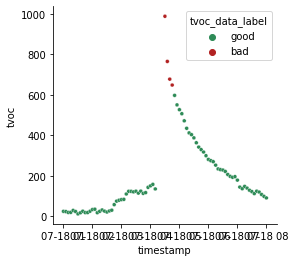

	Number of outliers for tvoc: 1


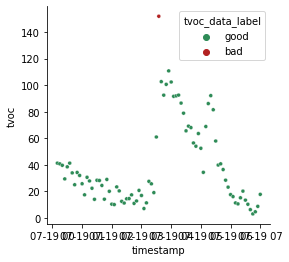

	Number of outliers for tvoc: 8


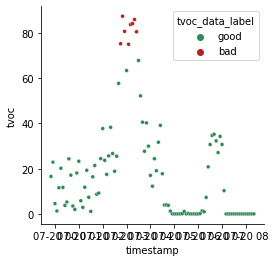

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 6


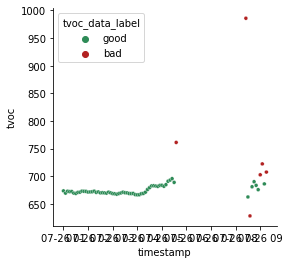

	Number of outliers for co: 3


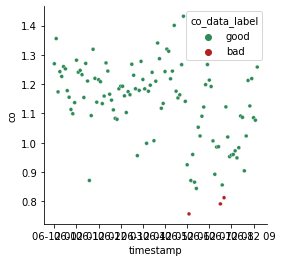

	Number of outliers for co: 0
	Number of outliers for co: 1


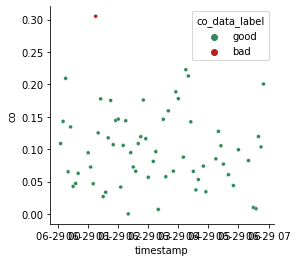

	Number of outliers for co: 0
	Number of outliers for co: 14


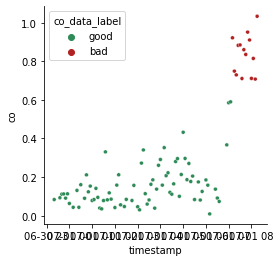

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 11


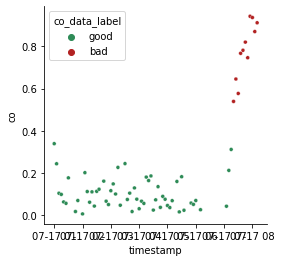

	Number of outliers for co: 11


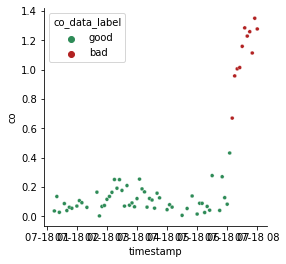

	Number of outliers for co: 14


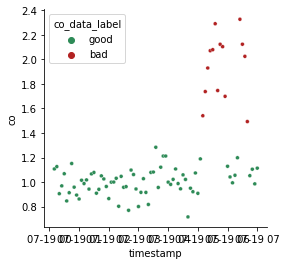

	Number of outliers for co: 15


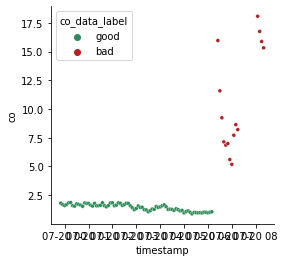

	Number of outliers for co: 12


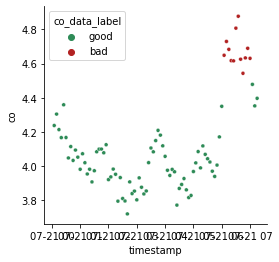

	Number of outliers for co: 10


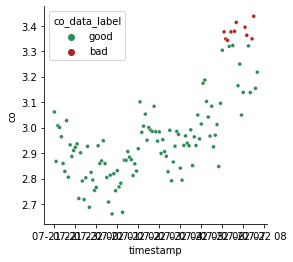

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for no2: 8


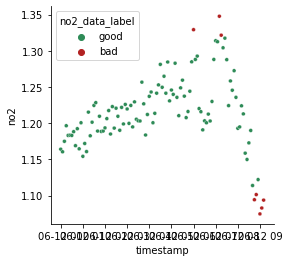

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 3


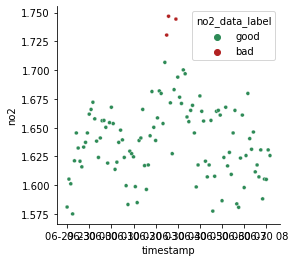

	Number of outliers for no2: 10


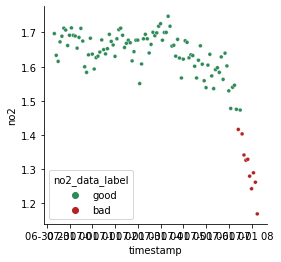

	Number of outliers for no2: 1


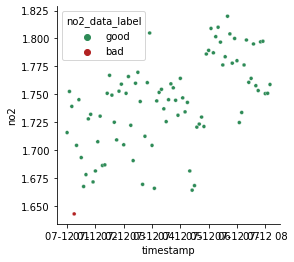

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 13


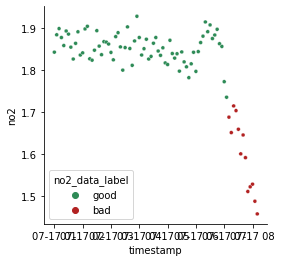

	Number of outliers for no2: 11


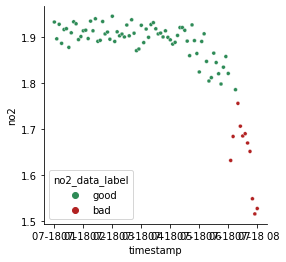

	Number of outliers for no2: 2


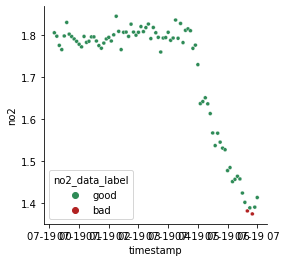

	Number of outliers for no2: 11


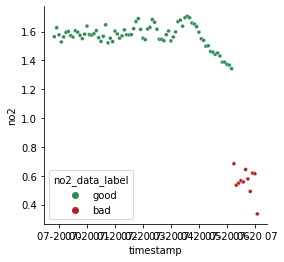

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for co2: 2


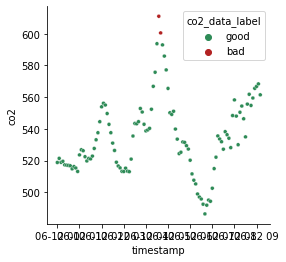

	Number of outliers for co2: 0
	Number of outliers for co2: 7


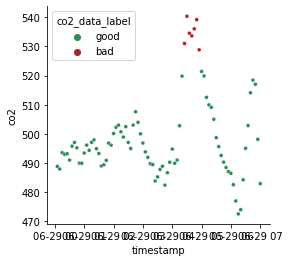

	Number of outliers for co2: 1


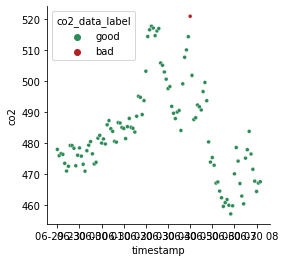

	Number of outliers for co2: 14


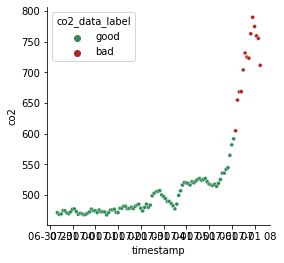

	Number of outliers for co2: 0
	Number of outliers for co2: 14


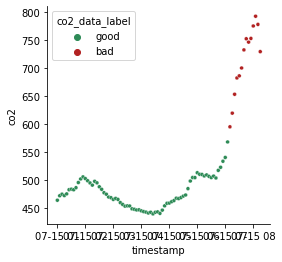

	Number of outliers for co2: 10


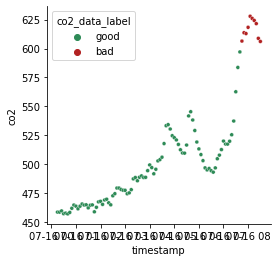

	Number of outliers for co2: 14


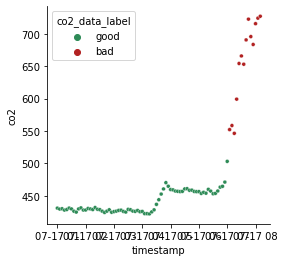

	Number of outliers for co2: 11


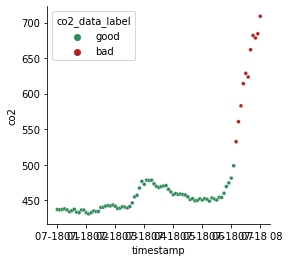

	Number of outliers for co2: 12


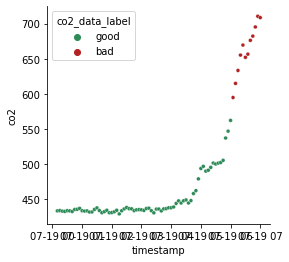

	Number of outliers for co2: 14


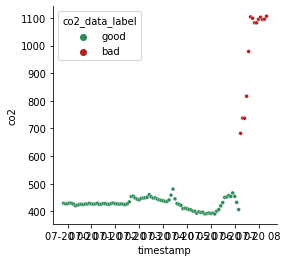

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 2


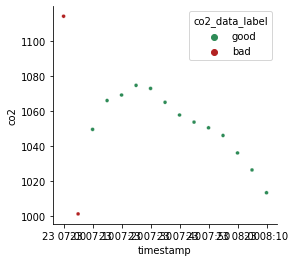

	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 6


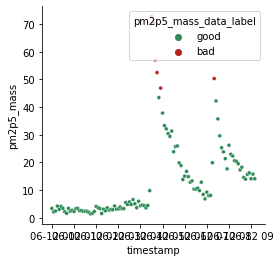

	Number of outliers for pm2p5_mass: 8


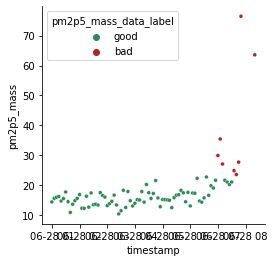

	Number of outliers for pm2p5_mass: 1


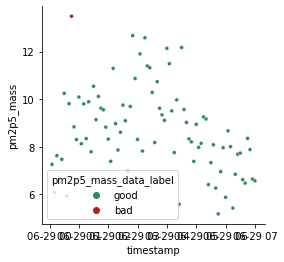

	Number of outliers for pm2p5_mass: 1


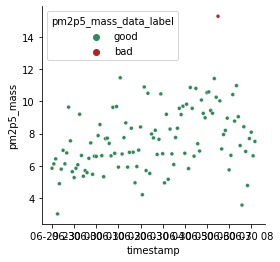

	Number of outliers for pm2p5_mass: 5


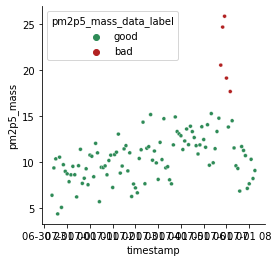

	Number of outliers for pm2p5_mass: 2


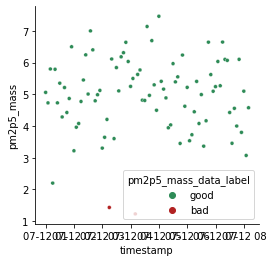

	Number of outliers for pm2p5_mass: 1


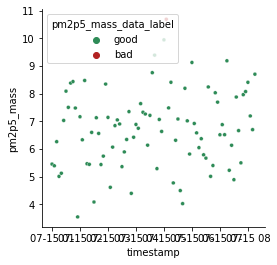

	Number of outliers for pm2p5_mass: 3


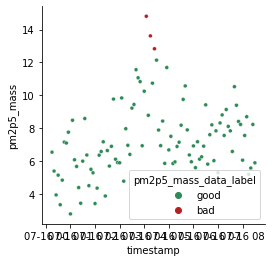

	Number of outliers for pm2p5_mass: 2


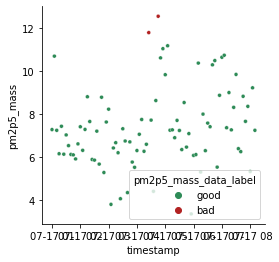

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


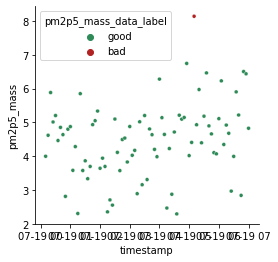

	Number of outliers for pm2p5_mass: 9


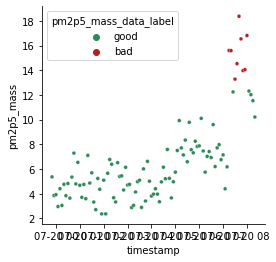

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


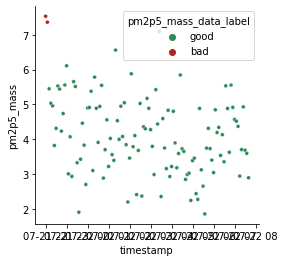

	Number of outliers for pm2p5_mass: 1


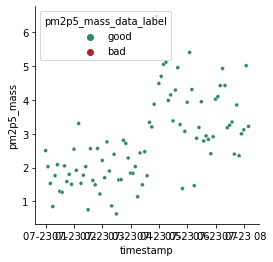

	Number of outliers for pm2p5_mass: 2


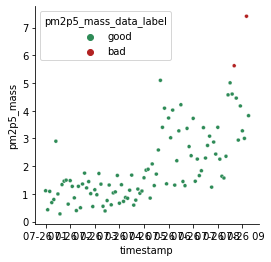

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 19


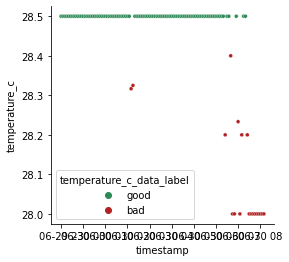

	Number of outliers for temperature_c: 33


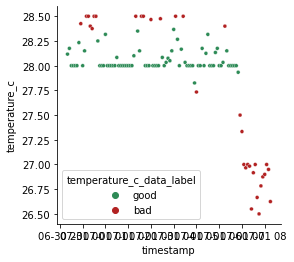

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 28


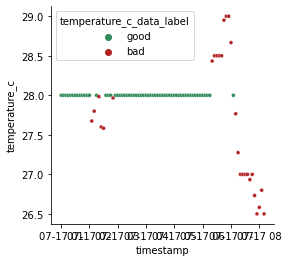

	Number of outliers for temperature_c: 12


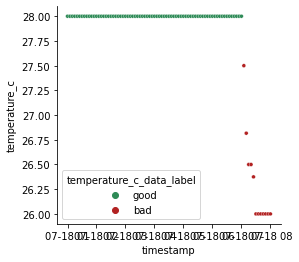

	Number of outliers for temperature_c: 3


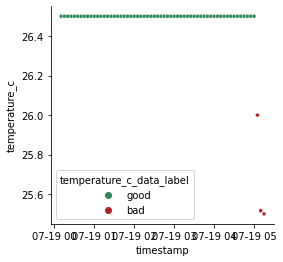

	Number of outliers for temperature_c: 13


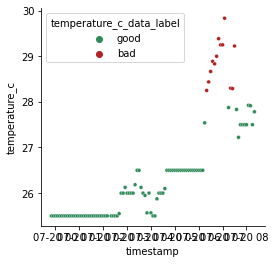

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 53


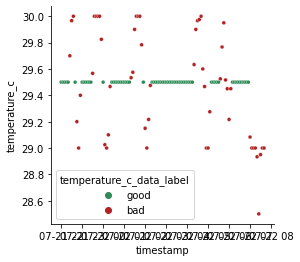

	Number of outliers for temperature_c: 21


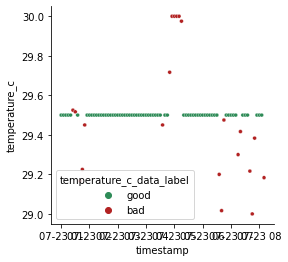

	Number of outliers for temperature_c: 16


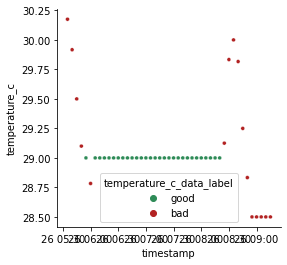

Beacon 16
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for no2: 1


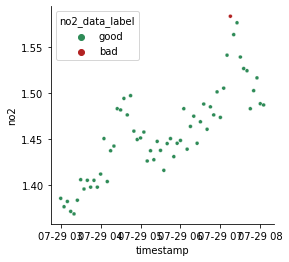

	Number of outliers for no2: 0
	Number of outliers for no2: 1


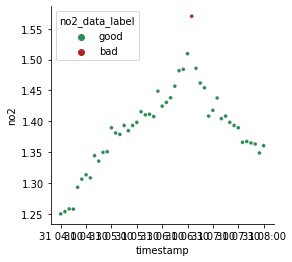

	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 4


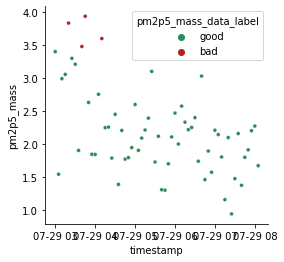

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 5


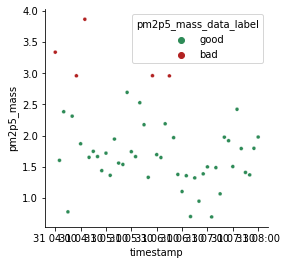

	Number of outliers for pm2p5_mass: 1


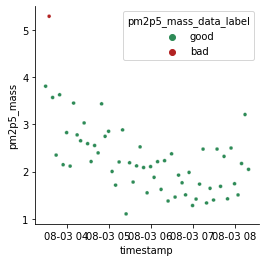

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 9


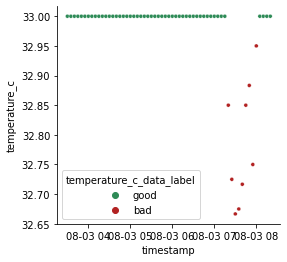

Beacon 5
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 2


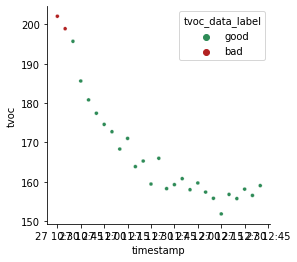

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 8


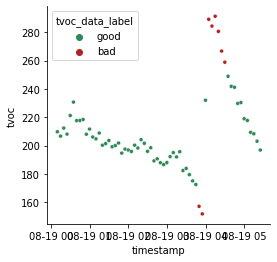

	Number of outliers for tvoc: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 11


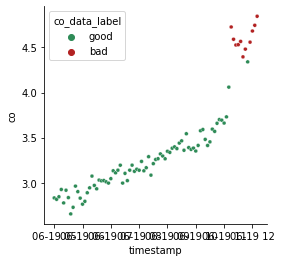

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 3


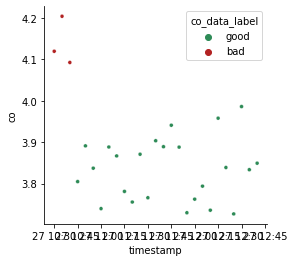

	Number of outliers for co: 0
	Number of outliers for co: 1


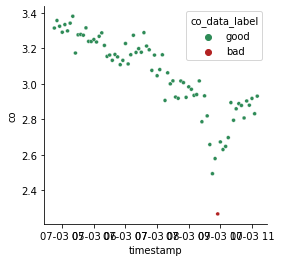

	Number of outliers for co: 0
	Number of outliers for co: 1


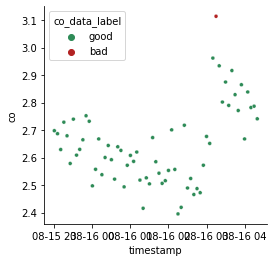

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for no2: 3


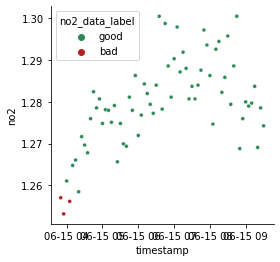

	Number of outliers for no2: 0
	Number of outliers for no2: 13


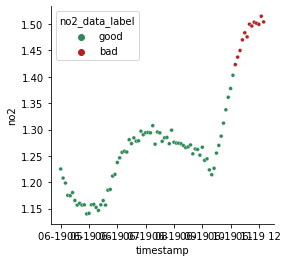

	Number of outliers for no2: 16


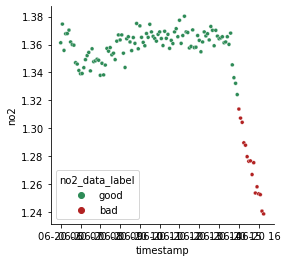

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 14


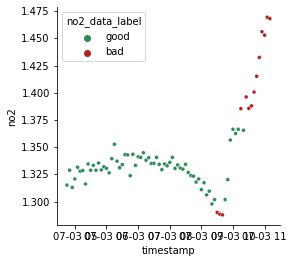

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 8


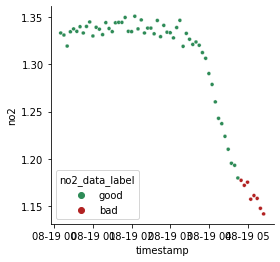

	Number of outliers for no2: 3


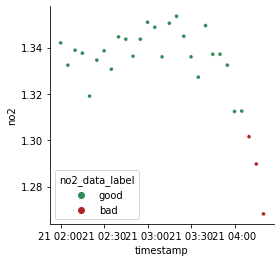

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 8


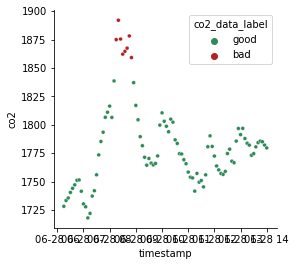

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


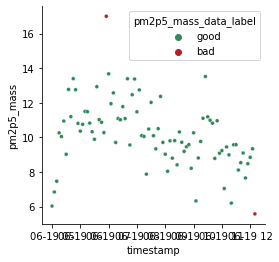

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 6


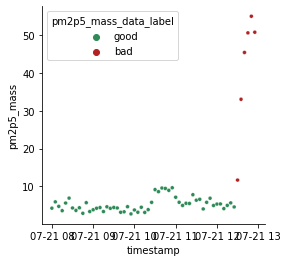

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for temperature_c: 8


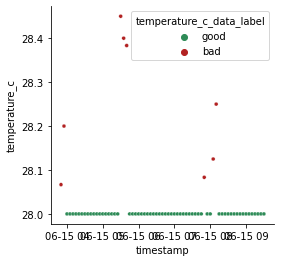

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 1


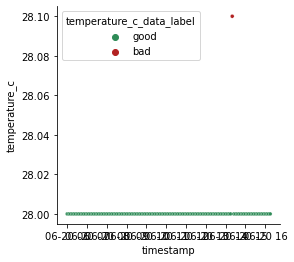

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 7


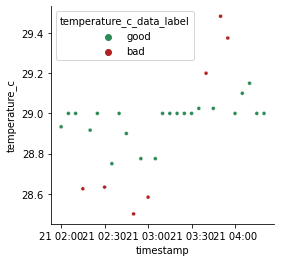

Beacon 26
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 1


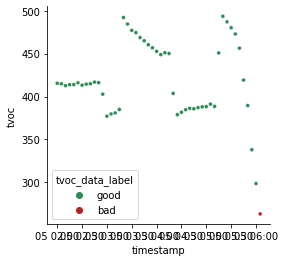

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 13


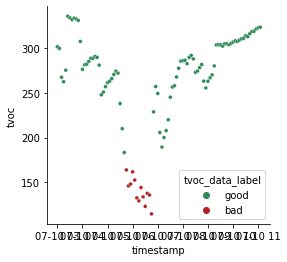

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 15


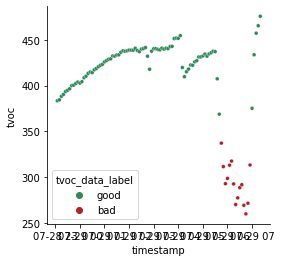

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 2


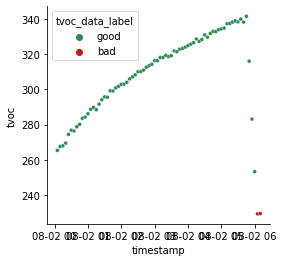

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 6


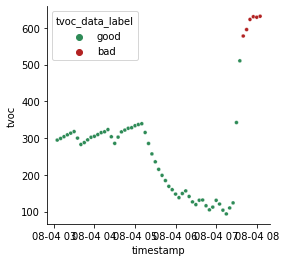

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 2


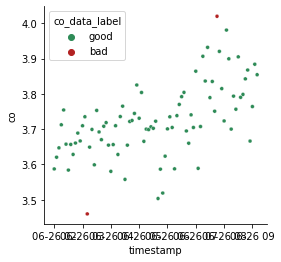

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 2


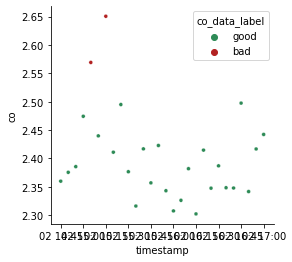

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 2


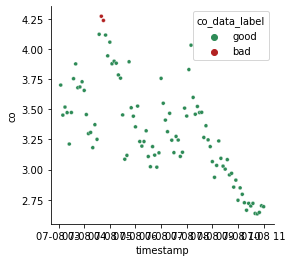

	Number of outliers for co: 0
	Number of outliers for co: 1


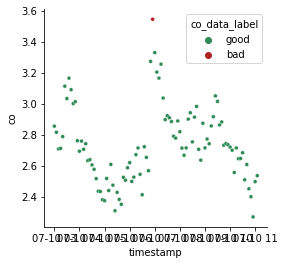

	Number of outliers for co: 0
	Number of outliers for co: 1


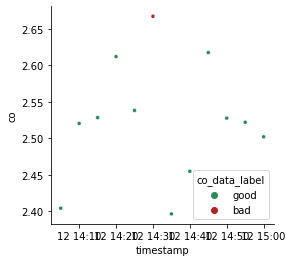

	Number of outliers for co: 1


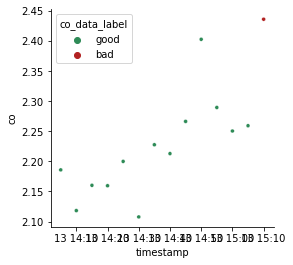

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 1


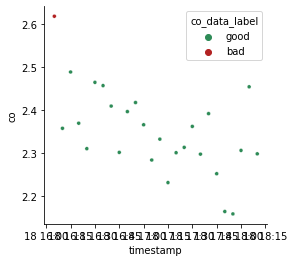

	Number of outliers for co: 0
	Number of outliers for co: 1


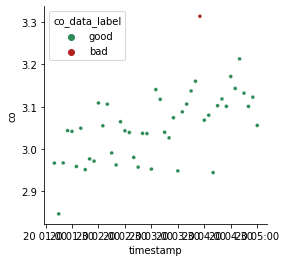

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 1


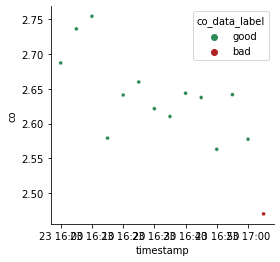

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 4


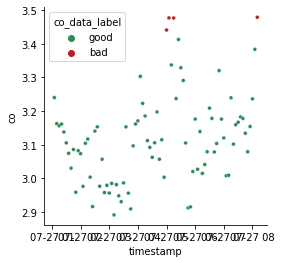

	Number of outliers for co: 1


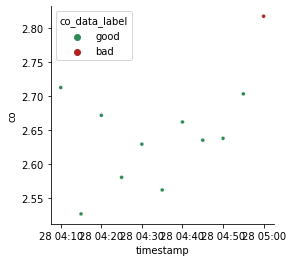

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 2


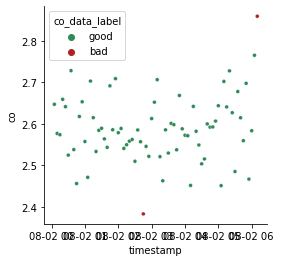

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 1


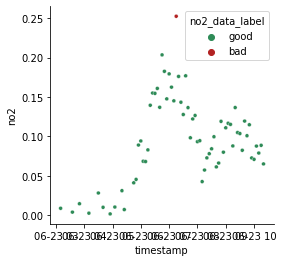

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 1


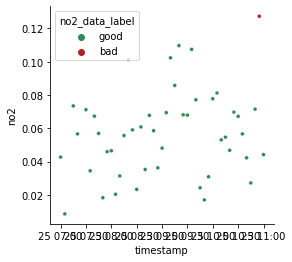

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 3


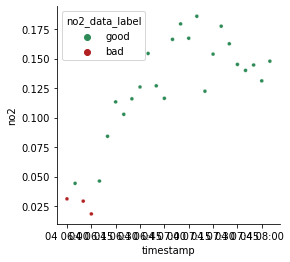

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 3


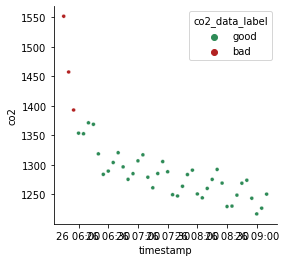

	Number of outliers for co2: 0
	Number of outliers for co2: 1


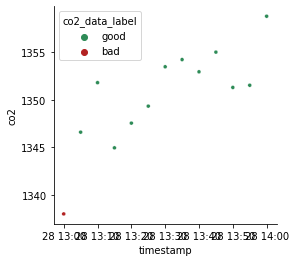

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 12


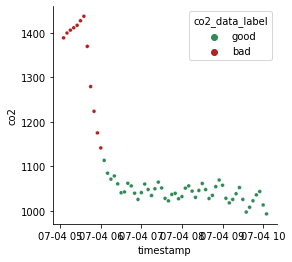

	Number of outliers for co2: 3


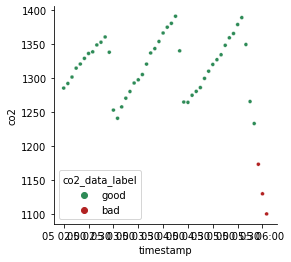

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 1


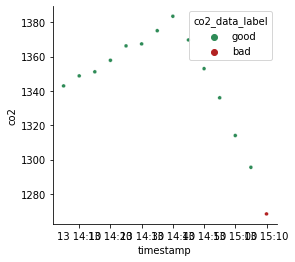

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 1


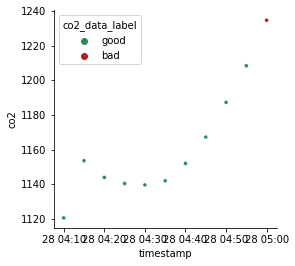

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


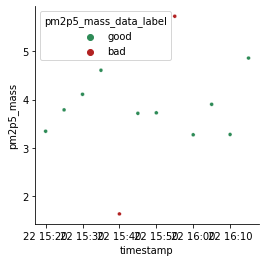

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


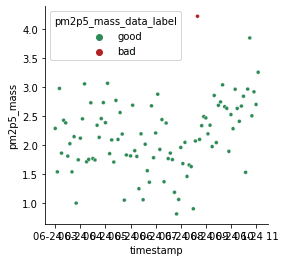

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


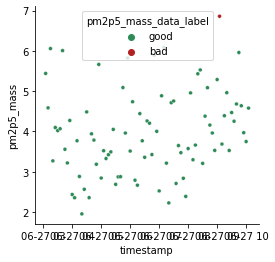

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 3


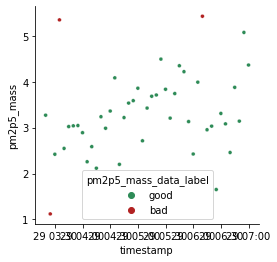

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


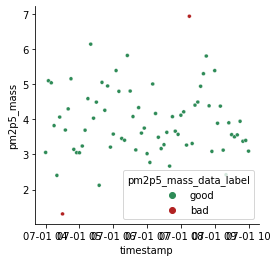

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


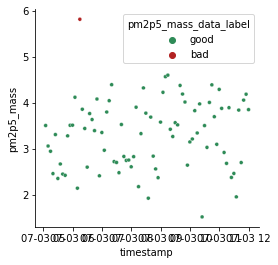

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


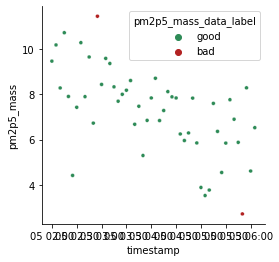

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 5


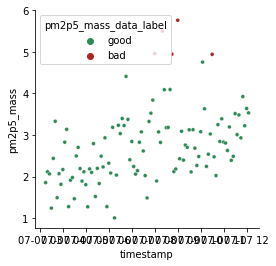

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


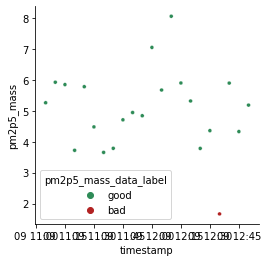

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


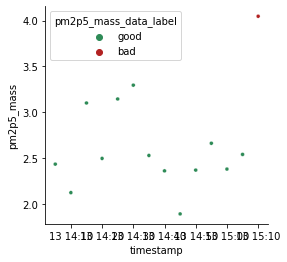

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


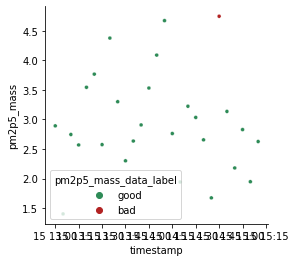

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


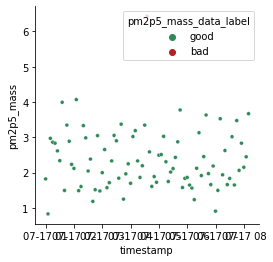

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


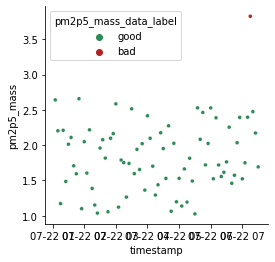

	Number of outliers for pm2p5_mass: 2


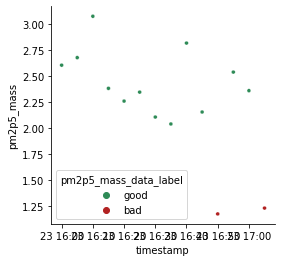

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 4


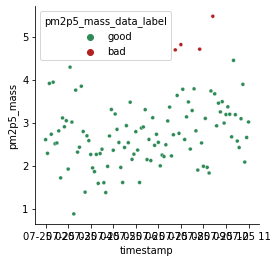

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


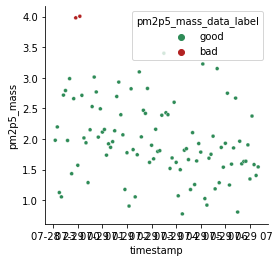

	Number of outliers for pm2p5_mass: 1


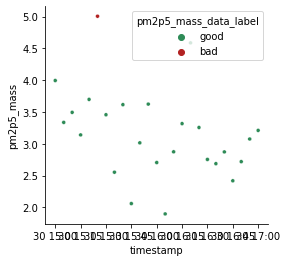

	Number of outliers for pm2p5_mass: 3


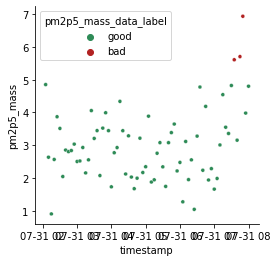

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


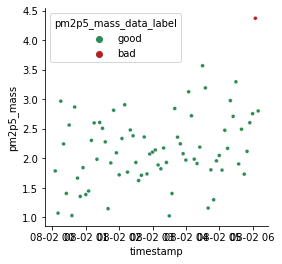

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


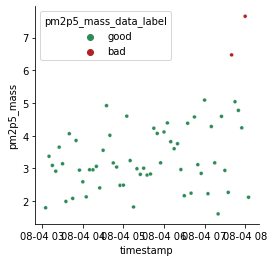

	Number of outliers for pm2p5_mass: 3


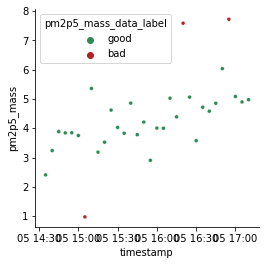

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 3


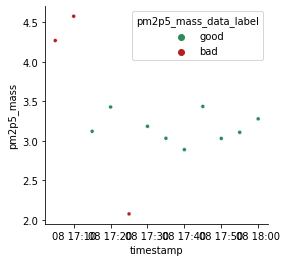

	Number of outliers for pm2p5_mass: 1


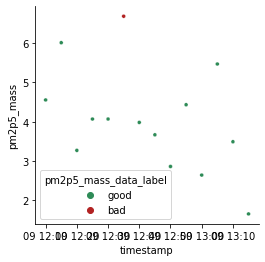

	Number of outliers for temperature_c: 7


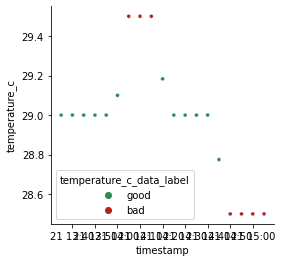

	Number of outliers for temperature_c: 1


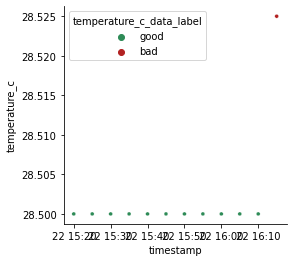

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 5


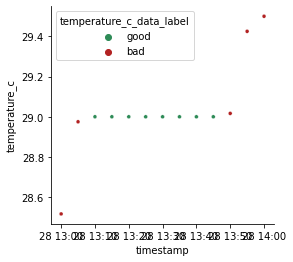

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 9


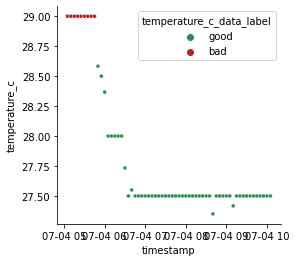

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 3


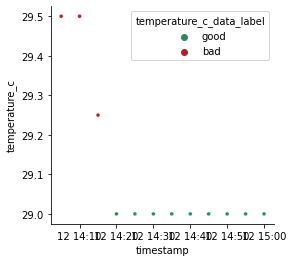

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 3


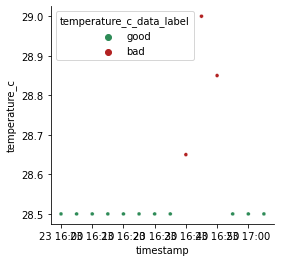

	Number of outliers for temperature_c: 3


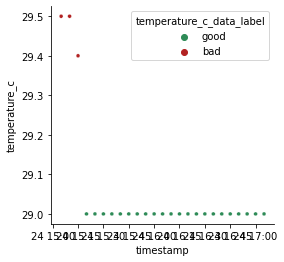

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 2


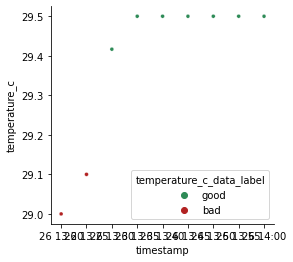

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 12


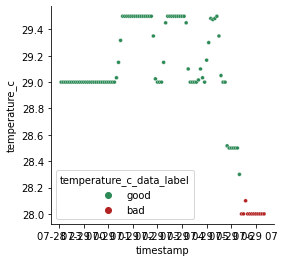

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 8


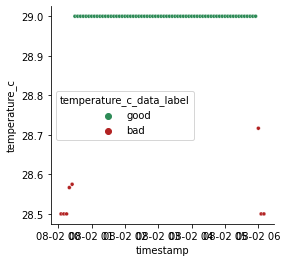

	Number of outliers for temperature_c: 3


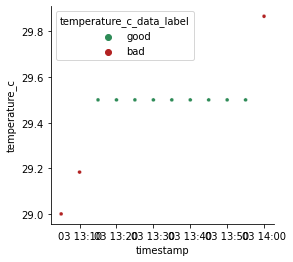

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 2


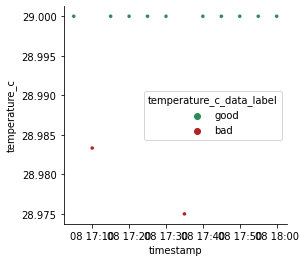

	Number of outliers for temperature_c: 4


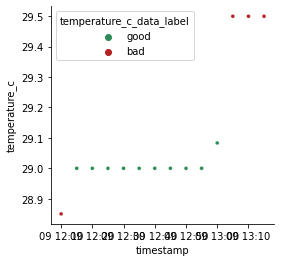

Beacon 25
	Number of outliers for tvoc: 3


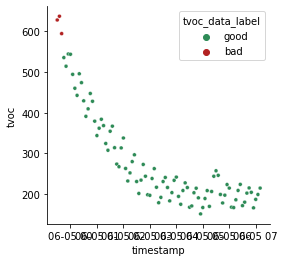

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 3


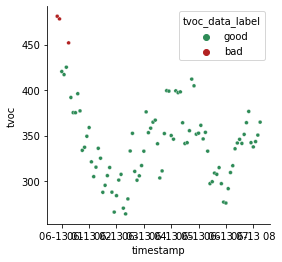

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 2


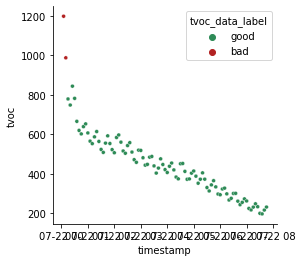

	Number of outliers for tvoc: 7


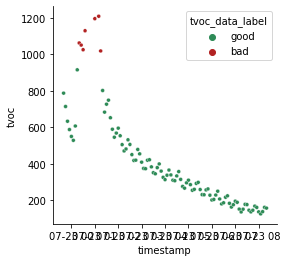

	Number of outliers for tvoc: 5


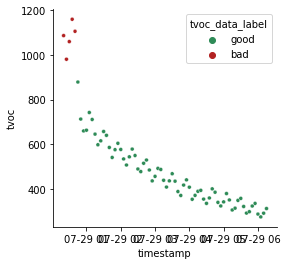

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 9


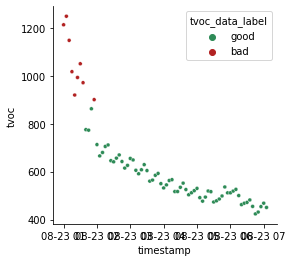

	Number of outliers for tvoc: 4


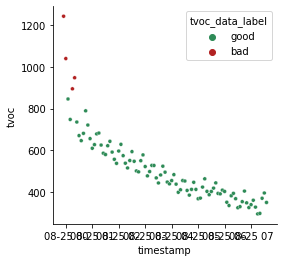

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 3


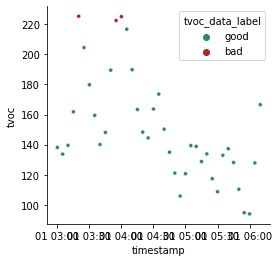

	Number of outliers for tvoc: 0
	Number of outliers for co: 0
	Number of outliers for co: 3


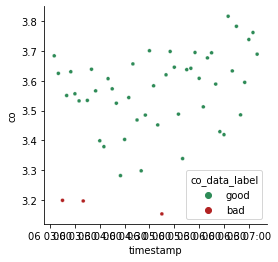

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 1


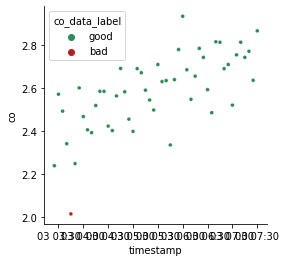

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 12


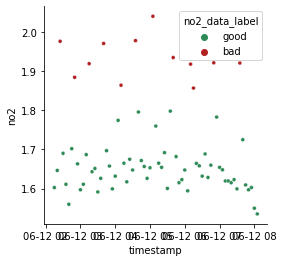

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 2


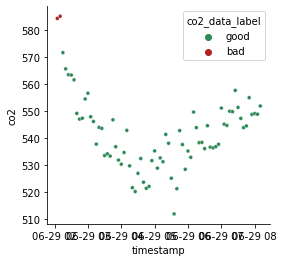

	Number of outliers for co2: 0
	Number of outliers for co2: 1


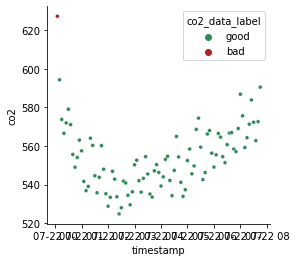

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 1


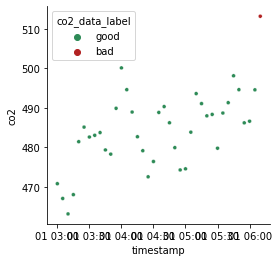

	Number of outliers for co2: 1


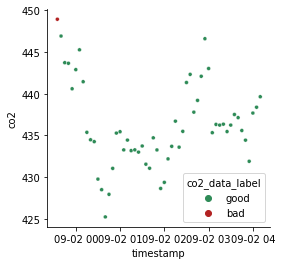

	Number of outliers for pm2p5_mass: 2


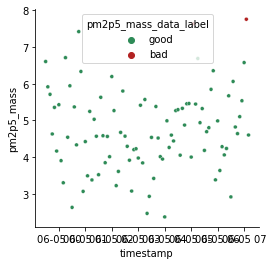

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 11


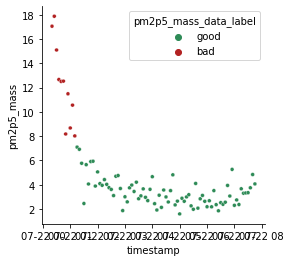

	Number of outliers for pm2p5_mass: 11


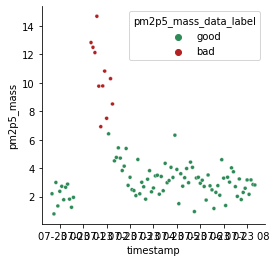

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


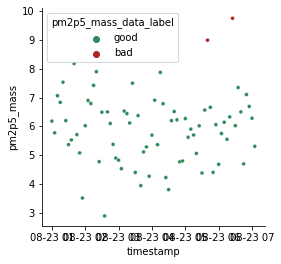

	Number of outliers for pm2p5_mass: 2


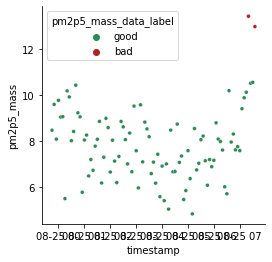

	Number of outliers for pm2p5_mass: 9


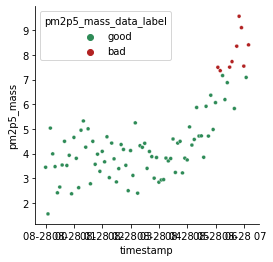

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 31


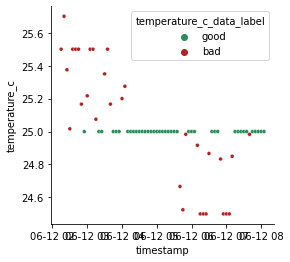

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 14


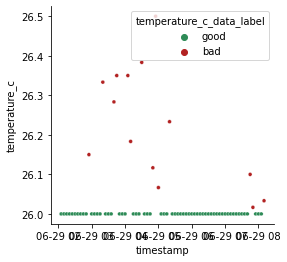

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 9


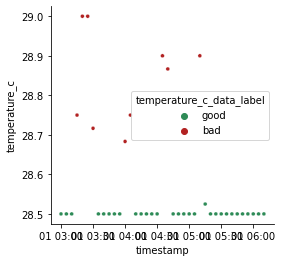

	Number of outliers for temperature_c: 0
Beacon 38
	Number of outliers for tvoc: 2


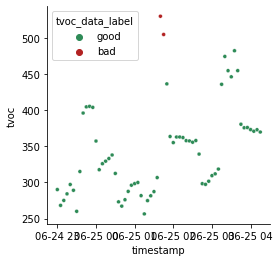

	Number of outliers for tvoc: 4


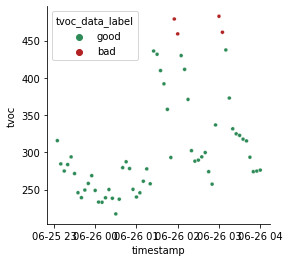

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 1


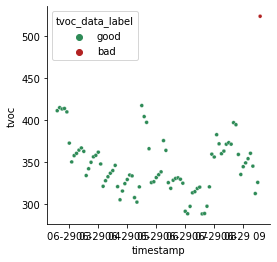

	Number of outliers for tvoc: 3


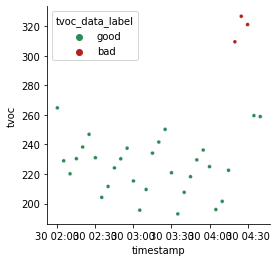

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 14


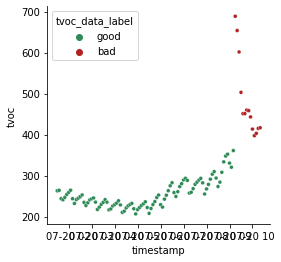

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 2


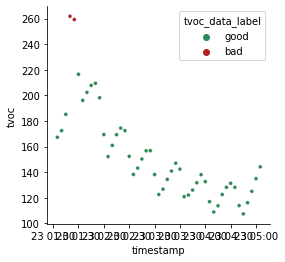

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 4


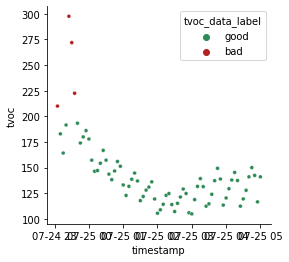

	Number of outliers for tvoc: 13


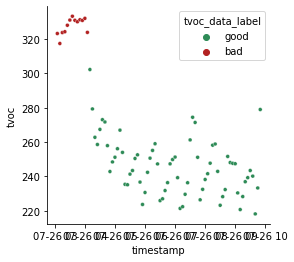

	Number of outliers for tvoc: 8


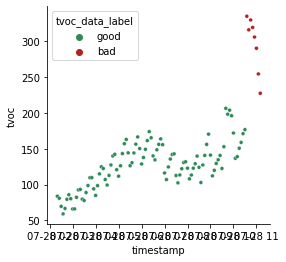

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 2


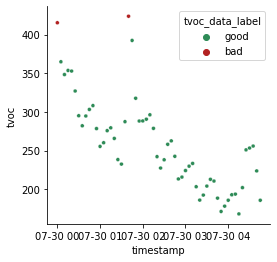

	Number of outliers for tvoc: 2


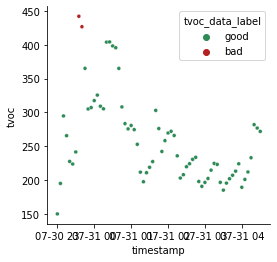

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 5


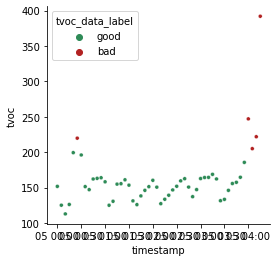

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for co: 2


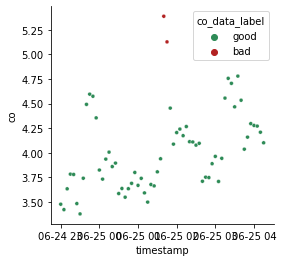

	Number of outliers for co: 4


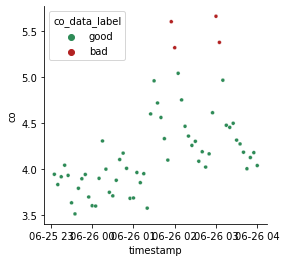

	Number of outliers for co: 1


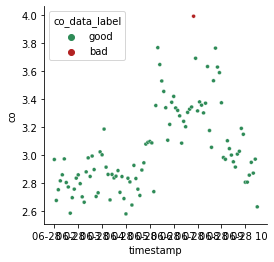

	Number of outliers for co: 1


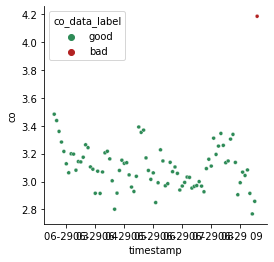

	Number of outliers for co: 1


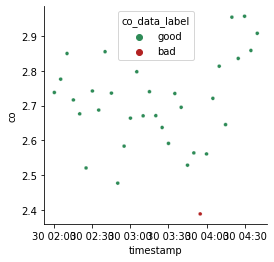

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 9


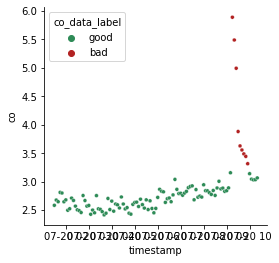

	Number of outliers for co: 2


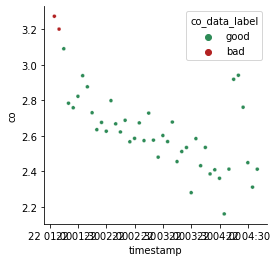

	Number of outliers for co: 2


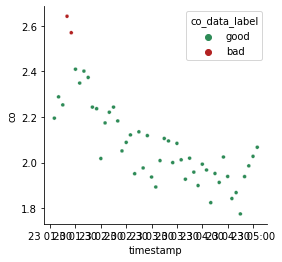

	Number of outliers for co: 0
	Number of outliers for co: 4


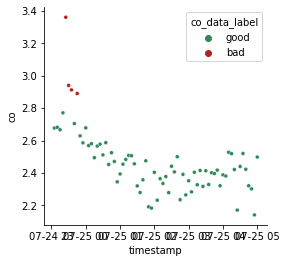

	Number of outliers for co: 0
	Number of outliers for co: 10


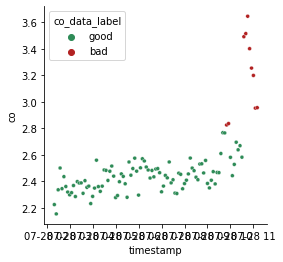

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 5


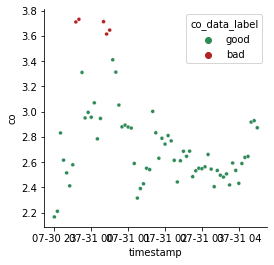

	Number of outliers for co: 1


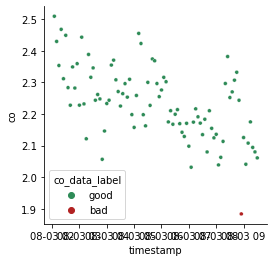

	Number of outliers for co: 0
	Number of outliers for co: 5


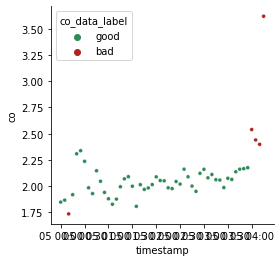

	Number of outliers for co: 2


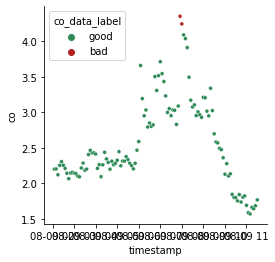

	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 9


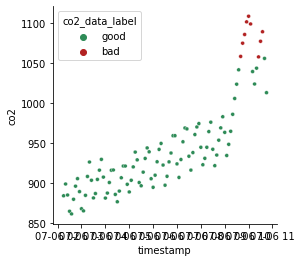

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 1


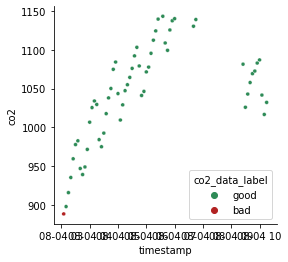

	Number of outliers for co2: 0
	Number of outliers for co2: 4


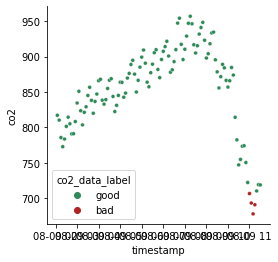

	Number of outliers for co2: 2


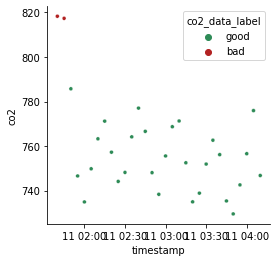

	Number of outliers for pm2p5_mass: 1


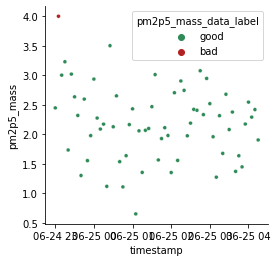

	Number of outliers for pm2p5_mass: 1


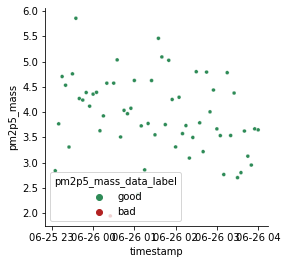

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


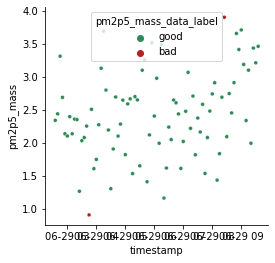

	Number of outliers for pm2p5_mass: 1


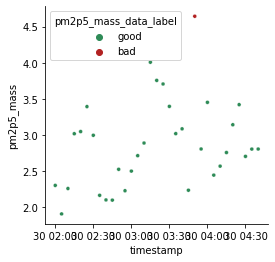

	Number of outliers for pm2p5_mass: 5


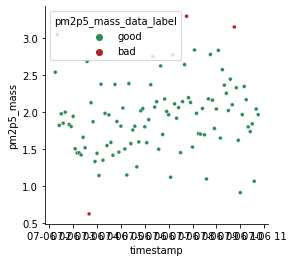

	Number of outliers for pm2p5_mass: 3


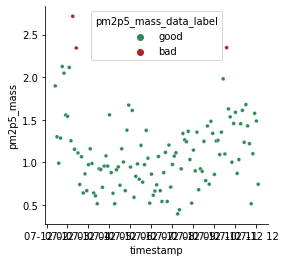

	Number of outliers for pm2p5_mass: 1


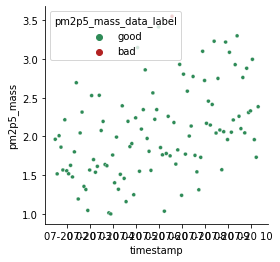

	Number of outliers for pm2p5_mass: 1


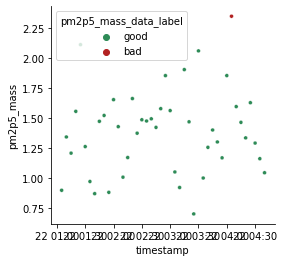

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


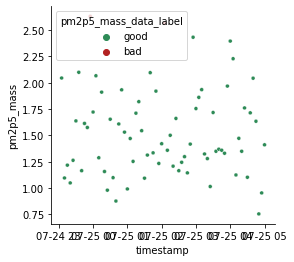

	Number of outliers for pm2p5_mass: 2


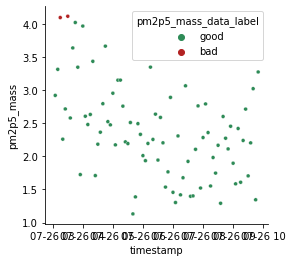

	Number of outliers for pm2p5_mass: 2


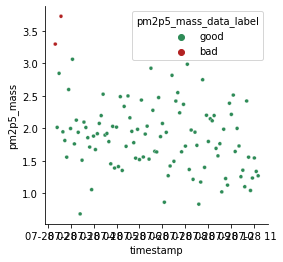

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


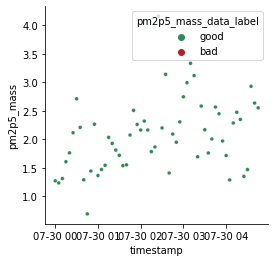

	Number of outliers for pm2p5_mass: 1


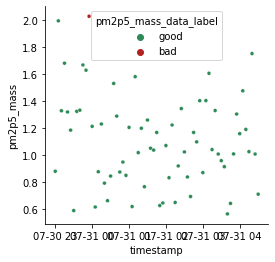

	Number of outliers for pm2p5_mass: 1


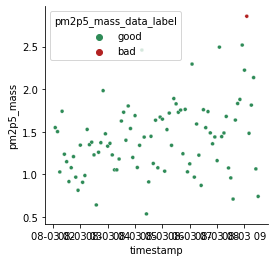

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


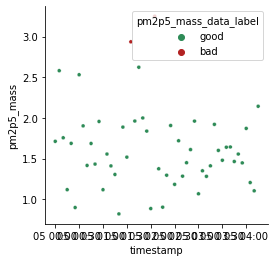

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


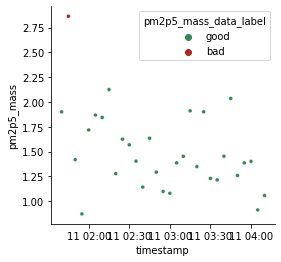

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 15


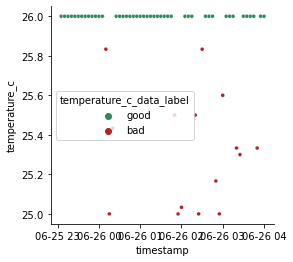

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 8


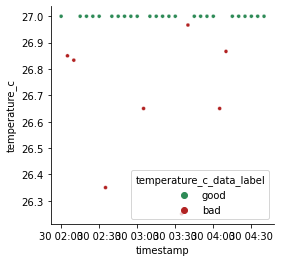

	Number of outliers for temperature_c: 4


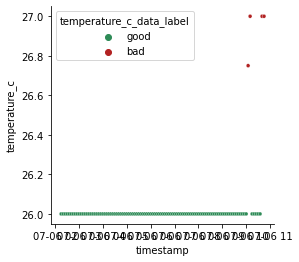

	Number of outliers for temperature_c: 6


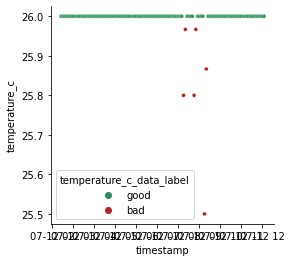

	Number of outliers for temperature_c: 15


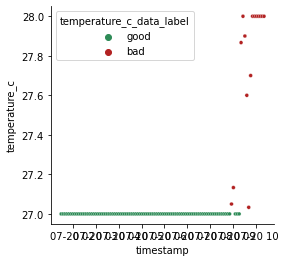

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 1


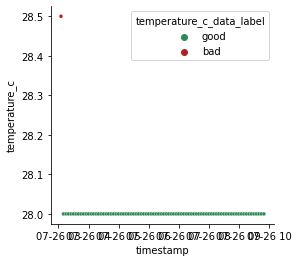

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 3


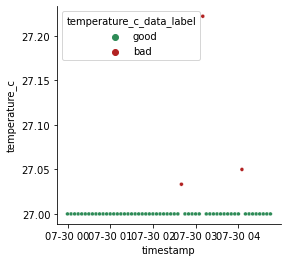

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 8


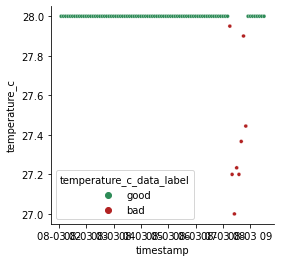

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 6


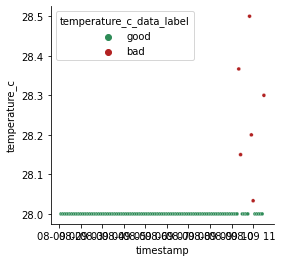

	Number of outliers for temperature_c: 0
Beacon 34
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 5


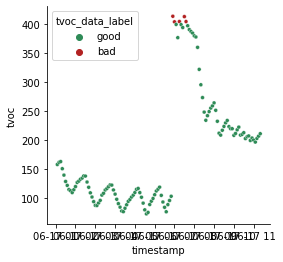

	Number of outliers for tvoc: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


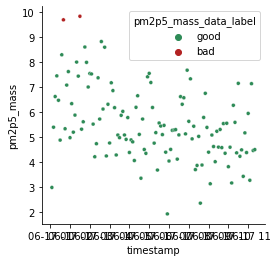

	Number of outliers for pm2p5_mass: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 7


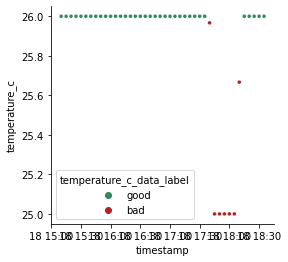

Beacon 44
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 20


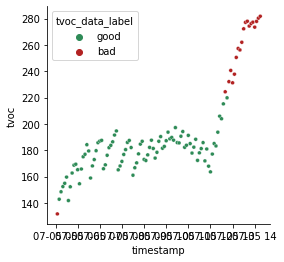

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 9


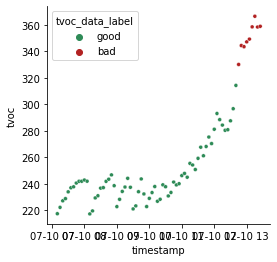

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 6


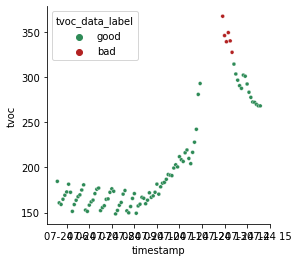

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 8


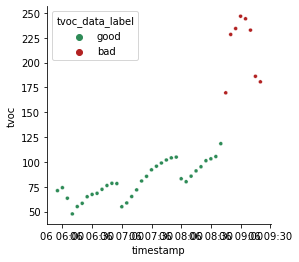

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 7


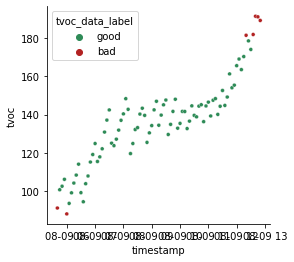

	Number of outliers for tvoc: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 4


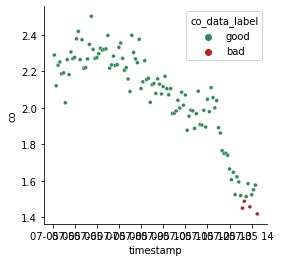

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 1


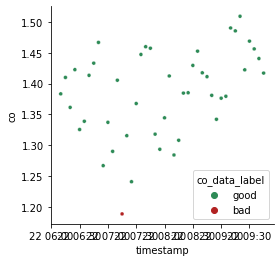

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 3


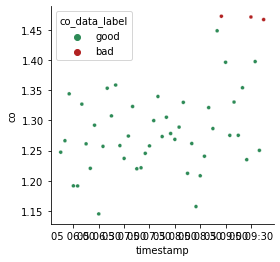

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 1


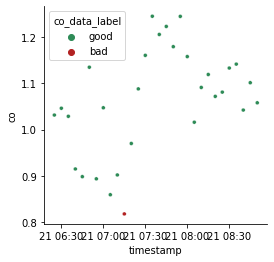

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 4


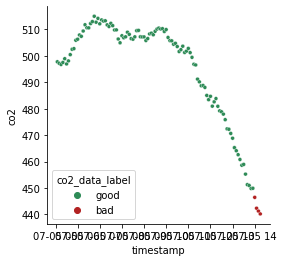

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 5


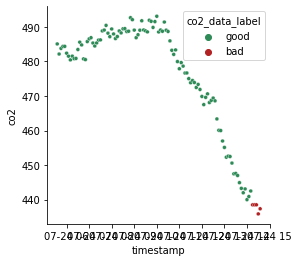

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 4


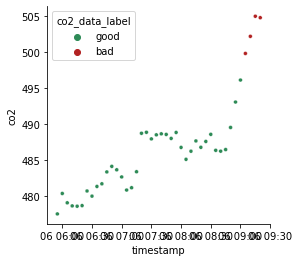

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 1


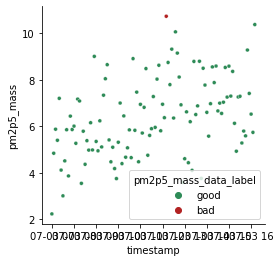

	Number of outliers for pm2p5_mass: 3


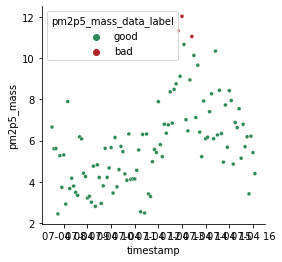

	Number of outliers for pm2p5_mass: 3


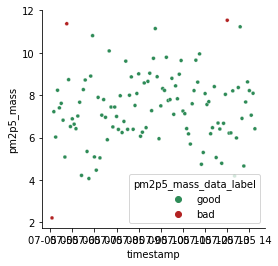

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


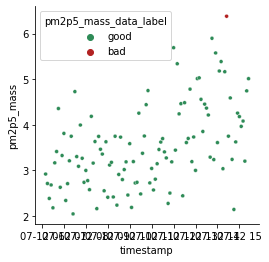

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


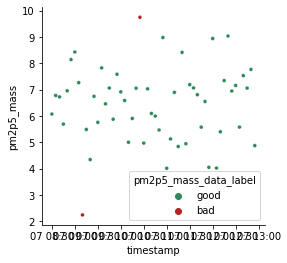

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


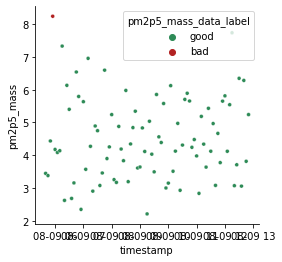

	Number of outliers for pm2p5_mass: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 20


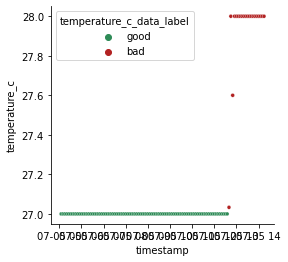

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 4


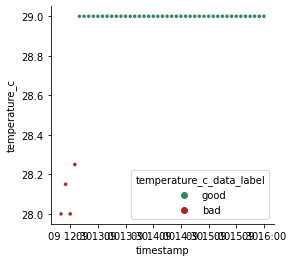

	Number of outliers for temperature_c: 28


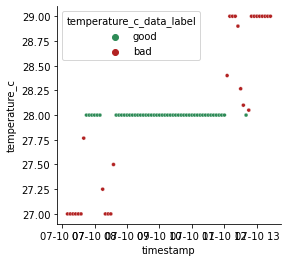

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 1


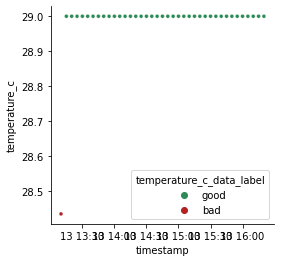

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 24


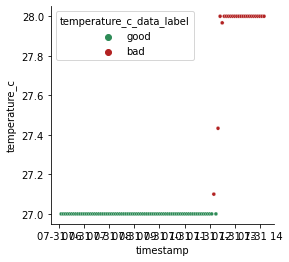

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 2


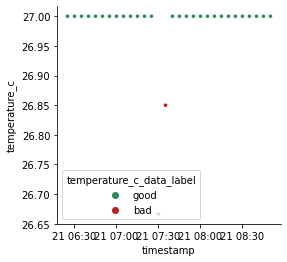

Beacon 15
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 1


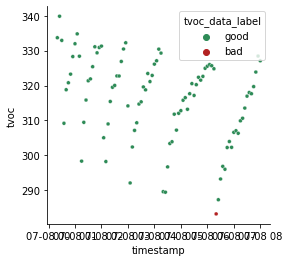

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 1


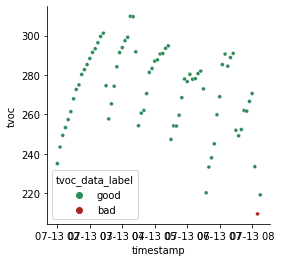

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 3


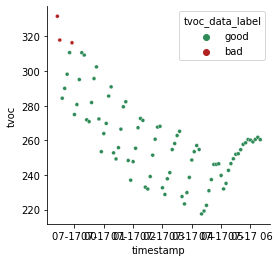

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 6


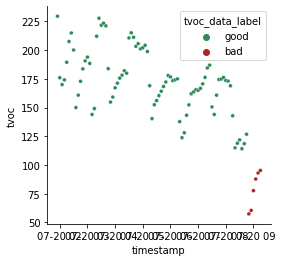

	Number of outliers for tvoc: 2


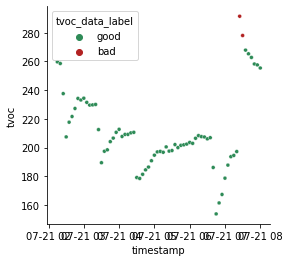

	Number of outliers for tvoc: 6


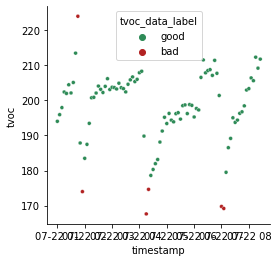

	Number of outliers for tvoc: 6


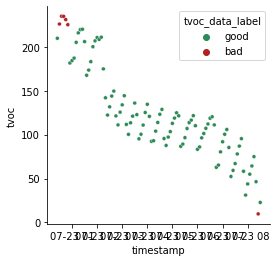

	Number of outliers for tvoc: 4


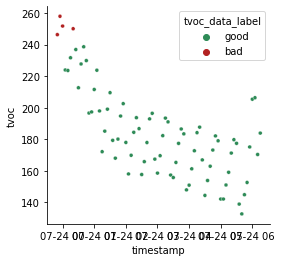

	Number of outliers for tvoc: 7


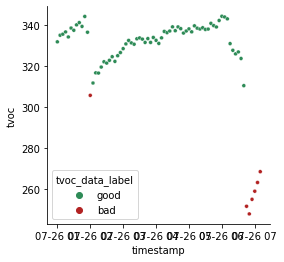

	Number of outliers for tvoc: 2


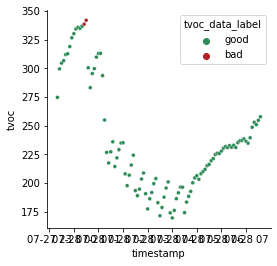

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 1


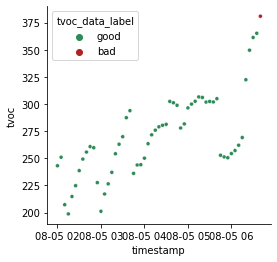

	Number of outliers for tvoc: 13


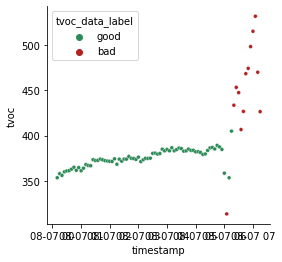

	Number of outliers for tvoc: 2


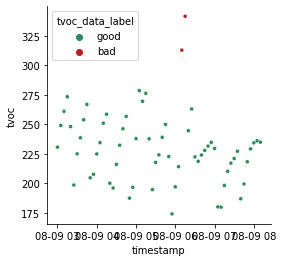

	Number of outliers for tvoc: 1


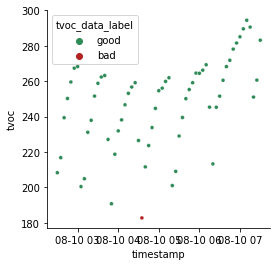

	Number of outliers for tvoc: 5


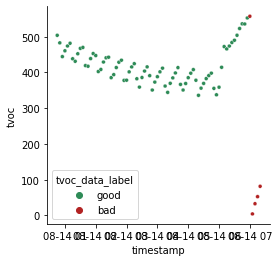

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 9


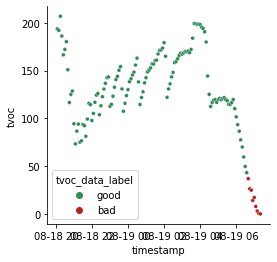

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 2


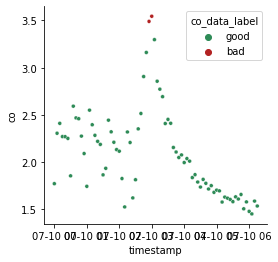

	Number of outliers for co: 5


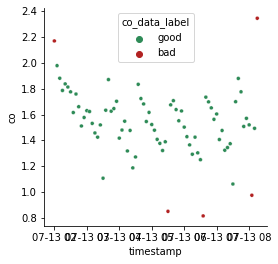

	Number of outliers for co: 5


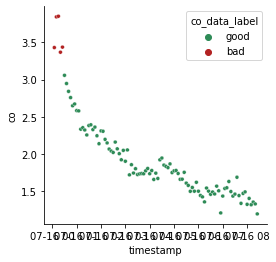

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 7


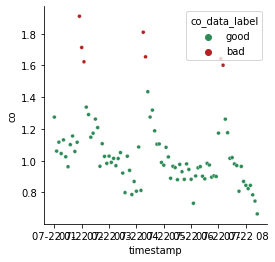

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 5


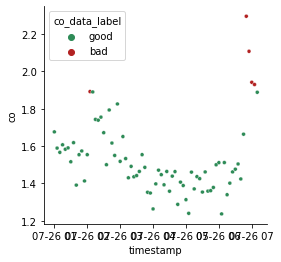

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 14


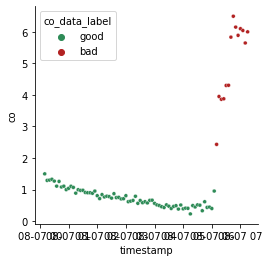

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 3


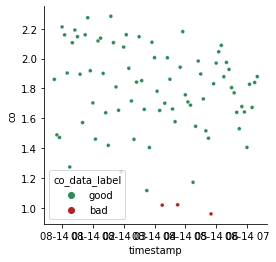

	Number of outliers for co: 1


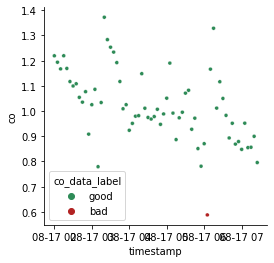

	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 1


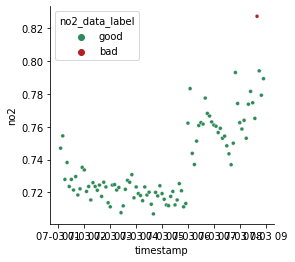

	Number of outliers for no2: 0
	Number of outliers for no2: 3


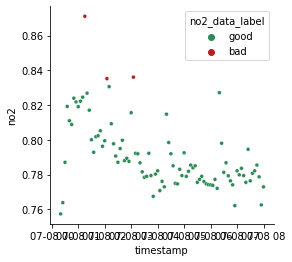

	Number of outliers for no2: 0
	Number of outliers for no2: 10


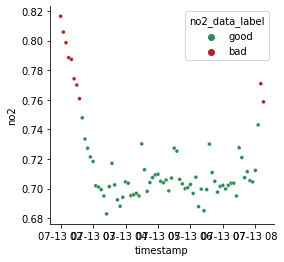

	Number of outliers for no2: 14


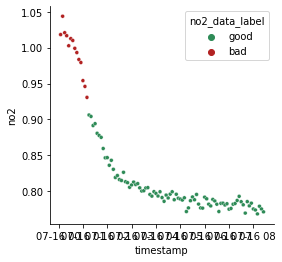

	Number of outliers for no2: 6


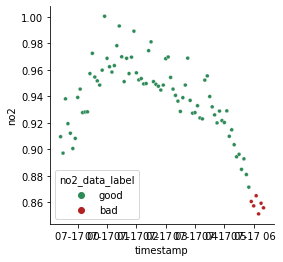

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 1


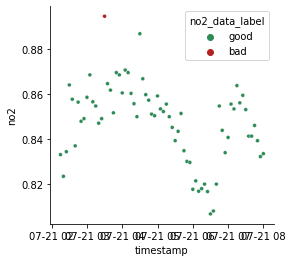

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 1


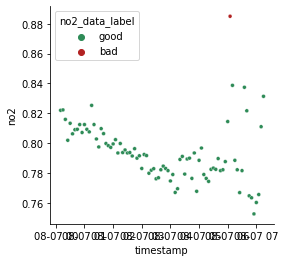

	Number of outliers for no2: 0
	Number of outliers for no2: 9


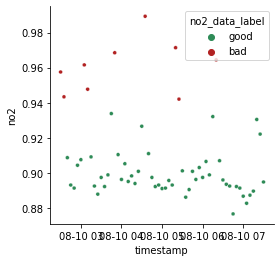

	Number of outliers for no2: 0
	Number of outliers for no2: 1


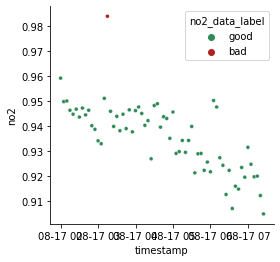

	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 4


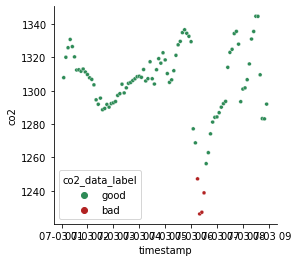

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 10


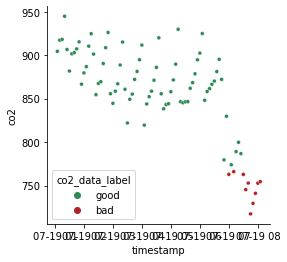

	Number of outliers for co2: 5


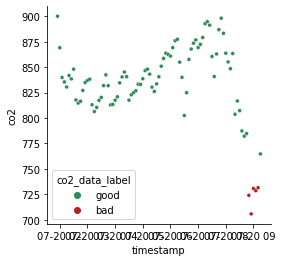

	Number of outliers for co2: 2


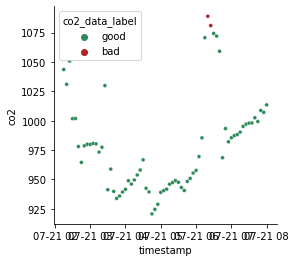

	Number of outliers for co2: 4


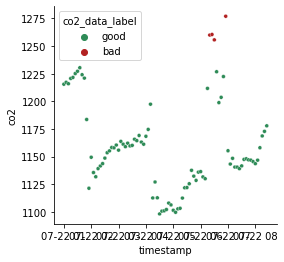

	Number of outliers for co2: 0
	Number of outliers for co2: 4


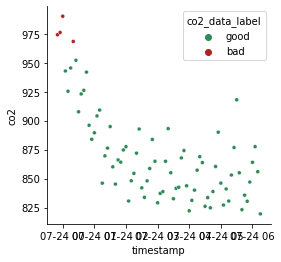

	Number of outliers for co2: 0
	Number of outliers for co2: 5


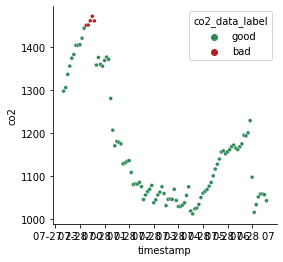

	Number of outliers for co2: 0
	Number of outliers for co2: 1


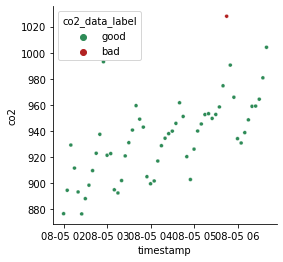

	Number of outliers for co2: 2


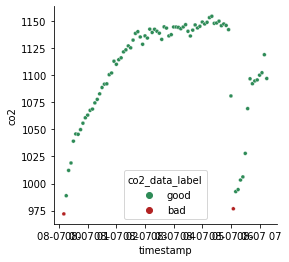

	Number of outliers for co2: 0
	Number of outliers for co2: 3


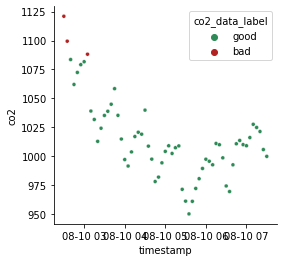

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


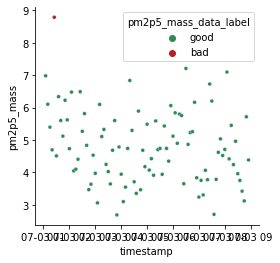

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


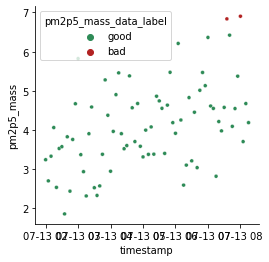

	Number of outliers for pm2p5_mass: 5


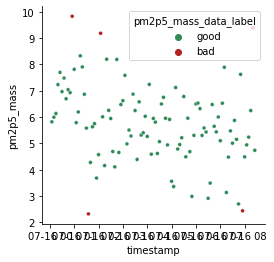

	Number of outliers for pm2p5_mass: 3


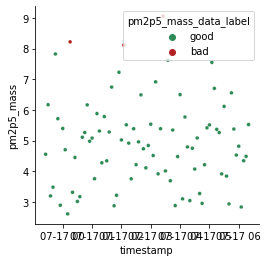

	Number of outliers for pm2p5_mass: 2


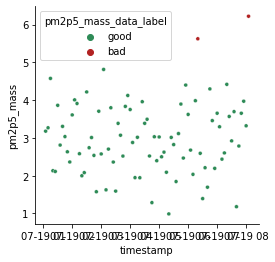

	Number of outliers for pm2p5_mass: 1


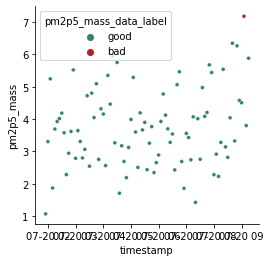

	Number of outliers for pm2p5_mass: 2


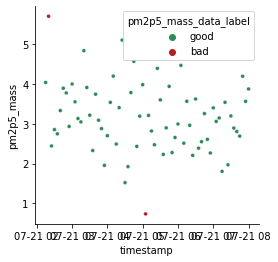

	Number of outliers for pm2p5_mass: 2


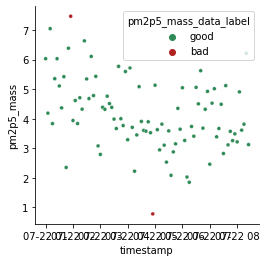

	Number of outliers for pm2p5_mass: 2


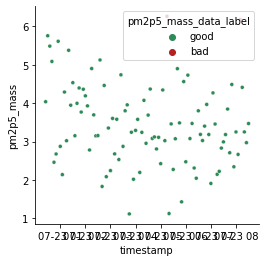

	Number of outliers for pm2p5_mass: 1


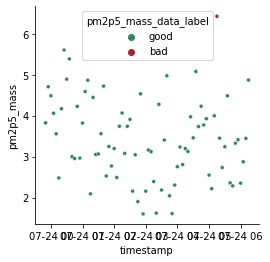

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


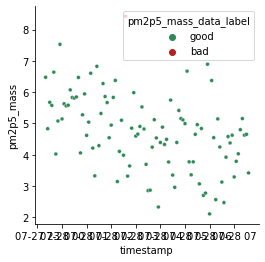

	Number of outliers for pm2p5_mass: 2


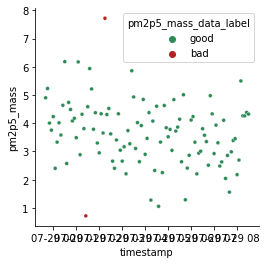

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


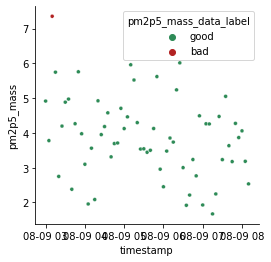

	Number of outliers for pm2p5_mass: 2


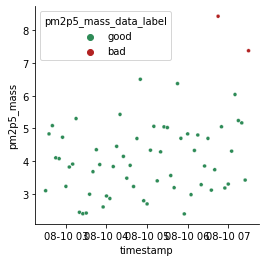

	Number of outliers for pm2p5_mass: 3


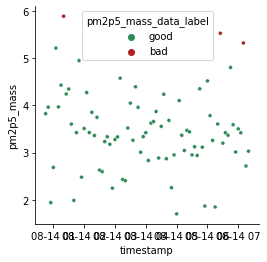

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 6


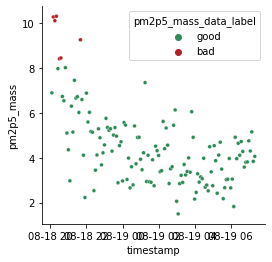

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 12


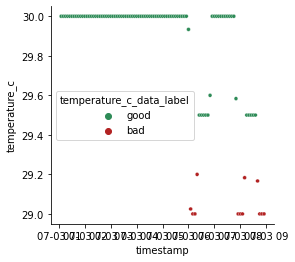

	Number of outliers for temperature_c: 17


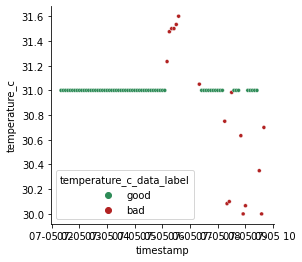

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 10


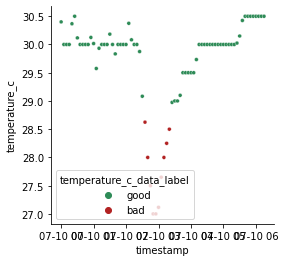

	Number of outliers for temperature_c: 1


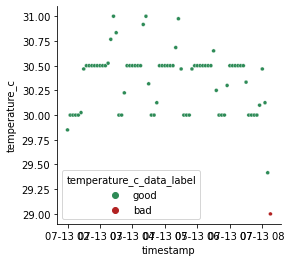

	Number of outliers for temperature_c: 11


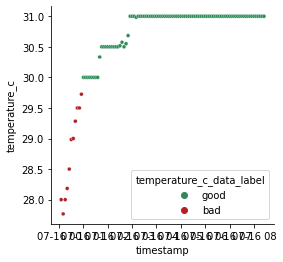

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 4


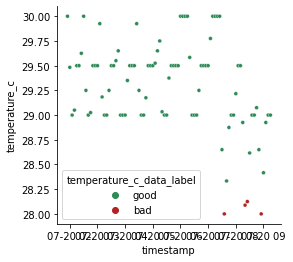

	Number of outliers for temperature_c: 5


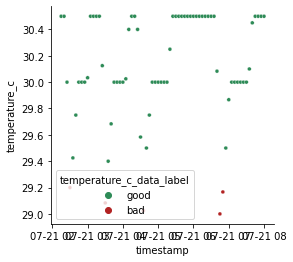

	Number of outliers for temperature_c: 31


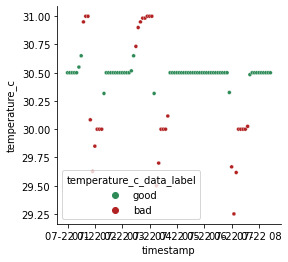

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 18


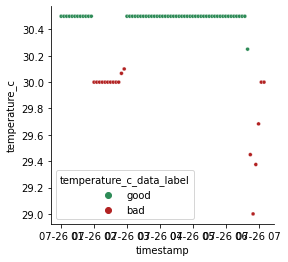

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 14


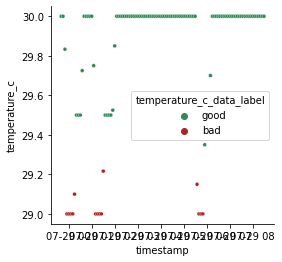

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 6


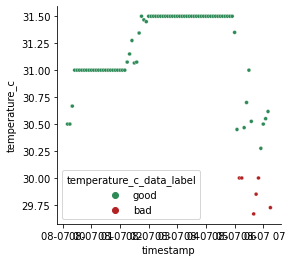

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 3


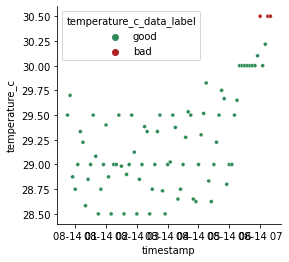

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
Beacon 24
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 1


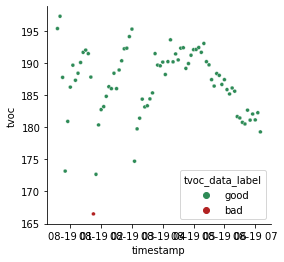

	Number of outliers for tvoc: 1


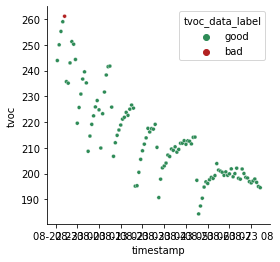

	Number of outliers for tvoc: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 2


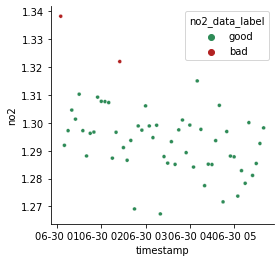

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 2


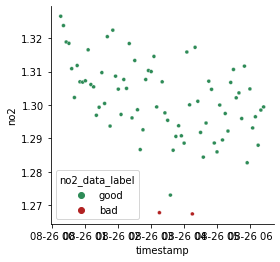

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


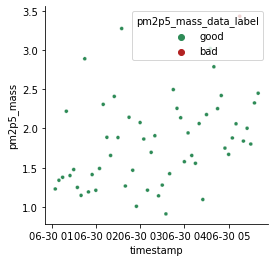

	Number of outliers for pm2p5_mass: 1


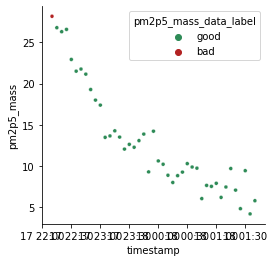

	Number of outliers for pm2p5_mass: 1


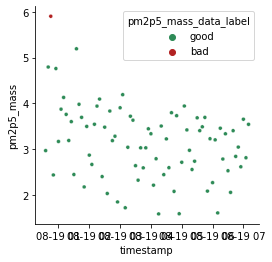

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


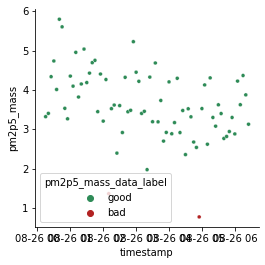

	Number of outliers for temperature_c: 22


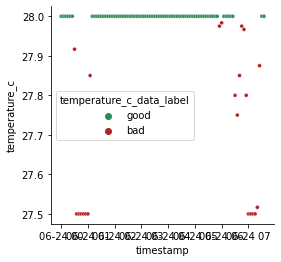

	Number of outliers for temperature_c: 11


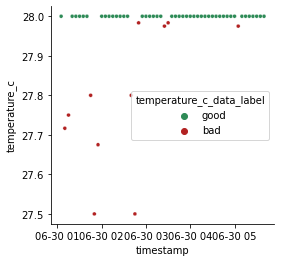

	Number of outliers for temperature_c: 1


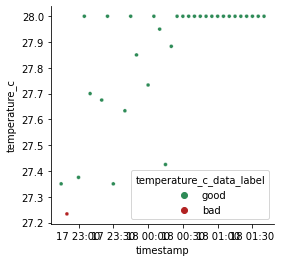

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
Beacon 11
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 7


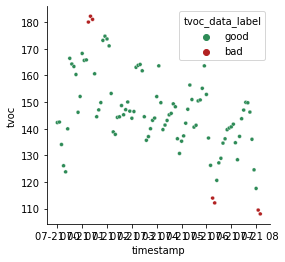

	Number of outliers for tvoc: 6


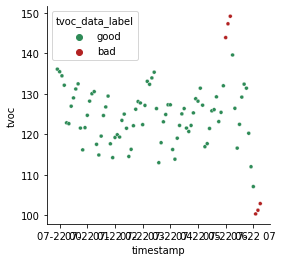

	Number of outliers for tvoc: 14


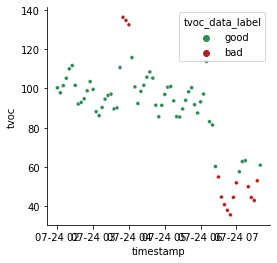

	Number of outliers for tvoc: 3


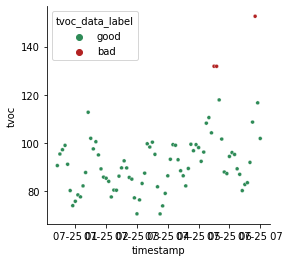

	Number of outliers for tvoc: 1


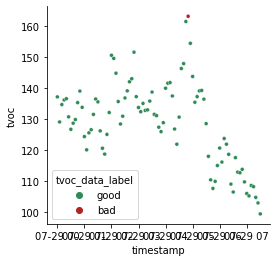

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 5


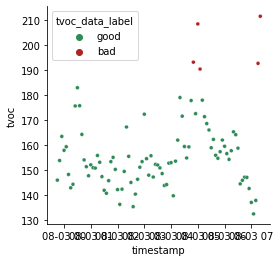

	Number of outliers for tvoc: 6


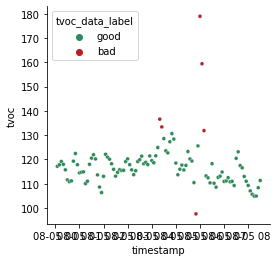

	Number of outliers for tvoc: 11


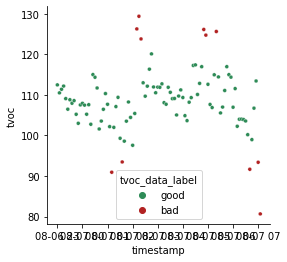

	Number of outliers for tvoc: 6


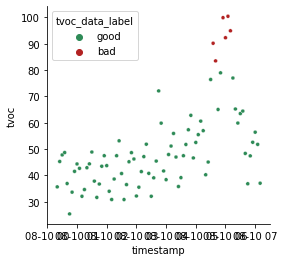

	Number of outliers for tvoc: 6


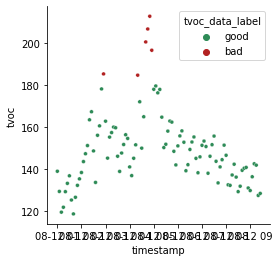

	Number of outliers for tvoc: 3


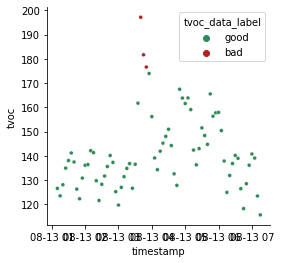

	Number of outliers for tvoc: 13


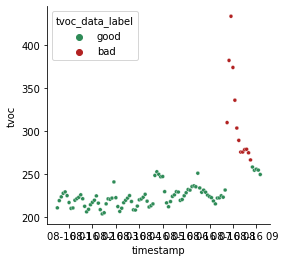

	Number of outliers for tvoc: 3


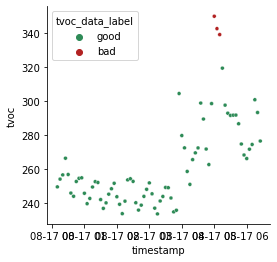

	Number of outliers for tvoc: 3


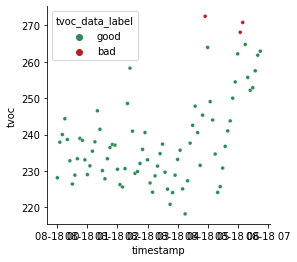

	Number of outliers for tvoc: 4


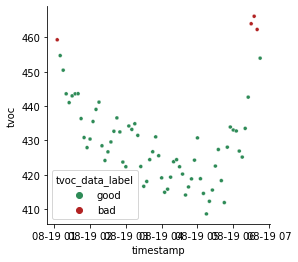

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 9


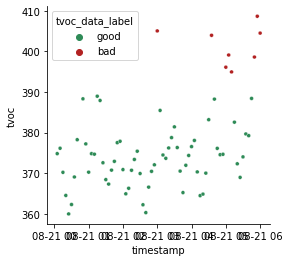

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 8


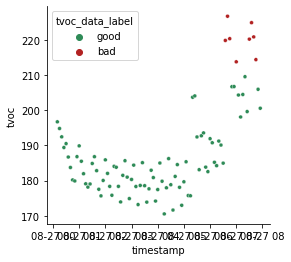

	Number of outliers for tvoc: 1


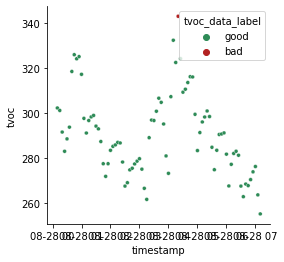

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 5


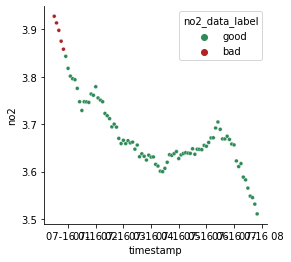

	Number of outliers for no2: 1


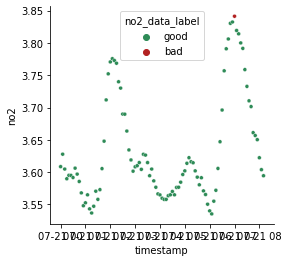

	Number of outliers for no2: 0
	Number of outliers for no2: 17


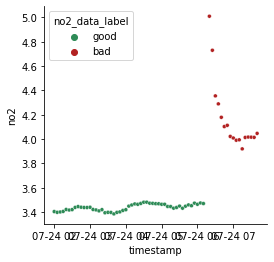

	Number of outliers for no2: 8


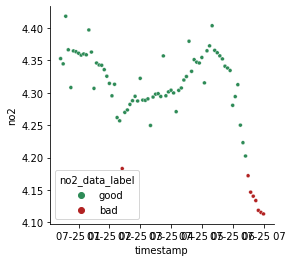

	Number of outliers for no2: 0
	Number of outliers for no2: 4


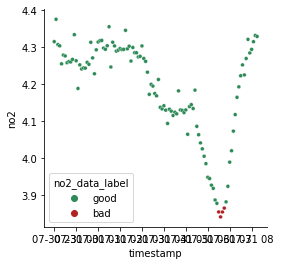

	Number of outliers for no2: 14


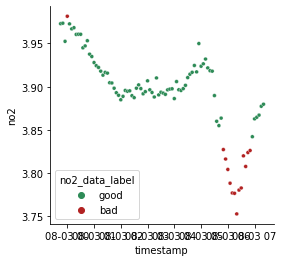

	Number of outliers for no2: 1


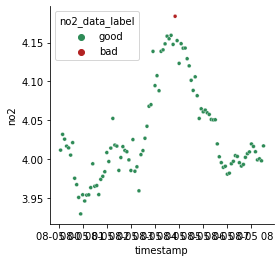

	Number of outliers for no2: 0
	Number of outliers for no2: 9


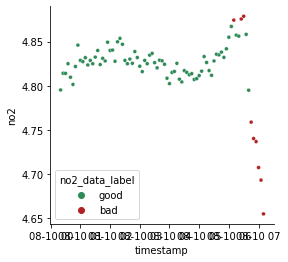

	Number of outliers for no2: 0
	Number of outliers for no2: 9


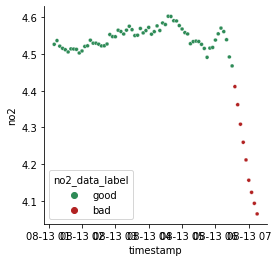

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 6


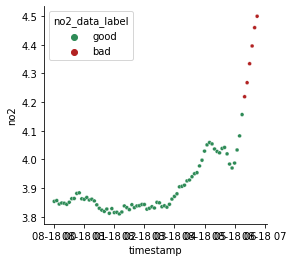

	Number of outliers for no2: 10


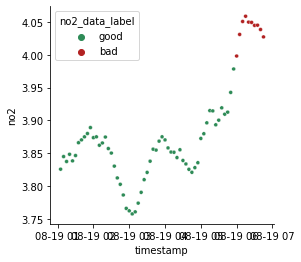

	Number of outliers for no2: 0
	Number of outliers for no2: 6


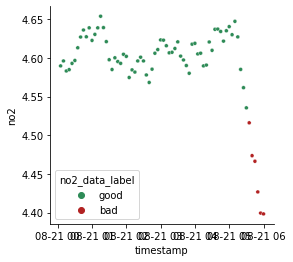

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 3


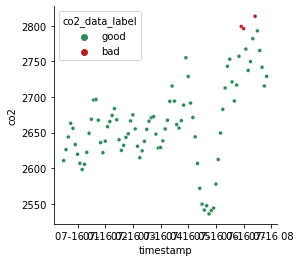

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 2


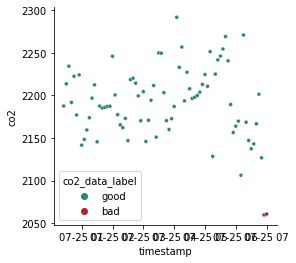

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 5


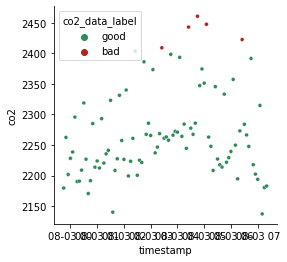

	Number of outliers for co2: 0
	Number of outliers for co2: 4


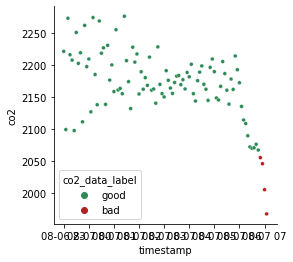

	Number of outliers for co2: 7


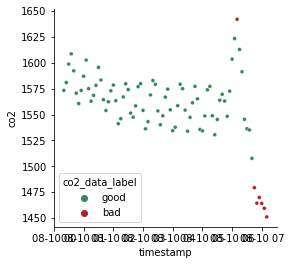

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 3


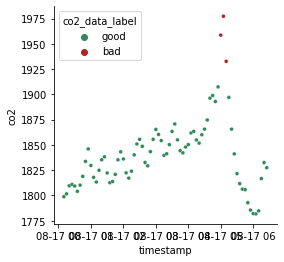

	Number of outliers for co2: 2


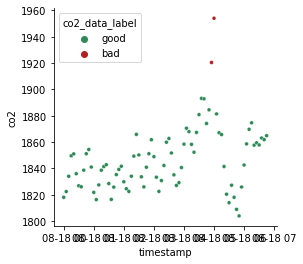

	Number of outliers for co2: 10


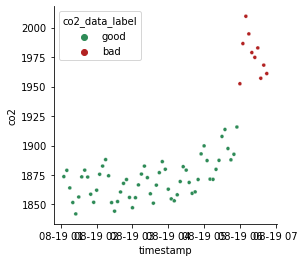

	Number of outliers for co2: 5


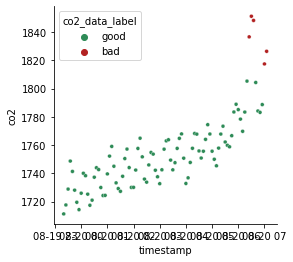

	Number of outliers for co2: 7


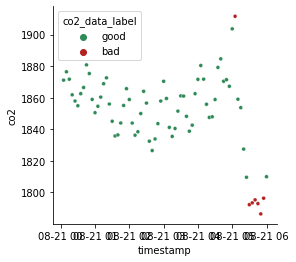

	Number of outliers for co2: 0
	Number of outliers for co2: 6


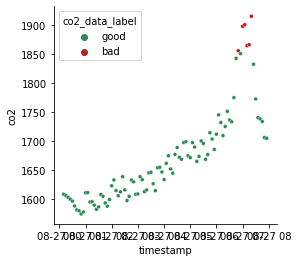

	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


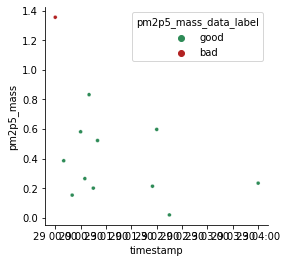

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for temperature_c: 22


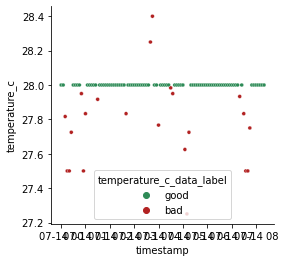

	Number of outliers for temperature_c: 12


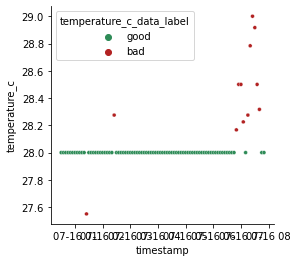

	Number of outliers for temperature_c: 18


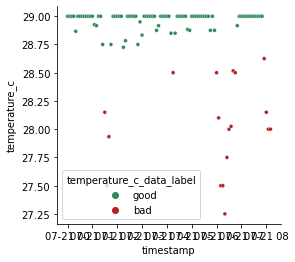

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 25


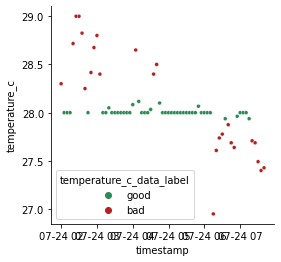

	Number of outliers for temperature_c: 5


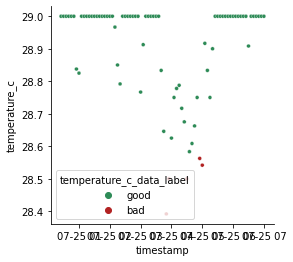

	Number of outliers for temperature_c: 3


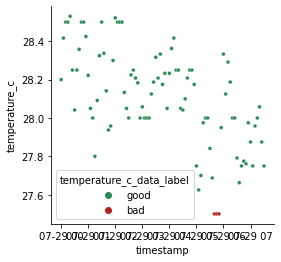

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 1


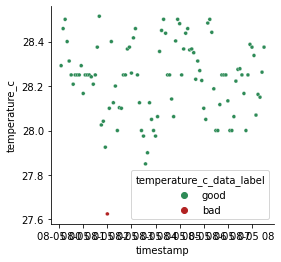

	Number of outliers for temperature_c: 12


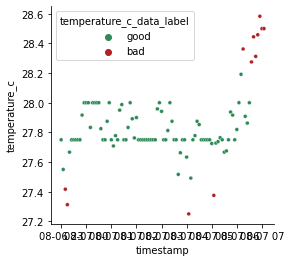

	Number of outliers for temperature_c: 16


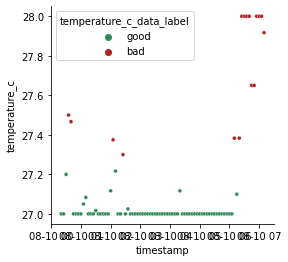

	Number of outliers for temperature_c: 14


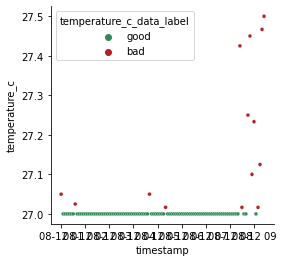

	Number of outliers for temperature_c: 1


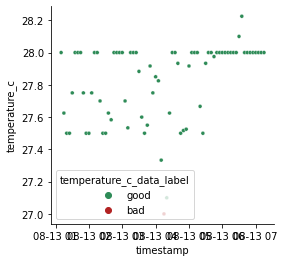

	Number of outliers for temperature_c: 6


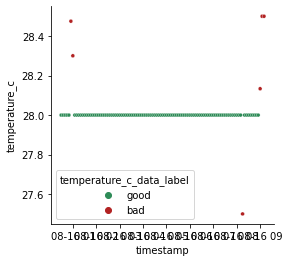

	Number of outliers for temperature_c: 15


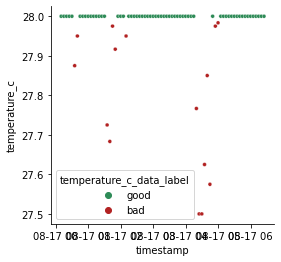

	Number of outliers for temperature_c: 12


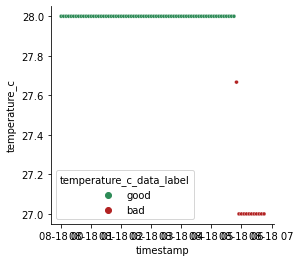

	Number of outliers for temperature_c: 6


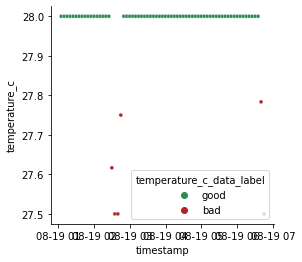

	Number of outliers for temperature_c: 3


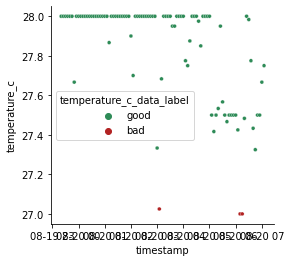

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 17


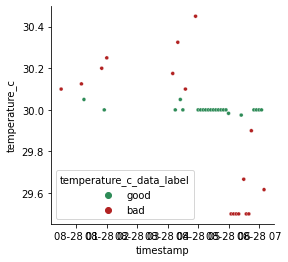

Beacon 28
	Number of outliers for tvoc: 1


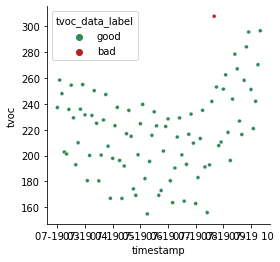

	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for co2: 1


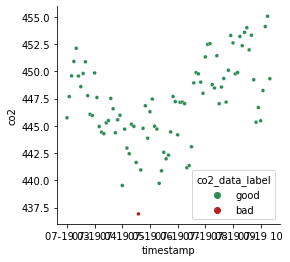

	Number of outliers for pm2p5_mass: 0
	Number of outliers for temperature_c: 3


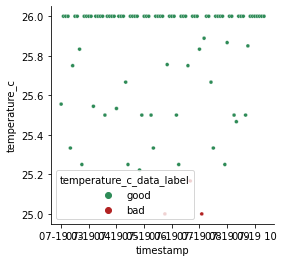

Beacon 36
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 7


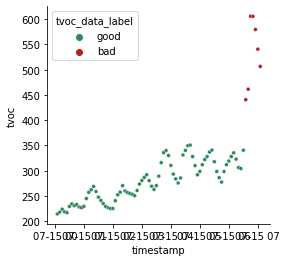

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 4


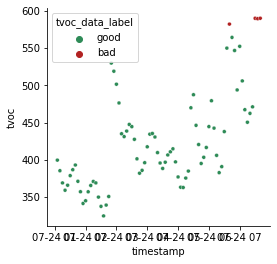

	Number of outliers for tvoc: 5


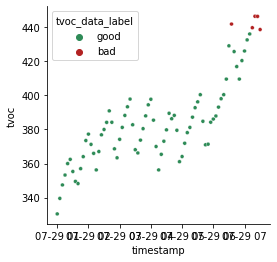

	Number of outliers for tvoc: 1


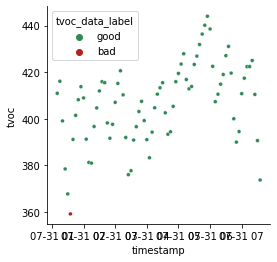

	Number of outliers for tvoc: 5


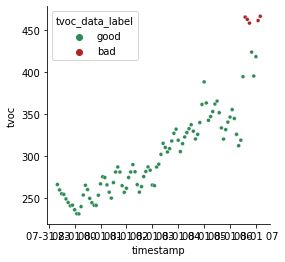

	Number of outliers for tvoc: 3


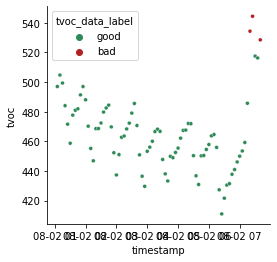

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 7


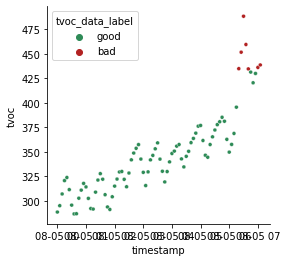

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 2


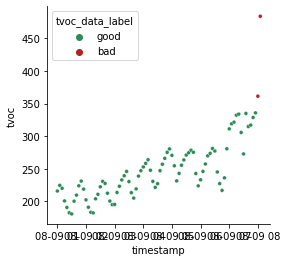

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 3


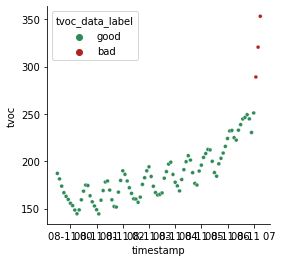

	Number of outliers for tvoc: 5


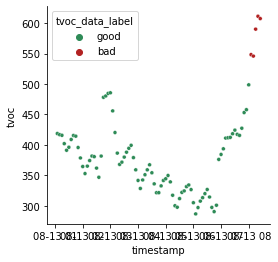

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 3


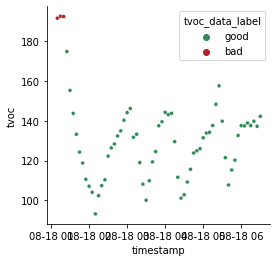

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 4


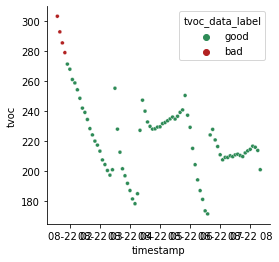

	Number of outliers for tvoc: 14


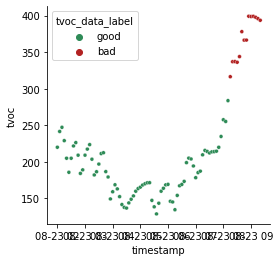

	Number of outliers for tvoc: 2


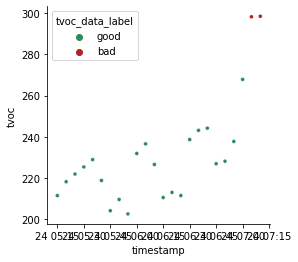

	Number of outliers for tvoc: 1


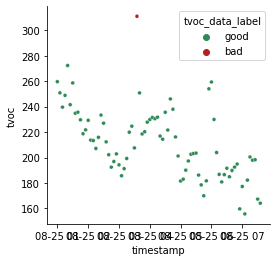

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for co: 0
	Number of outliers for co: 7


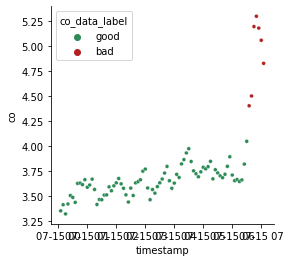

	Number of outliers for co: 3


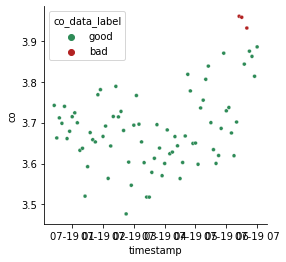

	Number of outliers for co: 5


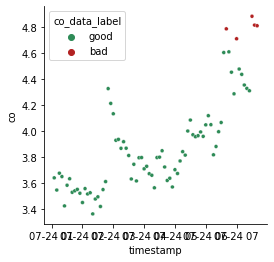

	Number of outliers for co: 1


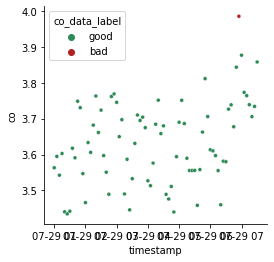

	Number of outliers for co: 0
	Number of outliers for co: 8


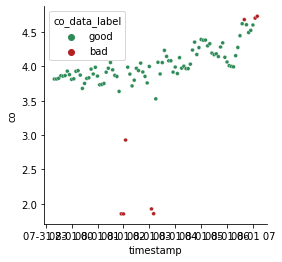

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 3


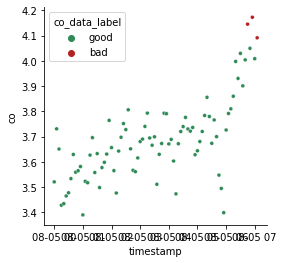

	Number of outliers for co: 2


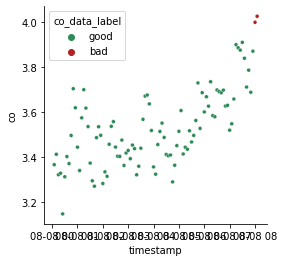

	Number of outliers for co: 2


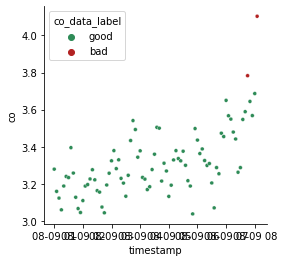

	Number of outliers for co: 2


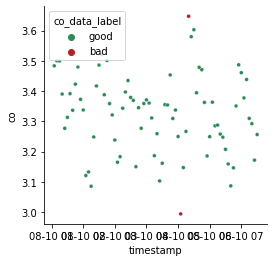

	Number of outliers for co: 0
	Number of outliers for co: 8


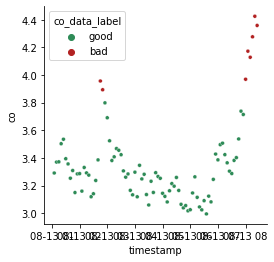

	Number of outliers for co: 7


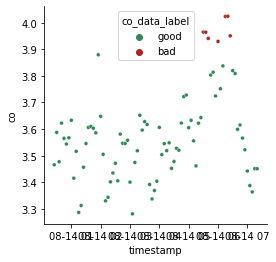

	Number of outliers for co: 0
	Number of outliers for co: 1


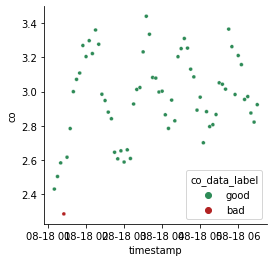

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 18


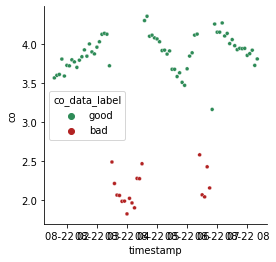

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 12


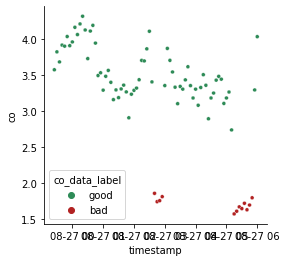

	Number of outliers for co: 0
	Number of outliers for co: 5


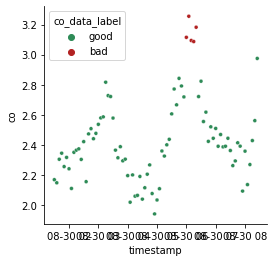

	Number of outliers for co: 12


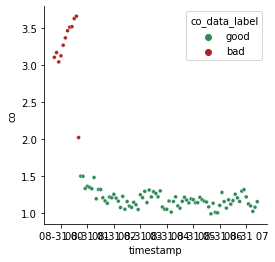

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of

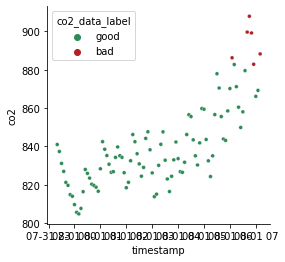

	Number of outliers for co2: 3


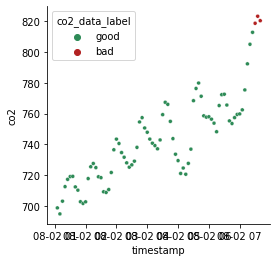

	Number of outliers for co2: 13


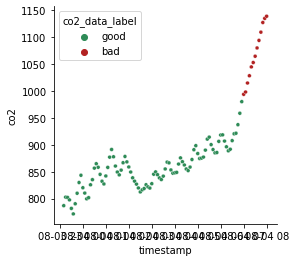

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 2


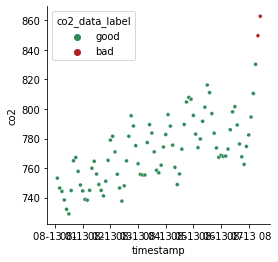

	Number of outliers for co2: 0
	Number of outliers for co2: 4


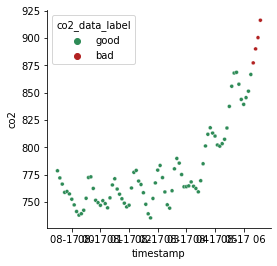

	Number of outliers for co2: 0
	Number of outliers for co2: 1


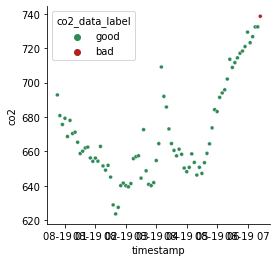

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 2


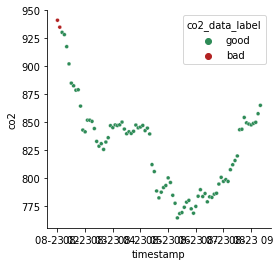

	Number of outliers for co2: 0
	Number of outliers for co2: 1


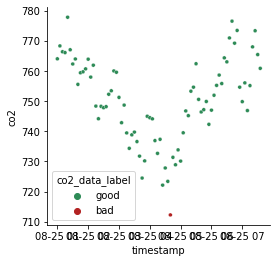

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 3


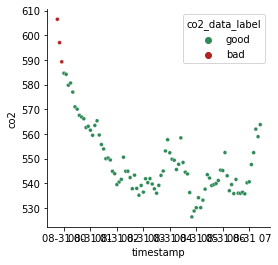

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for pm2p5_mass: 2


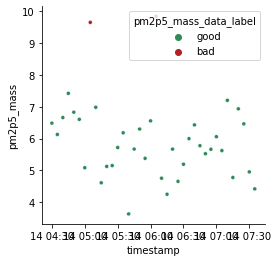

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


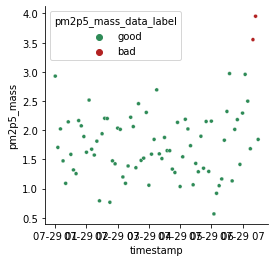

	Number of outliers for pm2p5_mass: 2


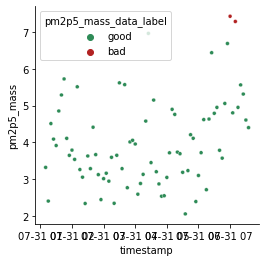

	Number of outliers for pm2p5_mass: 4


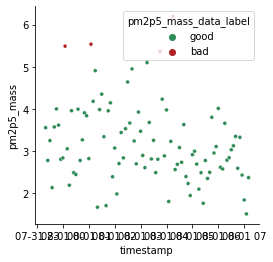

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 4


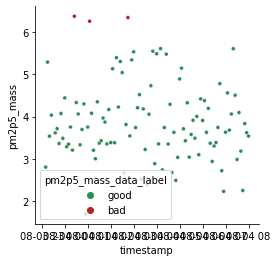

	Number of outliers for pm2p5_mass: 1


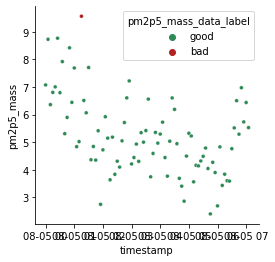

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


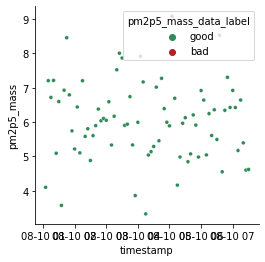

	Number of outliers for pm2p5_mass: 1


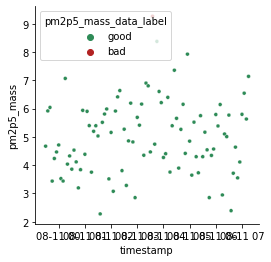

	Number of outliers for pm2p5_mass: 1


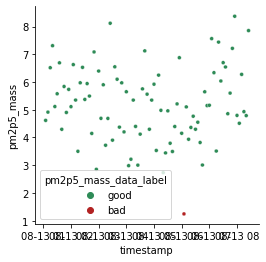

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


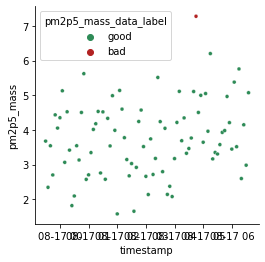

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


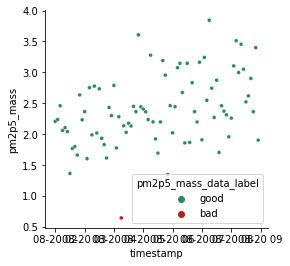

	Number of outliers for pm2p5_mass: 1


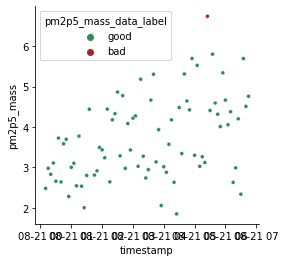

	Number of outliers for pm2p5_mass: 1


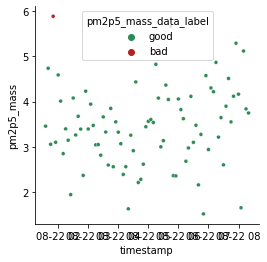

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 2


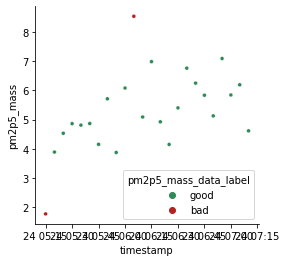

	Number of outliers for pm2p5_mass: 1


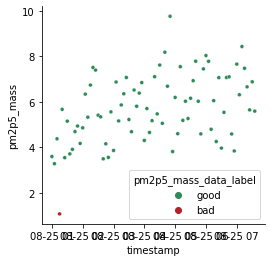

	Number of outliers for pm2p5_mass: 2


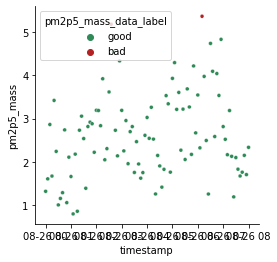

	Number of outliers for pm2p5_mass: 3


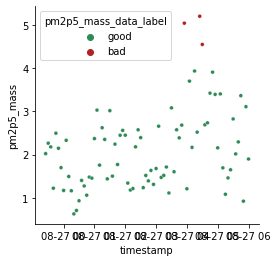

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


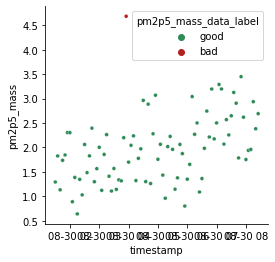

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for temperature_c: 6


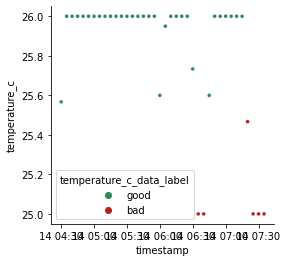

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 16


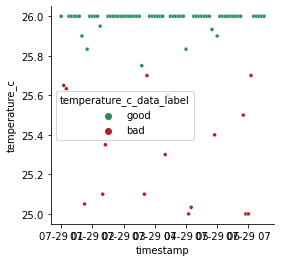

	Number of outliers for temperature_c: 14


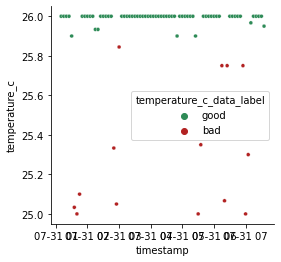

	Number of outliers for temperature_c: 2


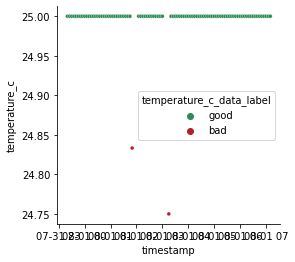

	Number of outliers for temperature_c: 10


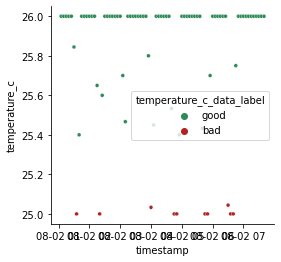

	Number of outliers for temperature_c: 9


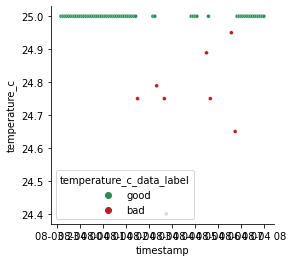

	Number of outliers for temperature_c: 11


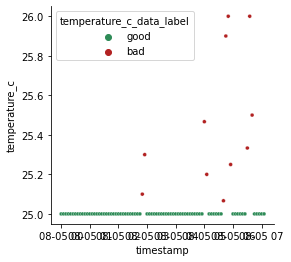

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 18


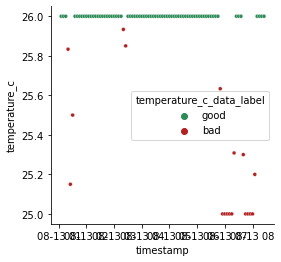

	Number of outliers for temperature_c: 11


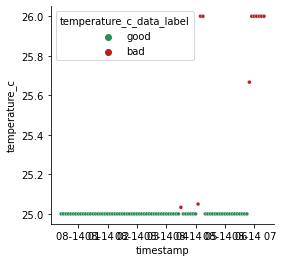

	Number of outliers for temperature_c: 15


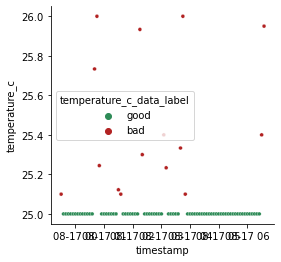

	Number of outliers for temperature_c: 16


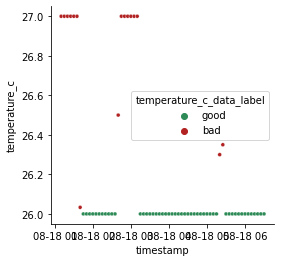

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 4


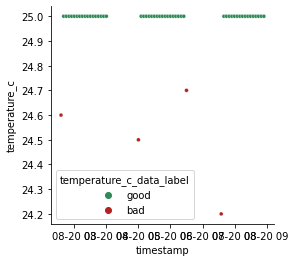

	Number of outliers for temperature_c: 4


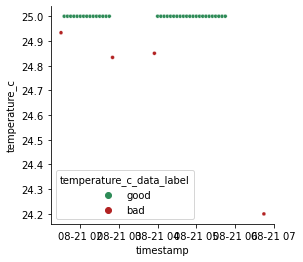

	Number of outliers for temperature_c: 17


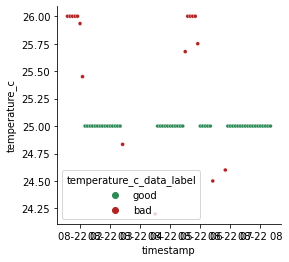

	Number of outliers for temperature_c: 26


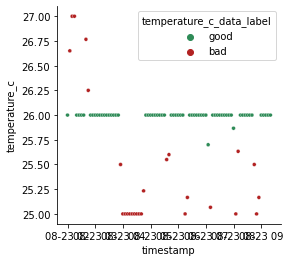

	Number of outliers for temperature_c: 4


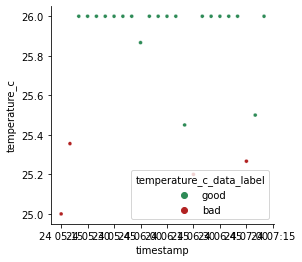

	Number of outliers for temperature_c: 18


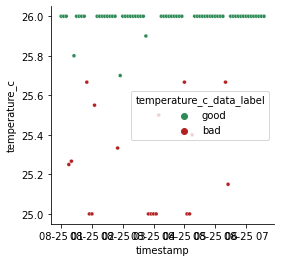

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 20


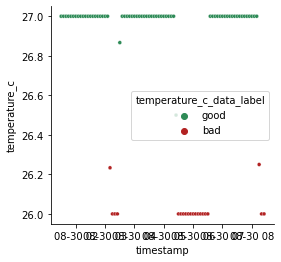

	Number of outliers for temperature_c: 2


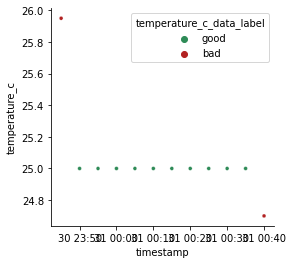

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 14


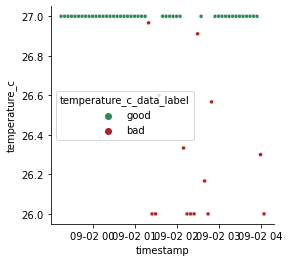

Beacon 17
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 6


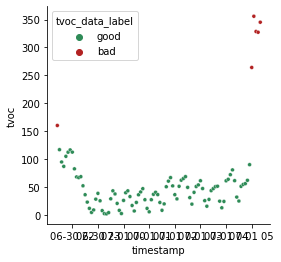

	Number of outliers for tvoc: 0
	Number of outliers for tvoc: 12


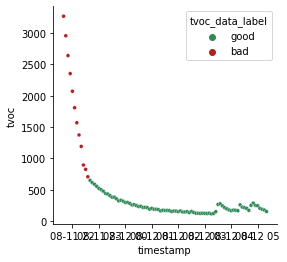

	Number of outliers for tvoc: 1


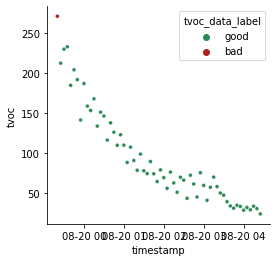

	Number of outliers for tvoc: 13


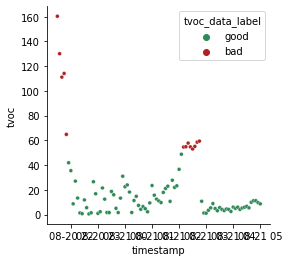

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for co: 5


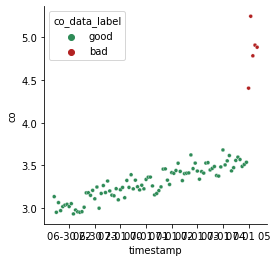

	Number of outliers for co: 0
	Number of outliers for co: 4


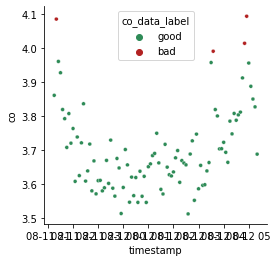

	Number of outliers for co: 0
	Number of outliers for co: 0
	Number of outliers for no2: 2


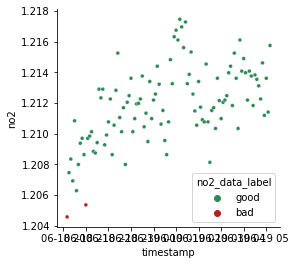

	Number of outliers for no2: 0
	Number of outliers for no2: 0
	Number of outliers for no2: 1


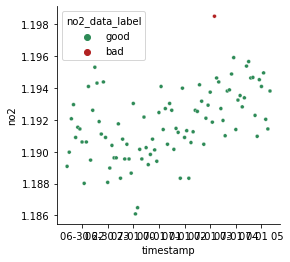

	Number of outliers for no2: 0
	Number of outliers for no2: 1


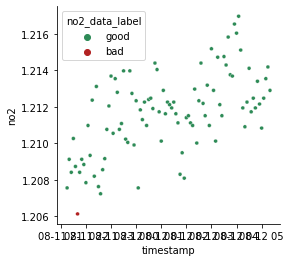

	Number of outliers for no2: 0
	Number of outliers for no2: 3


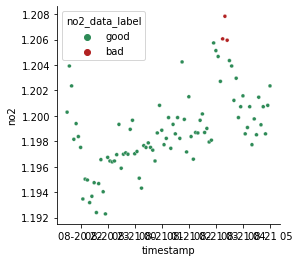

	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 0
	Number of outliers for co2: 8


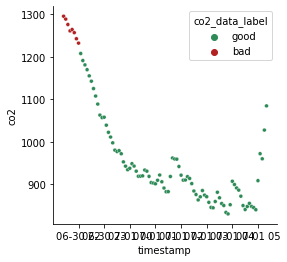

	Number of outliers for co2: 0
	Number of outliers for co2: 5


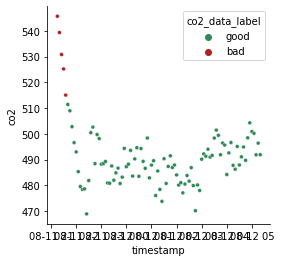

	Number of outliers for co2: 0
	Number of outliers for co2: 3


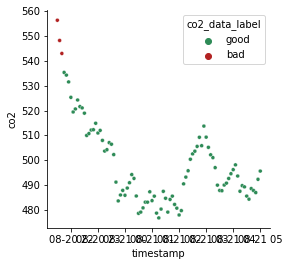

	Number of outliers for pm2p5_mass: 4


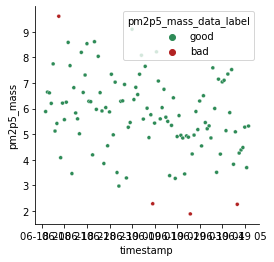

	Number of outliers for pm2p5_mass: 2


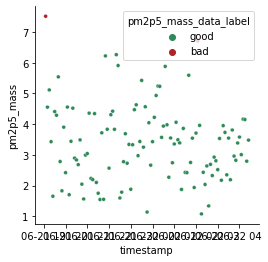

	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 0
	Number of outliers for pm2p5_mass: 1


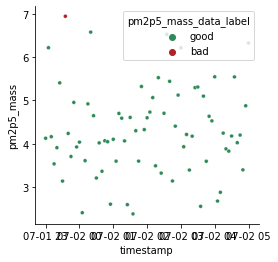

	Number of outliers for pm2p5_mass: 11


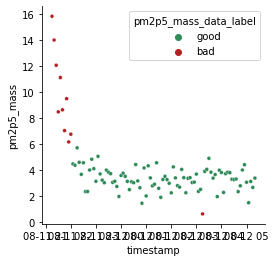

	Number of outliers for pm2p5_mass: 5


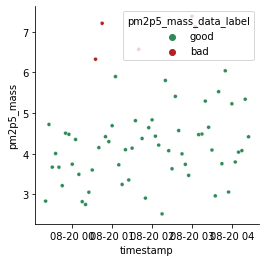

	Number of outliers for pm2p5_mass: 2


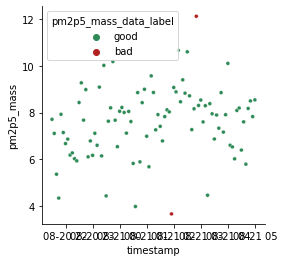

	Number of outliers for temperature_c: 26


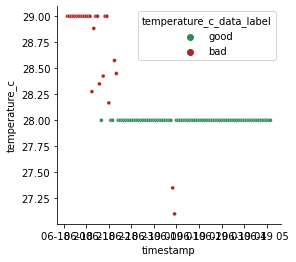

	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 0
	Number of outliers for temperature_c: 5


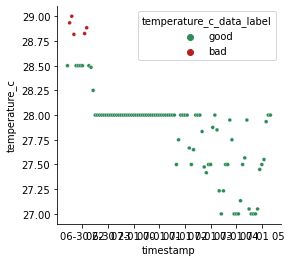

	Number of outliers for temperature_c: 19


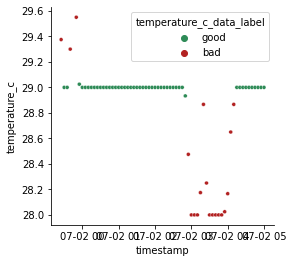

	Number of outliers for temperature_c: 27


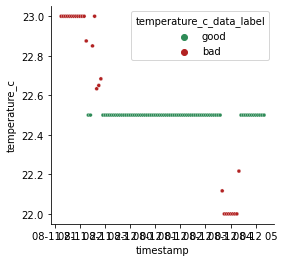

	Number of outliers for temperature_c: 3


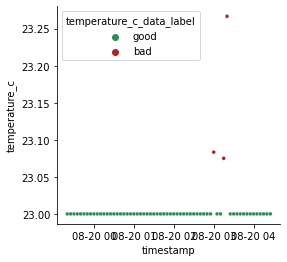

	Number of outliers for temperature_c: 19


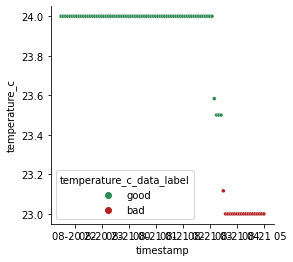

In [52]:
for bb in data["beacon"].unique():
    print("Beacon",bb)
    data_by_bb = data[data["beacon"] == bb]
    for param in params:
        for st in data_by_bb["start_time"].unique():
            data_by_night = data_by_bb[data_by_bb["start_time"] == st]
            outliers, labels = iqr_outliers(data_by_night[param])
            data_by_night[f"{param}_data_label"] = labels
            print(f"\tNumber of outliers for {param}: {len(outliers)}")
            if len(outliers) > 0:
                fig, ax = plt.subplots(figsize=(4,4))
                sns.scatterplot(x="timestamp",y=param,hue=f"{param}_data_label",hue_order=["good","bad"],palette=["seagreen","firebrick"],data=data_by_night,s=15,ax=ax)
                for loc in ["top","right"]:
                    ax.spines[loc].set_visible(False)

                plt.show()
                plt.close()